# Pipeline integrado: spreads, Mallat y evaluación de divergencias

Este notebook combina el trabajo de las Personas 1, 2, 3 y 4:

1. Persona 1 obtiene y valida los precios ajustados.
2. Persona 2 construye índices *leave-one-out* y spreads relativos.
3. Persona 3 analiza las escalas temporales con FFT y Mallat, y genera una referencia lenta ex ante y un residuo.
4. Persona 4 normaliza esos residuos, detecta eventos, mide convergencia y compara Mallat con baselines causales.

El objetivo es separar la estructura lenta del spread de sus desviaciones rápidas o intermedias y evaluar si las divergencias extremas muestran una reversión real. La descomposición sobre la muestra completa se utiliza de forma descriptiva. La versión rolling se calcula únicamente con información disponible hasta cada fecha. Para construir una referencia estrictamente ex ante, la aproximación rolling se desplaza una rueda antes de calcular el residuo.

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt

SEED = 42

## Carga de spreads


In [2]:
RUTAS_CANDIDATAS_SPREADS = [
    Path("data/spreads.csv"),
    Path("spreads.csv"),
    Path("../data/spreads.csv")
]

DATA_PATH = next(
    (
        ruta
        for ruta in RUTAS_CANDIDATAS_SPREADS
        if ruta.exists()
    ),
    None
)

if DATA_PATH is None:
    rutas_mostradas = "\n".join(
        f"- {ruta.resolve()}"
        for ruta in RUTAS_CANDIDATAS_SPREADS
    )

    raise FileNotFoundError(
        "No se encontró spreads.csv. Se revisaron estas rutas:\n"
        f"{rutas_mostradas}\n"
        "Ubicá el archivo en data/spreads.csv o modificá "
        "RUTAS_CANDIDATAS_SPREADS."
    )

spreads_df = pd.read_csv(
    DATA_PATH,
    index_col=0,
    parse_dates=True
).sort_index()

# Conversión explícita: un valor no numérico queda como NaN y será
# detectado por la validación siguiente.
spreads_df = spreads_df.apply(
    pd.to_numeric,
    errors="coerce"
)

print(f"Archivo utilizado: {DATA_PATH.resolve()}")
print(f"Shape: {spreads_df.shape}")
print(f"Columnas: {list(spreads_df.columns)}")
print(
    f"Rango: {spreads_df.index[0].date()} "
    f"a {spreads_df.index[-1].date()}"
)
display(spreads_df.head())

Archivo utilizado: C:\Users\Giovanni\Desktop\proyecto_finanzas\data\spreads.csv
Shape: (3771, 7)
Columnas: ['GGAL', 'BMA', 'BBAR', 'YPF', 'TGS', 'EDN', 'PAM']
Rango: 2011-01-03 a 2025-12-30


,GGAL,BMA,BBAR,YPF,TGS,EDN,PAM
Date,,,,,,,
2011-01-03,-0.164600,-0.154763,-0.165260,0.192031,0.088933,0.129350,0.088465
2011-01-04,-0.161334,-0.149328,-0.170463,0.234255,0.088162,0.096200,0.067459
2011-01-05,-0.135254,-0.181598,-0.188460,0.251507,0.084436,0.080659,0.083541
2011-01-06,-0.123670,-0.167205,-0.182905,0.239580,0.075471,0.090496,0.062781
2011-01-07,-0.123577,-0.136912,-0.178291,0.205030,0.071685,0.089198,0.066419


## Validación del DataFrame


In [3]:
def validar_spreads(spreads: pd.DataFrame) -> None:
    """
    Valida que el input tenga el formato esperado
    por el módulo de procesamiento de señales.
    """
    if not isinstance(spreads, pd.DataFrame):
        raise TypeError(
            "El input debe ser un pandas DataFrame."
        )

    if not isinstance(spreads.index, pd.DatetimeIndex):
        raise TypeError(
            "El índice debe ser un DatetimeIndex."
        )

    if not spreads.index.is_monotonic_increasing:
        raise ValueError(
            "Las fechas deben estar ordenadas."
        )

    if not spreads.index.is_unique:
        raise ValueError(
            "Hay fechas duplicadas."
        )

    columnas_no_numericas = (
        spreads.select_dtypes(exclude="number").columns
    )

    if len(columnas_no_numericas) > 0:
        raise TypeError(
            "Todas las columnas deben ser numéricas. "
            f"Columnas problemáticas: "
            f"{list(columnas_no_numericas)}"
        )

    if spreads.isna().all().any():
        columnas_vacias = spreads.columns[
            spreads.isna().all()
        ].tolist()

        raise ValueError(
            "Hay columnas completamente vacías: "
            f"{columnas_vacias}"
        )

    if spreads.isna().any().any():
        faltantes_por_columna = (
            spreads.isna().sum()
        )
        faltantes_por_columna = faltantes_por_columna[
            faltantes_por_columna > 0
        ].to_dict()

        raise ValueError(
            "Mallat rolling requiere series completas. "
            "Hay valores faltantes por columna: "
            f"{faltantes_por_columna}. "
            "Resolvelos en la construcción de los spreads; "
            "no se imputan silenciosamente en este notebook."
        )

    print("El DataFrame cumple el contrato.")
    print(f"Observaciones: {len(spreads):,}")
    print(f"Señales: {spreads.shape[1]}")
    print(
        f"Período: {spreads.index.min().date()} "
        f"a {spreads.index.max().date()}"
    )


validar_spreads(spreads_df)


El DataFrame cumple el contrato.
Observaciones: 3,771
Señales: 7
Período: 2011-01-03 a 2025-12-30


## Visualizamos los Spreads Reales


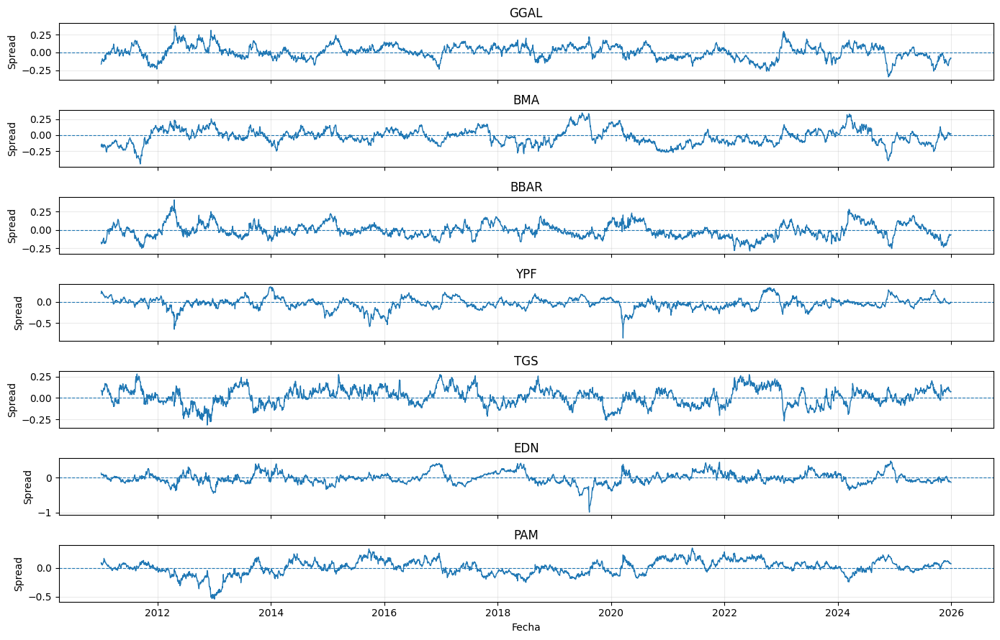

In [4]:
fig, axes = plt.subplots(
    nrows=len(spreads_df.columns),
    ncols=1,
    figsize=(14, 9),
    sharex=True
)

axes = np.atleast_1d(axes)

for ax, columna in zip(axes, spreads_df.columns):
    ax.plot(
        spreads_df.index,
        spreads_df[columna],
        linewidth=1
    )

    ax.axhline(
        y=0,
        linestyle="--",
        linewidth=0.8
    )

    ax.set_title(columna)
    ax.set_ylabel("Spread")
    ax.grid(alpha=0.25)

axes[-1].set_xlabel("Fecha")

plt.tight_layout()
plt.show()

# 1. FFT descriptiva

La FFT permite identificar qué escalas temporales tienen presencia global en cada spread. Una frecuencia alta corresponde a movimientos rápidos y una frecuencia baja a movimientos lentos. Su limitación es que no indica en qué fecha aparece cada movimiento.

## Pregunta descriptiva

¿Qué escalas temporales aparecen en cada spread?

- Frecuencia alta: movimientos rápidos.
- Frecuencia baja: movimientos lentos.
- La FFT describe la muestra completa, pero no localiza temporalmente los eventos.

## Espectro de Fourier

La función devuelve:

- **Frecuencia:** cantidad de oscilaciones por rueda.
- **Período:** cantidad aproximada de ruedas por oscilación.
- **Amplitud:** magnitud asociada a cada frecuencia.
- **Potencia:** contribución relativa de esa frecuencia a la variación de la señal.

In [5]:
def calcular_espectro_fft(
    serie: pd.Series,
    paso_temporal: float = 1.0
) -> pd.DataFrame:
    """
    Calcula el espectro de Fourier unilateral de una serie temporal.

    Parámetros
    ----------
    serie:
        Señal temporal. En nuestro proyecto será un spread.

    paso_temporal:
        Distancia entre observaciones.
        Como tenemos una observación por rueda, usamos 1.

    Devuelve
    --------
    DataFrame con:
        - frecuencia
        - período equivalente
        - amplitud
        - potencia
        - proporción de potencia
    """
    serie_limpia = serie.dropna().astype(float)

    if len(serie_limpia) < 4:
        raise ValueError(
            "La serie necesita al menos cuatro observaciones."
        )

    # Quitamos la media porque no queremos que la componente
    # constante domine el espectro.
    señal_centrada = (
        serie_limpia - serie_limpia.mean()
    ).to_numpy()

    n = len(señal_centrada)

    # FFT para señales reales.
    coeficientes = np.fft.rfft(señal_centrada)

    # Frecuencias positivas, incluida frecuencia cero.
    frecuencias = np.fft.rfftfreq(
        n=n,
        d=paso_temporal
    )

    # Amplitud unilateral.
    amplitudes = np.abs(coeficientes) / n

    # Se duplican las componentes positivas porque rfft
    # solamente conserva la mitad del espectro.
    if n % 2 == 0:
        amplitudes[1:-1] *= 2
    else:
        amplitudes[1:] *= 2

    # Potencia asociada a cada frecuencia.
    potencia = np.abs(coeficientes) ** 2 / n

    potencia_total = potencia.sum()

    if potencia_total > 0:
        proporcion_potencia = potencia / potencia_total
    else:
        proporcion_potencia = np.zeros_like(potencia)

    # Período = 1 / frecuencia.
    # La frecuencia cero tiene período infinito.
    periodos = np.full_like(
        frecuencias,
        fill_value=np.inf,
        dtype=float
    )

    mascara_no_cero = frecuencias > 0

    periodos[mascara_no_cero] = (
        1 / frecuencias[mascara_no_cero]
    )

    espectro = pd.DataFrame(
        {
            "frecuencia": frecuencias,
            "periodo_ruedas": periodos,
            "amplitud": amplitudes,
            "potencia": potencia,
            "proporcion_potencia": proporcion_potencia
        }
    )

    return espectro

## Calculamos los espectros de todos los spreads

In [6]:
resultados_fft = {
    columna: calcular_espectro_fft(spreads_df[columna])
    for columna in spreads_df.columns
}

resultados_fft[list(resultados_fft.keys())[0]].head()


,frecuencia,periodo_ruedas,amplitud,potencia,proporcion_potencia
0,0.000000,inf,1.059879e-18,4.236127e-33,2.386215e-34
1,0.000265,3771.00,3.114345e-02,9.143870e-01,5.150753e-02
2,0.000530,1885.50,1.623586e-02,2.485117e-01,1.399870e-02
3,0.000796,1257.00,2.012924e-02,3.819895e-01,2.151752e-02
4,0.001061,942.75,4.316865e-02,1.756845e+00,9.896330e-02


### Graficamos señal y espectro

In [7]:
def graficar_fft(
    serie: pd.Series,
    espectro: pd.DataFrame,
    titulo: str,
    periodo_minimo: float = 2,
    periodo_maximo: float = 700
) -> None:
    """
    Grafica una señal temporal y su espectro
    expresado en períodos.
    """
    espectro_grafico = espectro[
        (espectro["frecuencia"] > 0)
        & (
            espectro["periodo_ruedas"]
            >= periodo_minimo
        )
        & (
            espectro["periodo_ruedas"]
            <= periodo_maximo
        )
    ].copy()

    espectro_grafico = espectro_grafico.sort_values(
        "periodo_ruedas"
    )

    fig, axes = plt.subplots(
        nrows=2,
        ncols=1,
        figsize=(14, 8)
    )

    # Señal temporal.
    axes[0].plot(
        serie.index,
        serie.values,
        linewidth=1
    )

    axes[0].axhline(
        y=serie.mean(),
        linestyle="--",
        linewidth=0.8
    )

    axes[0].set_title(
        f"Señal temporal — {titulo}"
    )
    axes[0].set_ylabel("Spread")
    axes[0].grid(alpha=0.25)

    # Espectro.
    axes[1].plot(
        espectro_grafico["periodo_ruedas"],
        espectro_grafico["amplitud"],
        linewidth=1
    )

    axes[1].set_xscale("log")

    axes[1].set_title(
        "Espectro global de Fourier"
    )
    axes[1].set_xlabel(
        "Período aproximado, en ruedas"
    )
    axes[1].set_ylabel("Amplitud")
    axes[1].grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

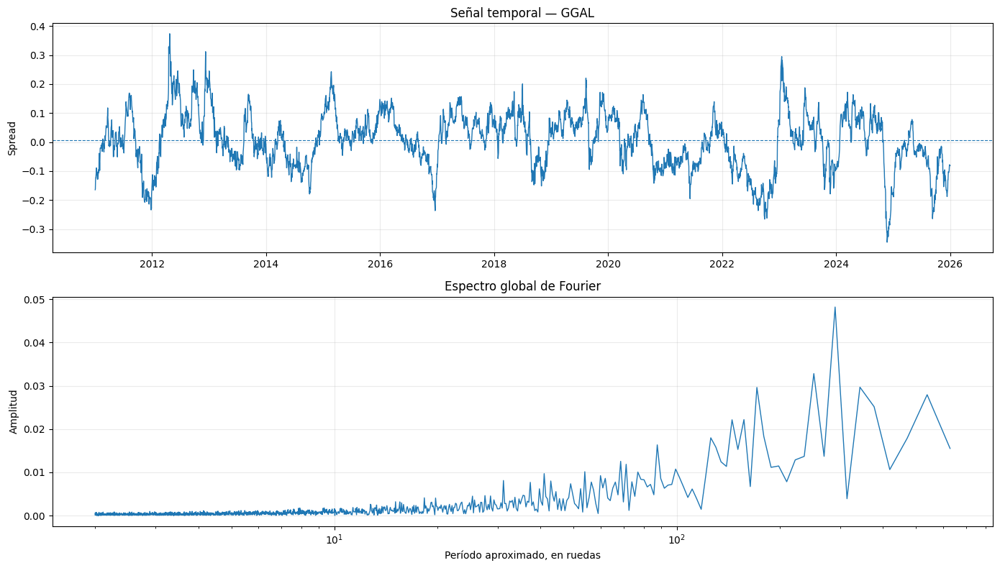

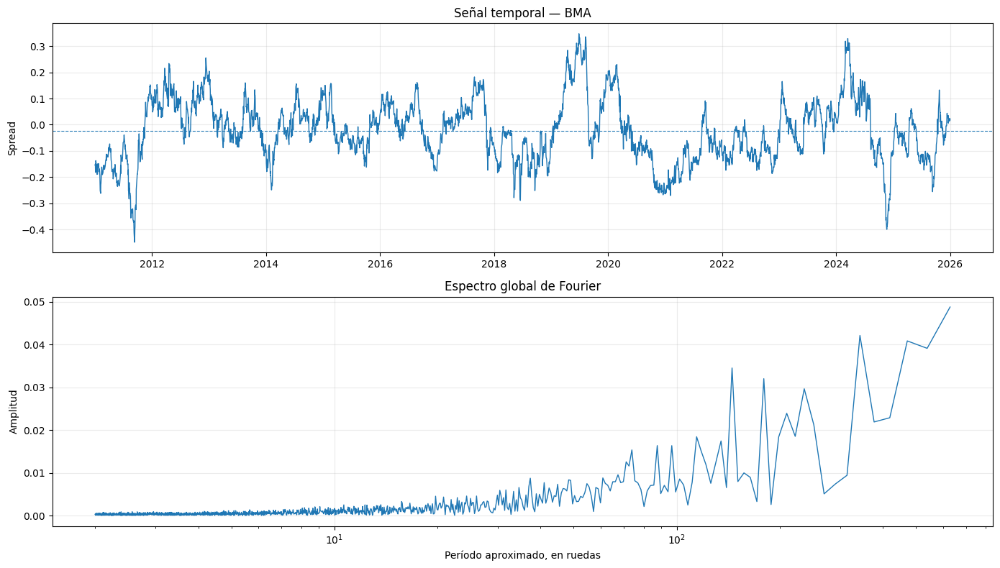

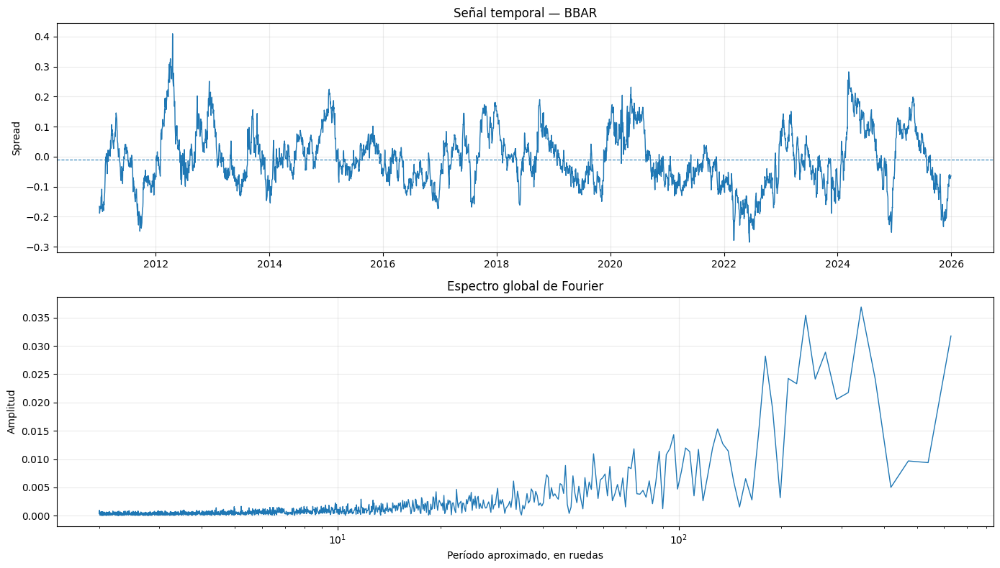

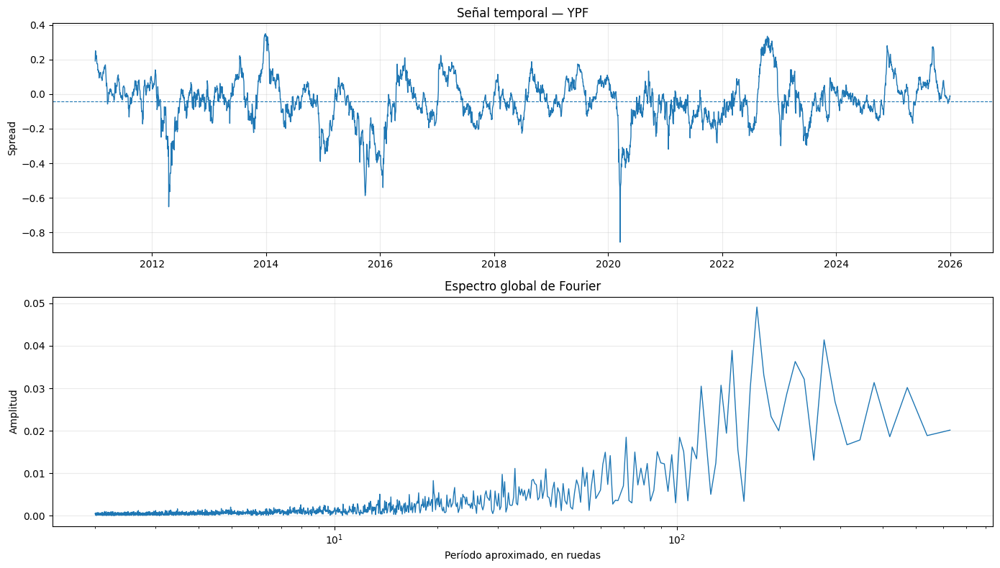

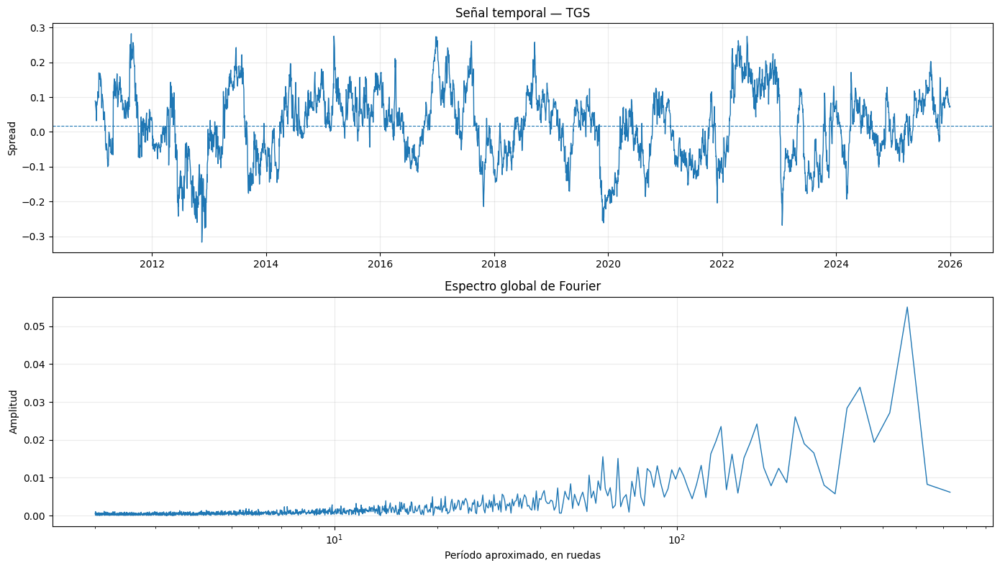

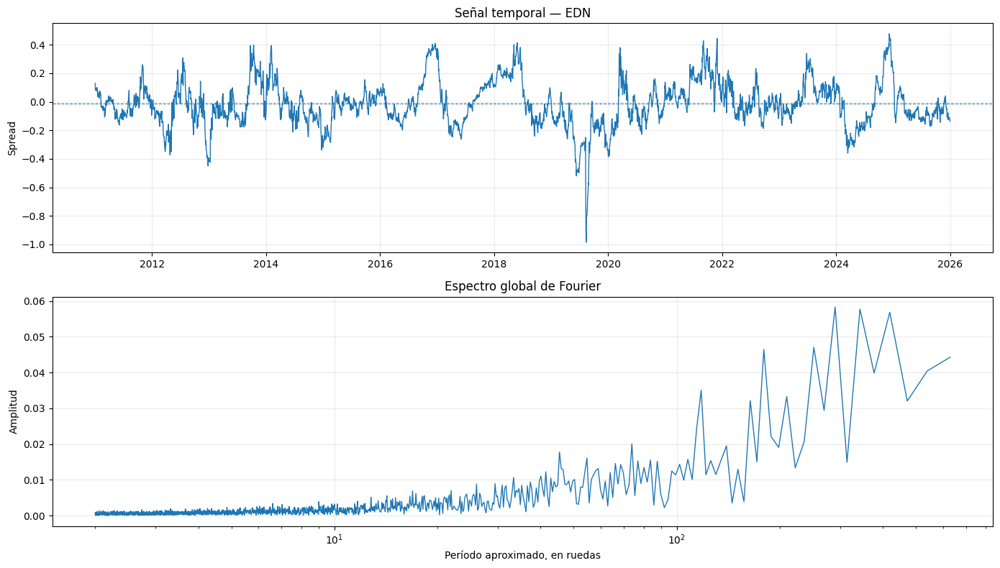

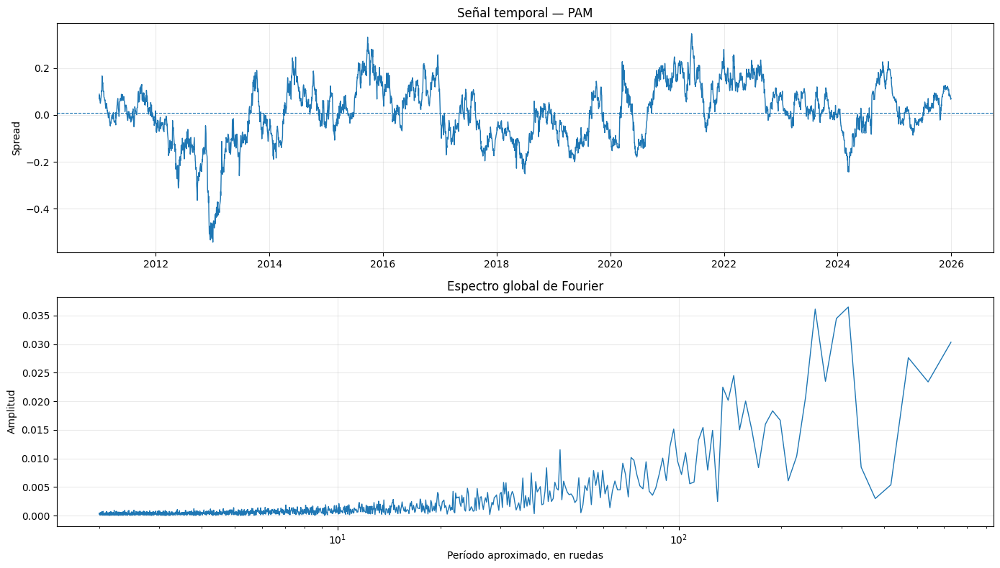

In [8]:
for columna in spreads_df.columns:
    graficar_fft(
        serie=spreads_df[columna],
        espectro=resultados_fft[columna],
        titulo=columna
    )

### Sacamos los picos principales

In [9]:
def obtener_picos_fft(
    espectro: pd.DataFrame,
    cantidad: int = 5,
    periodo_minimo: float = 5,
    periodo_maximo: float = 700
) -> pd.DataFrame:
    """
    Obtiene los principales máximos locales del espectro.
    """
    datos = espectro[
        (espectro["frecuencia"] > 0)
        & (
            espectro["periodo_ruedas"]
            >= periodo_minimo
        )
        & (
            espectro["periodo_ruedas"]
            <= periodo_maximo
        )
    ].copy()

    datos = datos.sort_values(
        "frecuencia"
    ).reset_index(drop=True)

    amplitudes = datos["amplitud"].to_numpy()

    if len(amplitudes) < 3:
        return pd.DataFrame()

    es_maximo_local = np.zeros(
        len(datos),
        dtype=bool
    )

    es_maximo_local[1:-1] = (
        (amplitudes[1:-1] > amplitudes[:-2])
        & (amplitudes[1:-1] >= amplitudes[2:])
    )

    picos = datos[es_maximo_local].copy()

    picos = picos.nlargest(
        cantidad,
        columns="amplitud"
    )

    return picos[
        [
            "frecuencia",
            "periodo_ruedas",
            "amplitud",
            "proporcion_potencia"
        ]
    ].reset_index(drop=True)

In [10]:
picos_por_señal = {}

for columna, espectro in resultados_fft.items():
    picos = obtener_picos_fft(
        espectro,
        cantidad=6
    )

    picos_por_señal[columna] = picos

    print(f"\nPrincipales picos de {columna}")
    display(picos)


Principales picos de GGAL


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.003447,290.076923,0.048223,0.123493
1,0.003978,251.400000,0.032832,0.057243
2,0.002917,342.818182,0.029688,0.046806
3,0.005834,171.409091,0.029636,0.046643
4,0.001856,538.714286,0.027945,0.041472
5,0.006364,157.125000,0.022199,0.026170



Principales picos de BMA


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.002917,342.818182,0.042151,0.064004
1,0.002121,471.375000,0.040872,0.060178
2,0.006895,145.038462,0.034542,0.042982
3,0.005569,179.571429,0.032036,0.036972
4,0.004243,235.687500,0.029676,0.031725
5,0.004773,209.500000,0.023940,0.020646



Principales picos de BBAR


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.002917,342.818182,0.036879,0.075619
1,0.004243,235.687500,0.035434,0.069811
2,0.003713,269.357143,0.028891,0.046408
3,0.005569,179.571429,0.028202,0.044222
4,0.004773,209.500000,0.024249,0.032694
5,0.007690,130.034483,0.015323,0.013054



Principales picos de YPF


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.005834,171.409091,0.049139,0.069078
1,0.003713,269.357143,0.041403,0.049039
2,0.006895,145.038462,0.038924,0.043343
3,0.004508,221.823529,0.036302,0.037700
4,0.002652,377.100000,0.031349,0.028114
5,0.007425,134.678571,0.030722,0.027001



Principales picos de TGS


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.002121,471.375000,0.055079,0.150295
1,0.002917,342.818182,0.033890,0.056901
2,0.004508,221.823529,0.026078,0.033692
3,0.005834,171.409091,0.024204,0.029022
4,0.007425,134.678571,0.023536,0.027442
5,0.006895,145.038462,0.016218,0.013031



Principales picos de EDN


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.003447,290.076923,0.058339,0.067772
1,0.002917,342.818182,0.057757,0.066425
2,0.002387,419.000000,0.056857,0.064373
3,0.003978,251.400000,0.047070,0.044119
4,0.005569,179.571429,0.046476,0.043012
5,0.008486,117.843750,0.035107,0.024543



Principales picos de PAM


,frecuencia,periodo_ruedas,amplitud,proporcion_potencia
0,0.003182,314.250000,0.036496,0.042920
1,0.003978,251.400000,0.036130,0.042062
2,0.002121,471.375000,0.027627,0.024594
3,0.006895,145.038462,0.024509,0.019355
4,0.007425,134.678571,0.022482,0.016287
5,0.006364,157.125000,0.020045,0.012947


### Dos señales con la misma frecuencia en momentos distintos (demo de que Fourier no localiza CUANDO ocurre algo)

In [11]:
n_demo = 800
t_demo = np.arange(n_demo)

periodo_demo = 40

oscilacion = np.sin(
    2 * np.pi * t_demo / periodo_demo
)

senal_inicio = np.zeros(n_demo)

senal_inicio[100:300] = oscilacion[100:300]

# Desplazamos exactamente la misma señal.
senal_final = np.roll(
    senal_inicio,
    shift=400
)

fechas_demo = pd.bdate_range(
    start="2020-01-01",
    periods=n_demo
)

serie_inicio = pd.Series(
    senal_inicio,
    index=fechas_demo,
    name="Oscilación al comienzo"
)

serie_final = pd.Series(
    senal_final,
    index=fechas_demo,
    name="Oscilación al final"
)

espectro_inicio = calcular_espectro_fft(
    serie_inicio
)

espectro_final = calcular_espectro_fft(
    serie_final
)

### Comparar las señales y los espectros

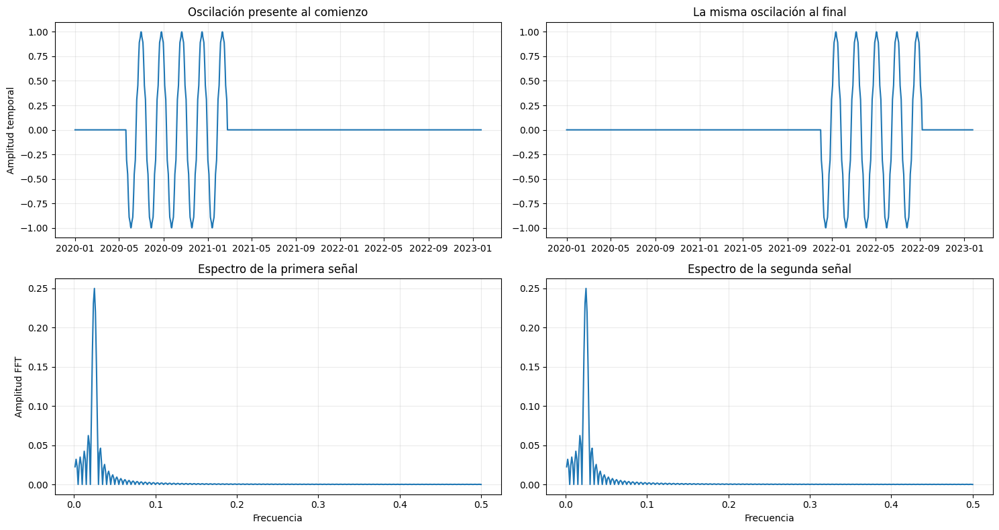

In [12]:
fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(15, 8)
)

# Señales temporales.
axes[0, 0].plot(
    serie_inicio.index,
    serie_inicio.values
)

axes[0, 0].set_title(
    "Oscilación presente al comienzo"
)

axes[0, 1].plot(
    serie_final.index,
    serie_final.values
)

axes[0, 1].set_title(
    "La misma oscilación al final"
)

# Quitamos frecuencia cero para graficar.
fft_inicio_plot = espectro_inicio[
    espectro_inicio["frecuencia"] > 0
]

fft_final_plot = espectro_final[
    espectro_final["frecuencia"] > 0
]

axes[1, 0].plot(
    fft_inicio_plot["frecuencia"],
    fft_inicio_plot["amplitud"]
)

axes[1, 0].set_title(
    "Espectro de la primera señal"
)

axes[1, 1].plot(
    fft_final_plot["frecuencia"],
    fft_final_plot["amplitud"]
)

axes[1, 1].set_title(
    "Espectro de la segunda señal"
)

for ax in axes.flat:
    ax.grid(alpha=0.25)

axes[0, 0].set_ylabel("Amplitud temporal")
axes[1, 0].set_ylabel("Amplitud FFT")

axes[1, 0].set_xlabel("Frecuencia")
axes[1, 1].set_xlabel("Frecuencia")

plt.tight_layout()
plt.show()

#### VER GRAFICO DE ARRIBA VS MALLAT

##### Esto ocurre porque desplazar una señal en el tiempo cambia la fase de sus coeficientes de Fourier, pero no su magnitud.

In [13]:
diferencia_maxima = np.max(
    np.abs(
        espectro_inicio["amplitud"].to_numpy()
        - espectro_final["amplitud"].to_numpy()
    )
)

print(
    "Máxima diferencia entre los espectros:",
    diferencia_maxima
)

Máxima diferencia entre los espectros: 2.7755575615628914e-17


# 2. Descomposición de Mallat sobre la muestra completa

Mallat separa cada spread en una aproximación lenta y detalles asociados a distintas escalas temporales:

\[
S_t = A_6(t) + D_6(t) + D_5(t) + \cdots + D_1(t)
\]

Esta etapa es descriptiva: utiliza toda la muestra y sirve para estudiar escalas, reconstrucción y energía. No debe interpretarse como una señal disponible en tiempo real.

In [14]:
WAVELET = "db4"
MODO_BORDE = "symmetric"
NIVEL_MALLAT = 6

### Tabla de escalas

In [15]:
def construir_tabla_escalas(
    nivel_maximo: int
) -> pd.DataFrame:
    """
    Construye una interpretación aproximada
    de las escalas temporales de cada detalle.
    """
    filas = []

    for nivel in range(1, nivel_maximo + 1):
        periodo_minimo = 2 ** nivel
        periodo_maximo = 2 ** (nivel + 1)

        filas.append(
            {
                "componente": f"D{nivel}",
                "periodo_minimo_ruedas": periodo_minimo,
                "periodo_maximo_ruedas": periodo_maximo,
                "interpretacion": (
                    f"Movimientos de aproximadamente "
                    f"{periodo_minimo} a "
                    f"{periodo_maximo} ruedas"
                )
            }
        )

    filas.append(
        {
            "componente": f"A{nivel_maximo}",
            "periodo_minimo_ruedas": 2 ** (nivel_maximo + 1),
            "periodo_maximo_ruedas": np.inf,
            "interpretacion": (
                "Movimientos más lentos que "
                f"{2 ** (nivel_maximo + 1)} ruedas"
            )
        }
    )

    return pd.DataFrame(filas)


tabla_escalas = construir_tabla_escalas(
    NIVEL_MALLAT
)

display(tabla_escalas)

,componente,periodo_minimo_ruedas,periodo_maximo_ruedas,interpretacion
0,D1,2,4.0,Movimientos de aproximadamente 2 a 4 ruedas
1,D2,4,8.0,Movimientos de aproximadamente 4 a 8 ruedas
2,D3,8,16.0,Movimientos de aproximadamente 8 a 16 ruedas
3,D4,16,32.0,Movimientos de aproximadamente 16 a 32 ruedas
4,D5,32,64.0,Movimientos de aproximadamente 32 a 64 ruedas
5,D6,64,128.0,Movimientos de aproximadamente 64 a 128 ruedas
6,A6,128,inf,Movimientos más lentos que 128 ruedas


### Verificar nivel maximo disponible

In [16]:
def obtener_niveles_maximos(
    spreads: pd.DataFrame,
    wavelet: str
) -> pd.Series:
    """
    Calcula el máximo nivel recomendado
    para cada señal.
    """
    wavelet_obj = pywt.Wavelet(wavelet)

    niveles = {}

    for columna in spreads.columns:
        serie = spreads[columna].dropna()

        niveles[columna] = pywt.dwt_max_level(
            data_len=len(serie),
            filter_len=wavelet_obj.dec_len
        )

    return pd.Series(
        niveles,
        name="nivel_maximo_recomendado"
    )


niveles_maximos = obtener_niveles_maximos(
    spreads=spreads_df,
    wavelet=WAVELET
)

display(niveles_maximos)

GGAL    9
BMA     9
BBAR    9
YPF     9
TGS     9
EDN     9
PAM     9
Name: nivel_maximo_recomendado, dtype: int64

In [17]:
if NIVEL_MALLAT > niveles_maximos.min():
    raise ValueError(
        f"El nivel {NIVEL_MALLAT} es demasiado alto. "
        f"El menor nivel máximo disponible es "
        f"{niveles_maximos.min()}."
    )

### Descomponemos los spreads

In [18]:
def descomponer_mallat(
    spreads: pd.DataFrame,
    wavelet: str = "db4",
    nivel: int = 6,
    modo: str = "symmetric"
) -> dict:
    """
    Aplica la descomposición wavelet discreta
    a cada columna del DataFrame.
    """
    wavelet_obj = pywt.Wavelet(wavelet)

    resultados = {}

    for columna in spreads.columns:
        serie = spreads[columna].astype(float).copy()

        if serie.isna().any():
            raise ValueError(
                f"La serie {columna} contiene valores faltantes. "
                "No deben eliminarse silenciosamente porque eso "
                "modificaría el espaciado temporal."
            )

        nivel_maximo = pywt.dwt_max_level(
            data_len=len(serie),
            filter_len=wavelet_obj.dec_len
        )

        if nivel > nivel_maximo:
            raise ValueError(
                f"El nivel {nivel} no es válido para {columna}. "
                f"Máximo recomendado: {nivel_maximo}."
            )

        # Creamos una copia escribible y contigua.
        datos = np.ascontiguousarray(
            serie.to_numpy(
                dtype=np.float64,
                copy=True
            )
        )

        coeficientes = pywt.wavedec(
            data=datos,
            wavelet=wavelet_obj,
            mode=modo,
            level=nivel
        )

        resultados[columna] = {
            "serie_original": serie,
            "coeficientes": coeficientes,
            "wavelet": wavelet,
            "modo": modo,
            "nivel": nivel,
            "nivel_maximo": nivel_maximo
        }

    return resultados

In [19]:
resultados_mallat = descomponer_mallat(
    spreads=spreads_df,
    wavelet=WAVELET,
    nivel=NIVEL_MALLAT,
    modo=MODO_BORDE
)

#### Inspeccionamos los resultados

In [20]:
coeficientes_ggal = (
    resultados_mallat[list(resultados_mallat.keys())[0]]["coeficientes"]
)

for indice, coeficiente in enumerate(
    coeficientes_ggal
):
    print(
        f"Posición {indice}: "
        f"{len(coeficiente)} coeficientes"
    )

Posición 0: 65 coeficientes
Posición 1: 65 coeficientes
Posición 2: 124 coeficientes
Posición 3: 242 coeficientes
Posición 4: 477 coeficientes
Posición 5: 948 coeficientes
Posición 6: 1889 coeficientes


## Reconstruimos los componentes
### La descomposición produce coeficientes, pero queremos volver a obtener señales con el mismo largo temporal que el spread original.

#### Reconstrucción de un componente

In [21]:
def reconstruir_componente(
    coeficientes: list[np.ndarray],
    wavelet: str,
    modo: str,
    largo_original: int,
    componente: str | int
) -> np.ndarray:
    """
    Reconstruye una aproximación o un detalle.

    componente:
        "A" para la aproximación final.
        Un entero j para reconstruir D_j.
    """
    nivel = len(coeficientes) - 1

    coeficientes_seleccionados = [
        np.zeros_like(coeficiente)
        for coeficiente in coeficientes
    ]

    if componente == "A":
        coeficientes_seleccionados[0] = (
            coeficientes[0].copy()
        )

    elif isinstance(componente, int):
        if componente < 1 or componente > nivel:
            raise ValueError(
                f"El detalle debe estar entre "
                f"D1 y D{nivel}."
            )

        # En wavedec:
        # posición 1 = D_nivel
        # posición nivel = D1
        indice_coeficiente = (
            nivel - componente + 1
        )

        coeficientes_seleccionados[
            indice_coeficiente
        ] = coeficientes[indice_coeficiente].copy()

    else:
        raise ValueError(
            "componente debe ser 'A' "
            "o un número entero."
        )

    reconstruccion = pywt.waverec(
        coeficientes_seleccionados,
        wavelet=wavelet,
        mode=modo
    )

    # waverec puede devolver una observación adicional.
    return reconstruccion[:largo_original]

### Reconstrucción de todas las componentes

In [22]:
def reconstruir_todas_las_componentes(
    resultado: dict
) -> pd.DataFrame:
    """
    Reconstruye A_L y todos los detalles D_j
    en el dominio temporal original.
    """
    serie = resultado["serie_original"]
    coeficientes = resultado["coeficientes"]
    wavelet = resultado["wavelet"]
    modo = resultado["modo"]
    nivel = resultado["nivel"]

    largo = len(serie)

    reconstrucciones = pd.DataFrame(
        index=serie.index
    )

    reconstrucciones["original"] = serie

    reconstrucciones[f"A{nivel}"] = (
        reconstruir_componente(
            coeficientes=coeficientes,
            wavelet=wavelet,
            modo=modo,
            largo_original=largo,
            componente="A"
        )
    )

    for detalle in range(nivel, 0, -1):
        reconstrucciones[f"D{detalle}"] = (
            reconstruir_componente(
                coeficientes=coeficientes,
                wavelet=wavelet,
                modo=modo,
                largo_original=largo,
                componente=detalle
            )
        )

    columnas_componentes = [
        f"A{nivel}",
        *[
            f"D{detalle}"
            for detalle in range(nivel, 0, -1)
        ]
    ]

    reconstrucciones["suma_componentes"] = (
        reconstrucciones[columnas_componentes]
        .sum(axis=1)
    )

    reconstrucciones["error_reconstruccion"] = (
        reconstrucciones["original"]
        - reconstrucciones["suma_componentes"]
    )

    return reconstrucciones

In [23]:
reconstrucciones_mallat = {
    ticker: reconstruir_todas_las_componentes(
        resultado
    )
    for ticker, resultado
    in resultados_mallat.items()
}

## Verificar reconstrucción perfecta
#### la suma de las componentes debe recuperar la señal original
##### los errores deben ser muy pequeños

In [24]:
errores_reconstruccion = {}

for ticker, reconstruccion in (
    reconstrucciones_mallat.items()
):
    error_maximo = (
        reconstruccion["error_reconstruccion"]
        .abs()
        .max()
    )

    error_medio = (
        reconstruccion["error_reconstruccion"]
        .abs()
        .mean()
    )

    errores_reconstruccion[ticker] = {
        "error_absoluto_maximo": error_maximo,
        "error_absoluto_medio": error_medio
    }

errores_reconstruccion = pd.DataFrame(
    errores_reconstruccion
).T

display(errores_reconstruccion)

,error_absoluto_maximo,error_absoluto_medio
GGAL,2.220446e-16,3.147376e-17
BMA,2.775558e-16,4.043600e-17
BBAR,2.220446e-16,3.138691e-17
YPF,5.551115e-16,4.234597e-17
TGS,2.775558e-16,3.467902e-17
EDN,5.551115e-16,4.844337e-17
PAM,3.885781e-16,3.888395e-17


## Visualizar aproximacion y detalle

In [25]:
def graficar_componentes_mallat(
    reconstruccion: pd.DataFrame,
    ticker: str,
    nivel: int
) -> None:
    """
    Grafica la señal original, la aproximación
    y todos los detalles reconstruidos.
    """
    cantidad_graficos = nivel + 1

    fig, axes = plt.subplots(
        nrows=cantidad_graficos,
        ncols=1,
        figsize=(15, 2.3 * cantidad_graficos),
        sharex=True
    )

    # Original y aproximación.
    axes[0].plot(
        reconstruccion.index,
        reconstruccion["original"],
        linewidth=0.8,
        label="Spread original"
    )

    axes[0].plot(
        reconstruccion.index,
        reconstruccion[f"A{nivel}"],
        linewidth=1.5,
        label=f"A{nivel}"
    )

    axes[0].set_title(
        f"{ticker} — señal y aproximación A{nivel}"
    )

    axes[0].legend()
    axes[0].grid(alpha=0.25)

    # Detalles desde el más grueso al más fino.
    for posicion, detalle in enumerate(
        range(nivel, 0, -1),
        start=1
    ):
        columna = f"D{detalle}"

        periodo_minimo = 2 ** detalle
        periodo_maximo = 2 ** (detalle + 1)

        axes[posicion].plot(
            reconstruccion.index,
            reconstruccion[columna],
            linewidth=0.8
        )

        axes[posicion].axhline(
            y=0,
            linestyle="--",
            linewidth=0.6
        )

        axes[posicion].set_title(
            f"{columna}: aproximadamente "
            f"{periodo_minimo}–"
            f"{periodo_maximo} ruedas"
        )

        axes[posicion].grid(alpha=0.25)

    axes[-1].set_xlabel("Fecha")

    plt.tight_layout()
    plt.show()

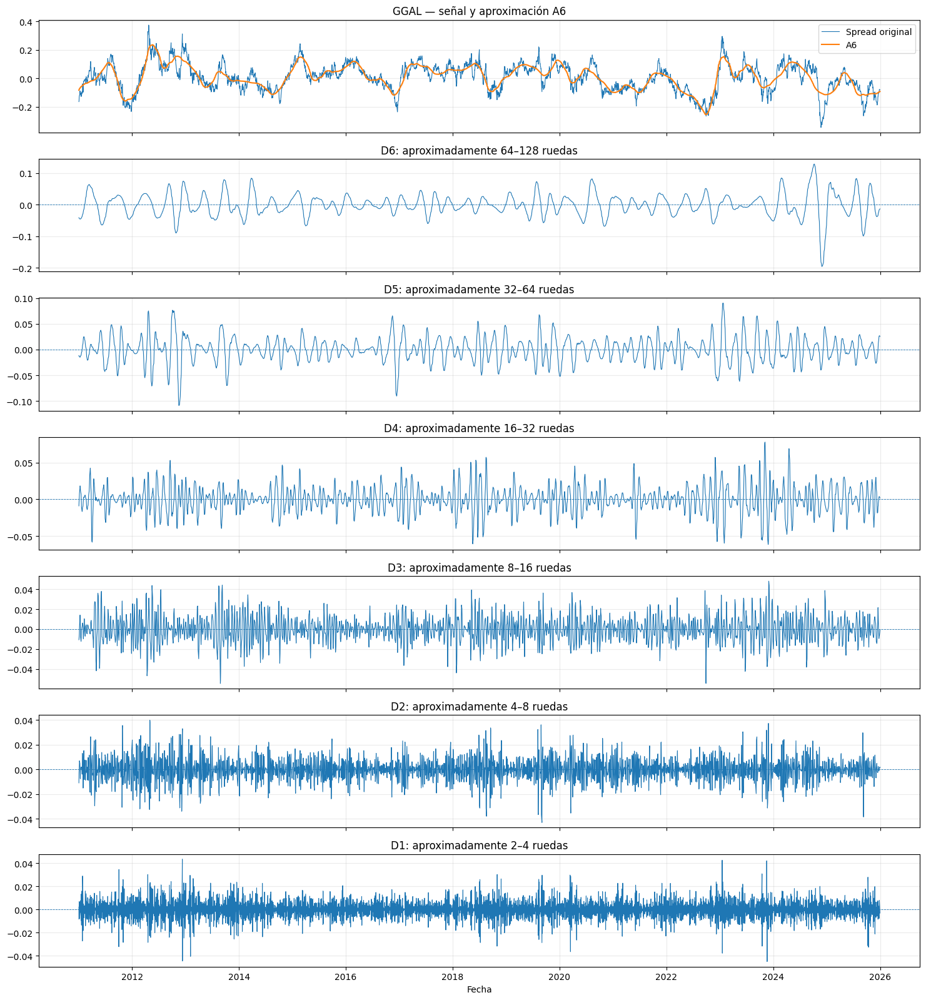

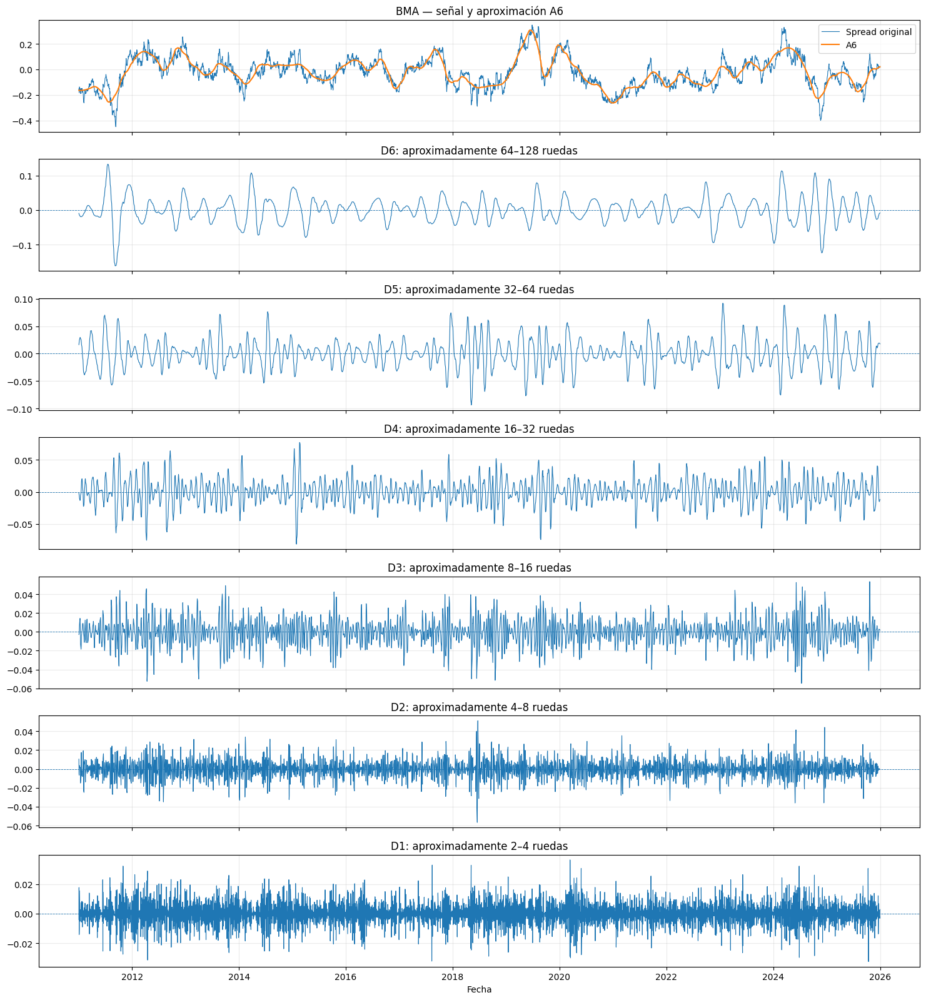

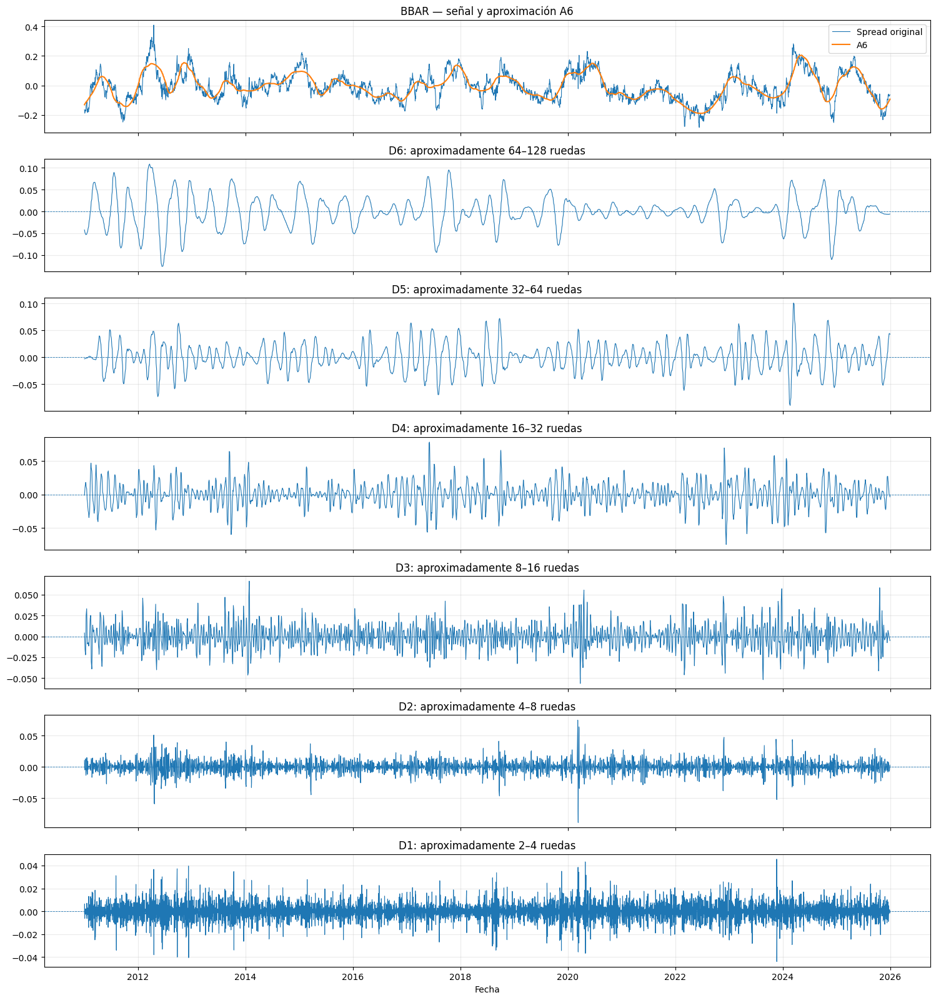

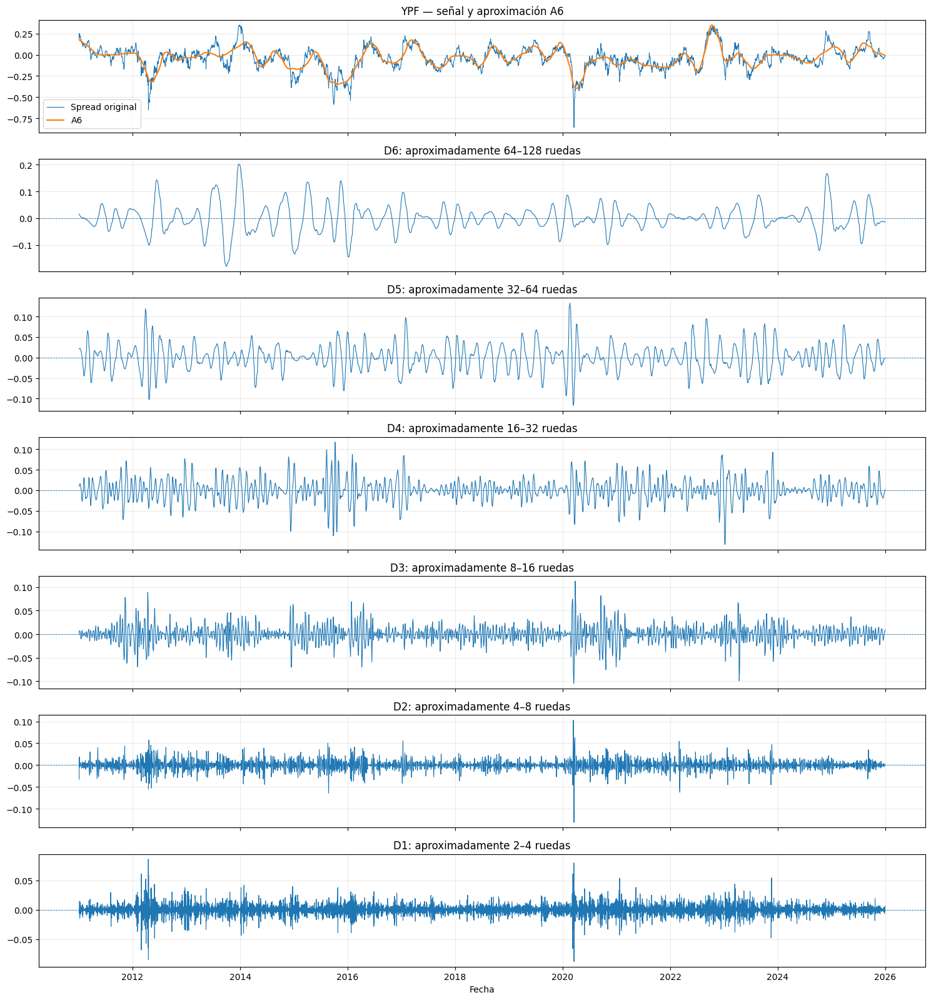

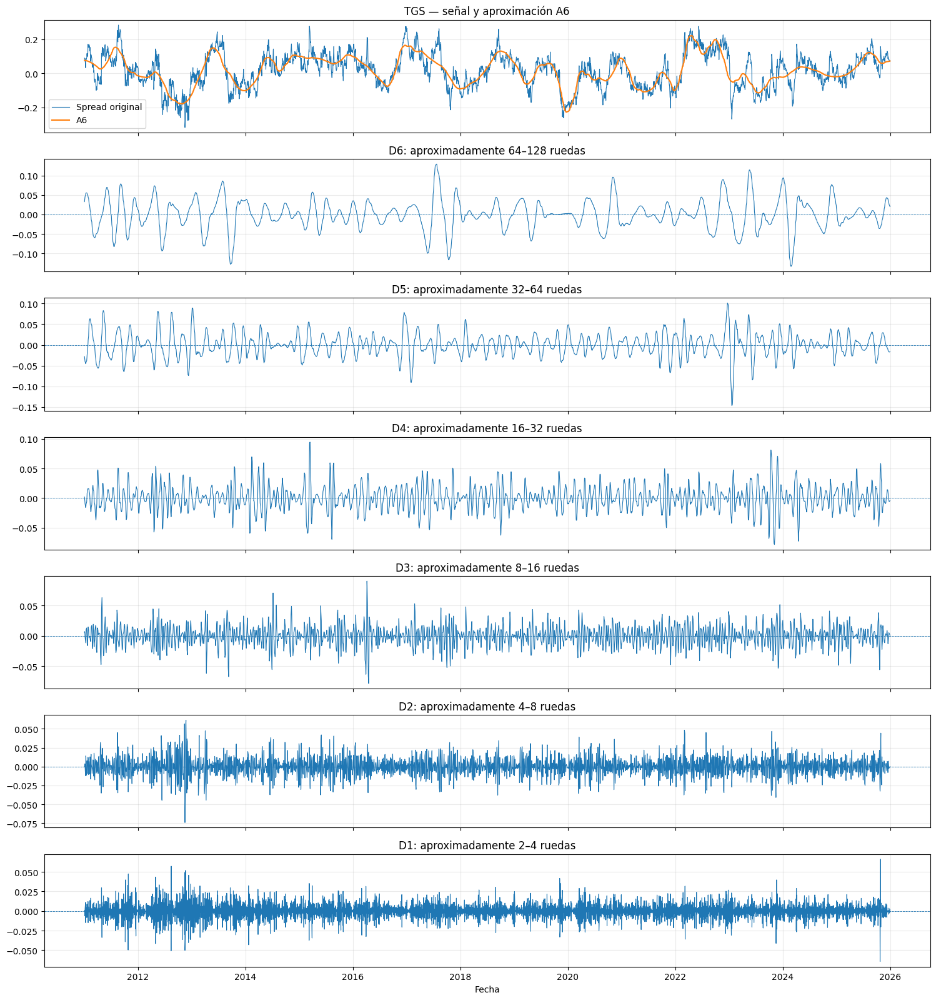

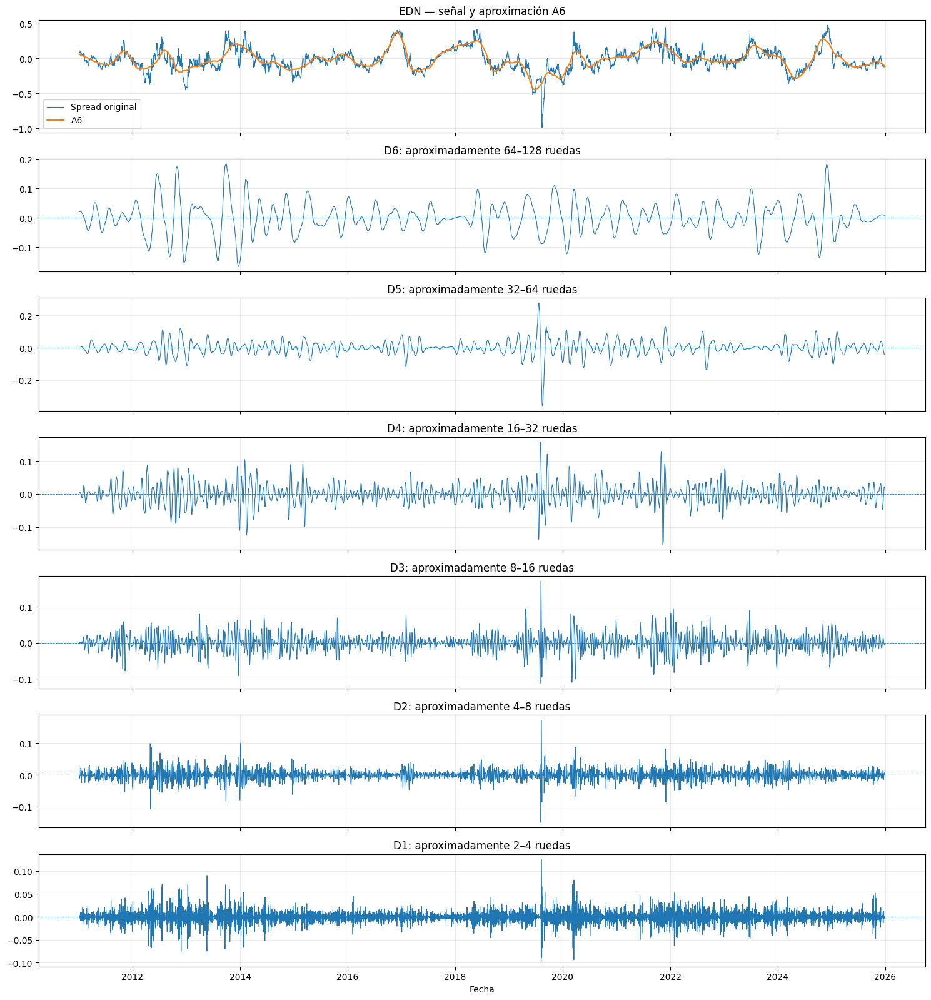

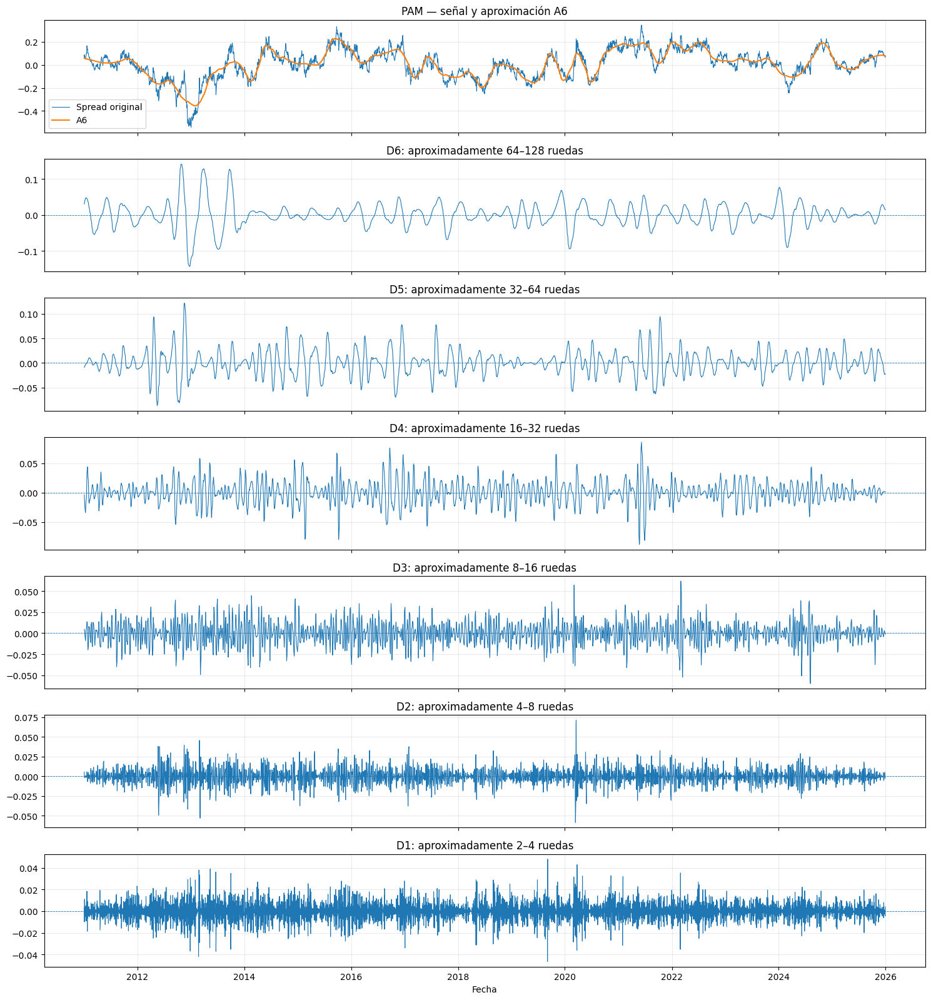

In [26]:
for ticker, reconstruccion in (
    reconstrucciones_mallat.items()
):
    graficar_componentes_mallat(
        reconstruccion=reconstruccion,
        ticker=ticker,
        nivel=NIVEL_MALLAT
    )

## Medir la "energía" de cada escala
#### Una energía alta indica que esa escala tiene una presencia importante en la señal

In [27]:
def calcular_energia_mallat(
    resultado: dict
) -> pd.DataFrame:
    """
    Calcula la energía total y promedio
    de los coeficientes de cada escala.
    """
    coeficientes = resultado["coeficientes"]
    nivel = resultado["nivel"]

    nombres = [
        f"A{nivel}",
        *[
            f"D{detalle}"
            for detalle in range(nivel, 0, -1)
        ]
    ]

    filas = []

    for nombre, coeficiente in zip(
        nombres,
        coeficientes
    ):
        energia_total = np.sum(
            np.abs(coeficiente) ** 2
        )

        filas.append(
            {
                "componente": nombre,
                "cantidad_coeficientes": len(coeficiente),
                "energia_total": energia_total,
                "energia_media_coeficiente": (
                    energia_total / len(coeficiente)
                )
            }
        )

    energia = pd.DataFrame(filas)

    total = energia["energia_total"].sum()

    energia["proporcion_energia"] = (
        energia["energia_total"] / total
    )

    return energia

In [28]:
energias_mallat = {
    ticker: calcular_energia_mallat(resultado)
    for ticker, resultado
    in resultados_mallat.items()
}

In [29]:
for ticker, energia in energias_mallat.items():
    print(f"\nEnergía por nivel — {ticker}")

    display(
        energia.style.format(
            {
                "energia_total": "{:.6f}",
                "energia_media_coeficiente": "{:.6f}",
                "proporcion_energia": "{:.2%}"
            }
        )
    )


Energía por nivel — GGAL


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,33.047432,0.508422,77.00%
1,D6,65,5.215436,0.080237,12.15%
2,D5,124,2.305035,0.018589,5.37%
3,D4,242,1.201821,0.004966,2.80%
4,D3,477,0.571148,0.001197,1.33%
5,D2,948,0.319875,0.000337,0.75%
6,D1,1889,0.255642,0.000135,0.60%



Energía por nivel — BMA


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,52.693245,0.810665,83.00%
1,D6,65,5.441369,0.083713,8.57%
2,D5,124,2.723332,0.021962,4.29%
3,D4,242,1.384825,0.005722,2.18%
4,D3,477,0.640232,0.001342,1.01%
5,D2,948,0.348845,0.000368,0.55%
6,D1,1889,0.257651,0.000136,0.41%



Energía por nivel — BBAR


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,35.369892,0.544152,78.42%
1,D6,65,4.949513,0.076146,10.97%
2,D5,124,2.374762,0.019151,5.27%
3,D4,242,1.116344,0.004613,2.48%
4,D3,477,0.609071,0.001277,1.35%
5,D2,948,0.399782,0.000422,0.89%
6,D1,1889,0.285228,0.000151,0.63%



Energía por nivel — YPF


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,70.991016,1.092169,79.29%
1,D6,65,9.870053,0.151847,11.02%
2,D5,124,3.816105,0.030775,4.26%
3,D4,242,2.584536,0.010680,2.89%
4,D3,477,1.178360,0.002470,1.32%
5,D2,948,0.632153,0.000667,0.71%
6,D1,1889,0.464169,0.000246,0.52%



Energía por nivel — TGS


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,29.507025,0.453954,70.85%
1,D6,65,5.725130,0.088079,13.75%
2,D5,124,2.951670,0.023804,7.09%
3,D4,242,1.562529,0.006457,3.75%
4,D3,477,0.925040,0.001939,2.22%
5,D2,948,0.559280,0.000590,1.34%
6,D1,1889,0.419130,0.000222,1.01%



Energía por nivel — EDN


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,74.611229,1.147865,74.56%
1,D6,65,10.778994,0.165831,10.77%
2,D5,124,7.500234,0.060486,7.50%
3,D4,242,3.136530,0.012961,3.13%
4,D3,477,1.910903,0.004006,1.91%
5,D2,948,1.220041,0.001287,1.22%
6,D1,1889,0.908435,0.000481,0.91%



Energía por nivel — PAM


,componente,cantidad_coeficientes,energia_total,energia_media_coeficiente,proporcion_energia
0,A6,65,51.480242,0.792004,84.52%
1,D6,65,4.324709,0.066534,7.10%
2,D5,124,2.488842,0.020071,4.09%
3,D4,242,1.336108,0.005521,2.19%
4,D3,477,0.570683,0.001196,0.94%
5,D2,948,0.396977,0.000419,0.65%
6,D1,1889,0.308932,0.000164,0.51%


### Energía total versus energía media

##### No significan lo mismo.

### Energía total

##### Mide cuánto aporta globalmente el nivel.

##### Un nivel fino tiene más coeficientes y puede acumular bastante energía.

### Energía media por coeficiente

##### Mide qué tan intensos son, en promedio, los coeficientes de ese nivel.

##### Un nivel grueso puede tener pocos coeficientes, pero muy grandes.

##### Conviene mostrar ambas medidas.

### Gráfico de proporción de energía

In [30]:
def graficar_energia(
    energia: pd.DataFrame,
    ticker: str
) -> None:
    datos = energia.copy()

    plt.figure(figsize=(10, 5))

    plt.bar(
        datos["componente"],
        datos["proporcion_energia"]
    )

    plt.title(
        f"Distribución de energía por escala — {ticker}"
    )

    plt.xlabel("Componente")
    plt.ylabel("Proporción de energía")
    plt.grid(axis="y", alpha=0.25)

    plt.tight_layout()
    plt.show()

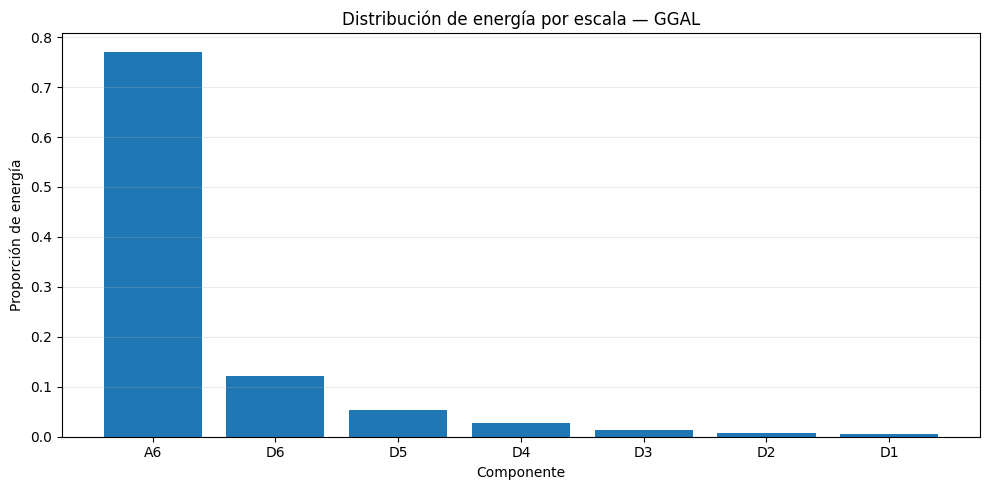

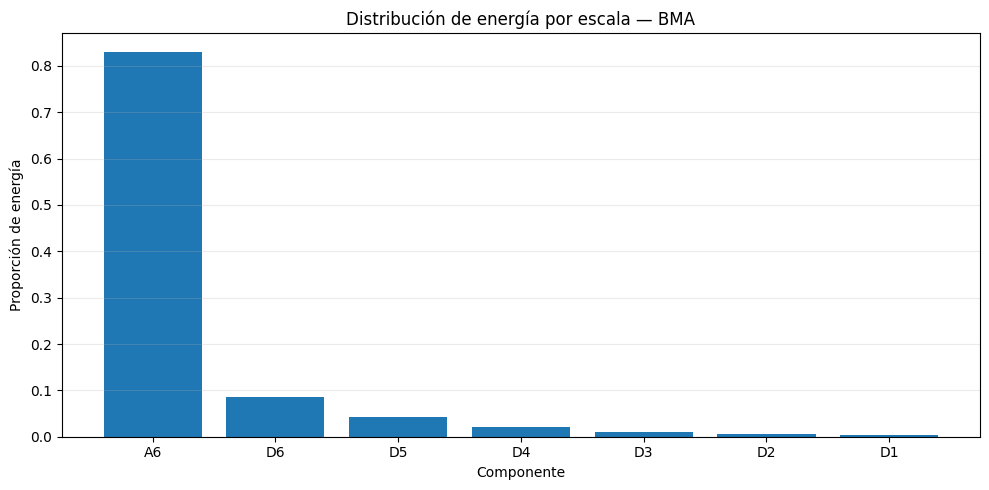

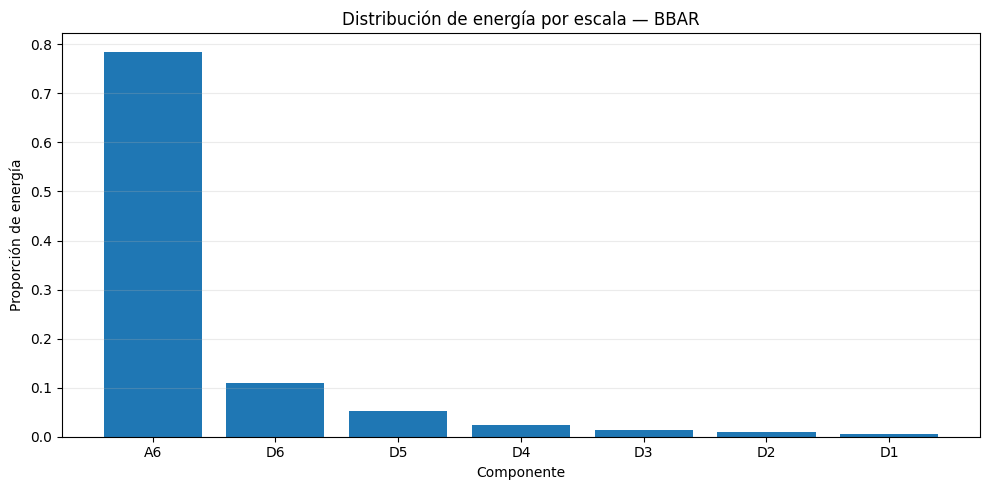

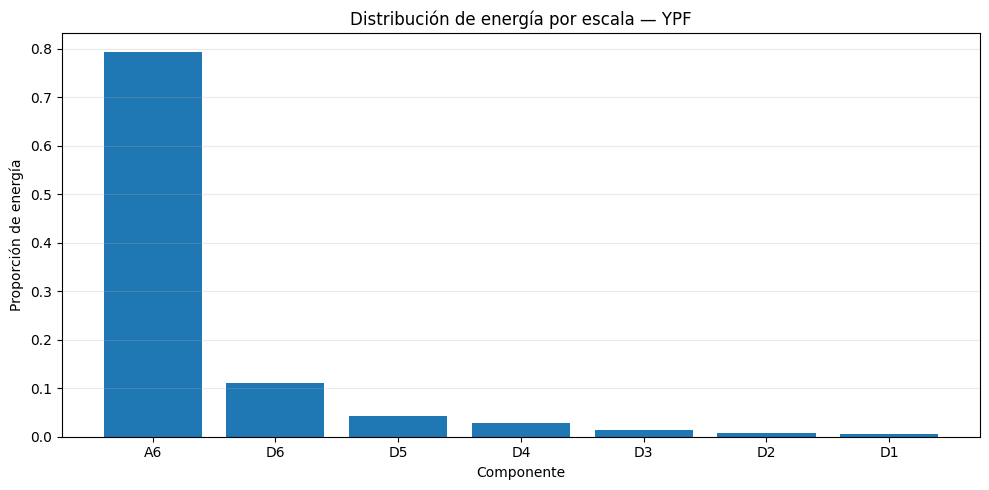

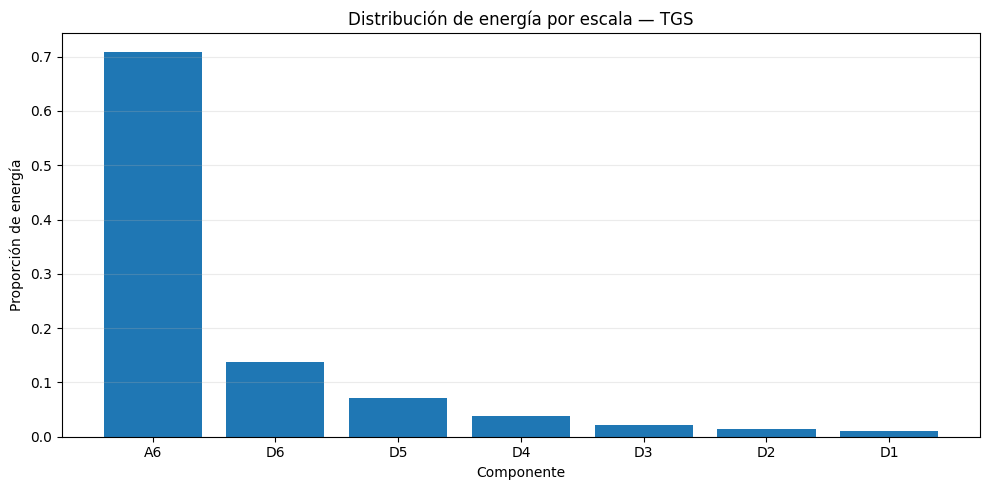

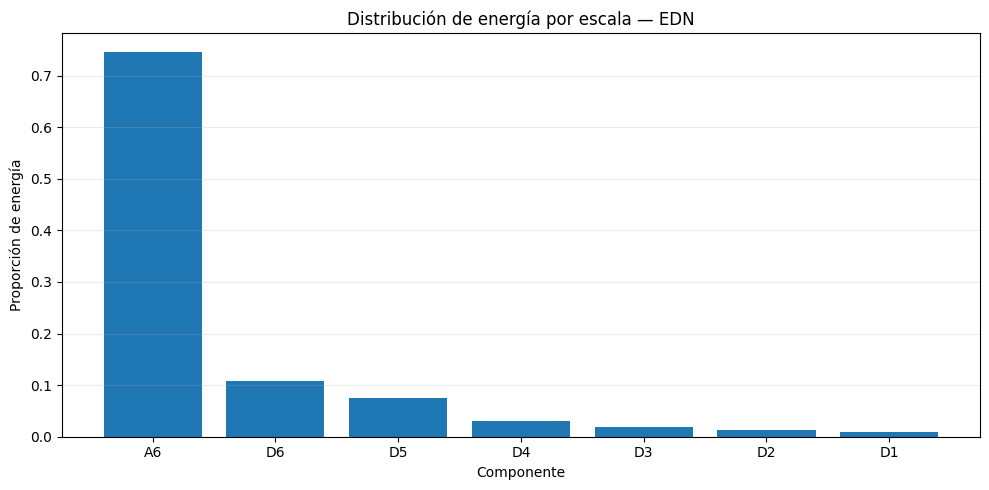

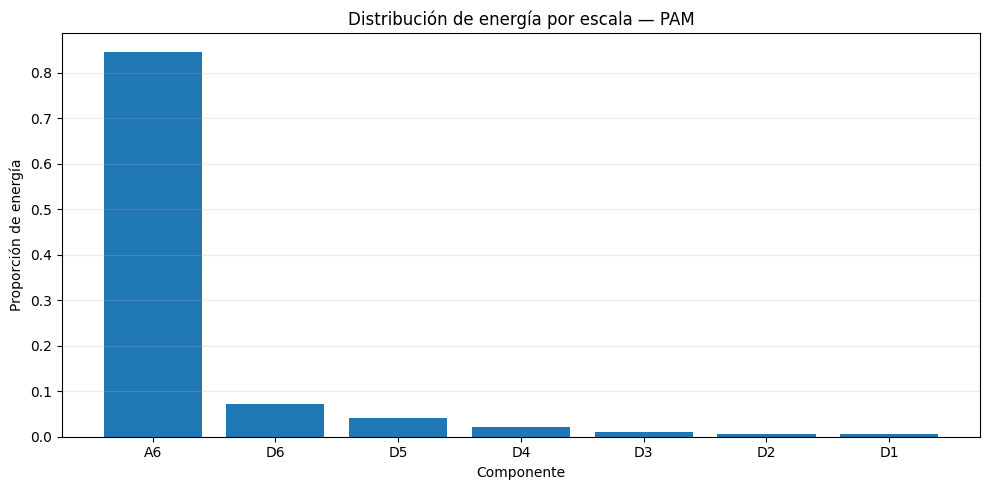

In [31]:
for ticker, energia in energias_mallat.items():
    graficar_energia(
        energia=energia,
        ticker=ticker
    )

#### Precaución
##### Como utilizamos extensión simétrica en los bordes, la energía de los coeficientes debe interpretarse como una medida descriptiva relativa.
##### No deberíamos afirmar que es una descomposición exacta de la varianza económica de la serie.

### Métricas de validacion

### Comparación visual

# 3. Mallat rolling y referencia ex ante

La descomposición sobre la muestra completa usa observaciones anteriores y posteriores a cada fecha. Para evitar *look-ahead*, recalculamos Mallat dentro de una ventana móvil que termina en cada fecha.

Se conservan dos objetos distintos:

- `aproximaciones_rolling_raw`: último punto de la reconstrucción calculada con datos hasta la fecha `t`.
- `aproximaciones_rolling`: la misma serie desplazada una rueda, utilizada como referencia ex ante en `t`.

El residuo final queda definido como:

\[
e_t = S_t - \widehat S_{t-1}
\]

Así, el dato observado en `t` no participa en la referencia contra la cual es evaluado.

## Elección de la ventana

Usamos una ventana fija porque mantiene una escala temporal constante, se adapta a cambios recientes y evita que relaciónes muy antiguas dominen la estimación actual.

La ventana inicial es de 512 ruedas. Con `db4`, esta longitud permite llegar al nivel 6. Las primeras 511 observaciones funcionan como período de inicialización; la referencia ex ante requiere además una rueda adicional por el desplazamiento.

In [32]:
wavelet_obj = pywt.Wavelet(WAVELET)

for ventana in [128, 256, 512, 1024]:
    nivel_maximo = pywt.dwt_max_level(
        data_len=ventana,
        filter_len=wavelet_obj.dec_len
    )

    print(
        f"Ventana {ventana}: "
        f"nivel máximo recomendado = {nivel_maximo}"
    )

Ventana 128: nivel máximo recomendado = 4
Ventana 256: nivel máximo recomendado = 5
Ventana 512: nivel máximo recomendado = 6
Ventana 1024: nivel máximo recomendado = 7


## Configuración inicial

La configuración principal es `db4`, nivel 6, ventana 512 y borde `symmetric`. Se conserva como punto de partida y luego se compara, de manera opcional, con otros tratamientos de borde, otra wavelet y una EMA causal.

In [33]:
VENTANA_ROLLING = 512
NIVEL_ROLLING = 6
WAVELET_ROLLING = "db4"
MODO_BORDE_ROLLING = "symmetric"

#### Valido que la config sea posible

In [34]:
wavelet_obj = pywt.Wavelet(WAVELET_ROLLING)

nivel_maximo_ventana = pywt.dwt_max_level(
    data_len=VENTANA_ROLLING,
    filter_len=wavelet_obj.dec_len
)

if NIVEL_ROLLING > nivel_maximo_ventana:
    raise ValueError(
        f"Con una ventana de {VENTANA_ROLLING} "
        f"y wavelet {WAVELET_ROLLING}, "
        f"el máximo nivel recomendado es "
        f"{nivel_maximo_ventana}."
    )

print(
    f"Configuración válida: ventana={VENTANA_ROLLING}, "
    f"nivel={NIVEL_ROLLING}"
)

Configuración válida: ventana=512, nivel=6


## Reconstrucción del último punto de cada ventana

En cada ventana:

1. aplicamos `wavedec`;
2. conservamos la aproximación final;
3. ponemos los detalles no seleccionados en cero;
4. reconstruimos con `waverec`;
5. guardamos únicamente el último valor.

Este último valor es sensible al tratamiento del borde. Por eso mantenemos la versión raw para diagnóstico y usamos una versión desplazada como referencia ex ante.

In [35]:
def reconstruir_ultimo_punto_mallat(
    segmento: pd.Series,
    wavelet: str = "db4",
    nivel: int = 6,
    modo: str = "symmetric",
    conservar_aproximacion: bool = True,
    detalles_conservados: tuple[int, ...] = ()
) -> float:
    """
    Aplica Mallat sobre un segmento temporal y devuelve
    únicamente el último valor reconstruido.

    Parámetros
    ----------
    segmento:
        Ventana de datos disponible hasta una fecha t.

    conservar_aproximacion:
        Si es True, conserva A_n.

    detalles_conservados:
        Niveles D_j que también se desean conservar.
        Por ejemplo, (5, 6).

    Ejemplos
    --------
    Solo tendencia lenta:
        conservar_aproximacion=True
        detalles_conservados=()

    Tendencia más movimientos intermedios:
        conservar_aproximacion=True
        detalles_conservados=(5, 6)
    """
    if segmento.isna().any():
        raise ValueError(
            "El segmento contiene valores faltantes."
        )

    # Copia escribible y contigua para evitar:
    # "buffer source array is read-only".
    datos = np.ascontiguousarray(
        segmento.to_numpy(
            dtype=np.float64,
            copy=True
        )
    )

    wavelet_obj = pywt.Wavelet(wavelet)

    nivel_maximo = pywt.dwt_max_level(
        data_len=len(datos),
        filter_len=wavelet_obj.dec_len
    )

    if nivel > nivel_maximo:
        raise ValueError(
            f"El segmento de largo {len(datos)} "
            f"permite como máximo nivel {nivel_maximo}, "
            f"pero se solicitó nivel {nivel}."
        )

    coeficientes = pywt.wavedec(
        data=datos,
        wavelet=wavelet_obj,
        mode=modo,
        level=nivel
    )

    coeficientes_filtrados = [
        np.zeros_like(coeficiente)
        for coeficiente in coeficientes
    ]

    # wavedec devuelve:
    # [cA_n, cD_n, cD_{n-1}, ..., cD_1]
    if conservar_aproximacion:
        coeficientes_filtrados[0] = (
            coeficientes[0].copy()
        )

    for detalle in detalles_conservados:
        if detalle < 1 or detalle > nivel:
            raise ValueError(
                f"D{detalle} no existe. "
                f"Los niveles válidos son D1 a D{nivel}."
            )

        indice = nivel - detalle + 1

        coeficientes_filtrados[indice] = (
            coeficientes[indice].copy()
        )

    reconstruccion = pywt.waverec(
        coeficientes_filtrados,
        wavelet=wavelet_obj,
        mode=modo
    )

    # waverec puede devolver un punto adicional.
    reconstruccion = reconstruccion[:len(datos)]

    return float(reconstruccion[-1])

## Función rolling para una serie

In [36]:
def mallat_rolling_serie(
    serie: pd.Series,
    ventana: int = 512,
    wavelet: str = "db4",
    nivel: int = 6,
    modo: str = "symmetric",
    conservar_aproximacion: bool = True,
    detalles_conservados: tuple[int, ...] = ()
) -> pd.Series:
    """
    Calcula una reconstrucción rolling de Mallat.

    Para cada fecha usa solamente las últimas `ventana`
    observaciones disponibles hasta ese momento.

    Devuelve una serie con NaN antes de contar
    con suficientes observaciones.
    """
    if not isinstance(serie.index, pd.DatetimeIndex):
        raise TypeError(
            "La serie debe tener un DatetimeIndex."
        )

    if not serie.index.is_monotonic_increasing:
        raise ValueError(
            "Las fechas deben estar ordenadas."
        )

    if serie.index.has_duplicates:
        raise ValueError(
            "La serie contiene fechas duplicadas."
        )

    if serie.isna().any():
        raise ValueError(
            "La serie contiene valores faltantes."
        )

    wavelet_obj = pywt.Wavelet(wavelet)

    nivel_maximo = pywt.dwt_max_level(
        data_len=ventana,
        filter_len=wavelet_obj.dec_len
    )

    if nivel > nivel_maximo:
        raise ValueError(
            f"La ventana {ventana} permite como máximo "
            f"nivel {nivel_maximo}, no nivel {nivel}."
        )

    resultado = pd.Series(
        np.nan,
        index=serie.index,
        name=f"{serie.name}_mallat_rolling",
        dtype=float
    )

    # El primer resultado válido aparece cuando
    # tenemos una ventana completa.
    for posicion_final in range(
        ventana - 1,
        len(serie)
    ):
        posicion_inicial = (
            posicion_final - ventana + 1
        )

        segmento = serie.iloc[
            posicion_inicial:posicion_final + 1
        ]

        resultado.iloc[posicion_final] = (
            reconstruir_ultimo_punto_mallat(
                segmento=segmento,
                wavelet=wavelet,
                nivel=nivel,
                modo=modo,
                conservar_aproximacion=(
                    conservar_aproximacion
                ),
                detalles_conservados=(
                    detalles_conservados
                )
            )
        )

    return resultado

## Aplicación a todos los spreads

Primero calculamos la reconstrucción contemporánea (`raw`). Luego la desplazamos una rueda para obtener la referencia ex ante utilizada en el residuo.

In [37]:
def mallat_rolling_dataframe(
    spreads: pd.DataFrame,
    ventana: int = 512,
    wavelet: str = "db4",
    nivel: int = 6,
    modo: str = "symmetric",
    conservar_aproximacion: bool = True,
    detalles_conservados: tuple[int, ...] = ()
) -> pd.DataFrame:
    """
    Aplica Mallat rolling a cada columna de un DataFrame.
    """
    resultado = pd.DataFrame(
        index=spreads.index
    )

    for columna in spreads.columns:
        print(f"Procesando {columna}...")

        resultado[columna] = mallat_rolling_serie(
            serie=spreads[columna],
            ventana=ventana,
            wavelet=wavelet,
            nivel=nivel,
            modo=modo,
            conservar_aproximacion=(
                conservar_aproximacion
            ),
            detalles_conservados=(
                detalles_conservados
            )
        )

    return resultado

In [38]:
# Aproximación contemporánea: usa información hasta la fecha t,
# incluyendo el spread observado en t.
aproximaciones_rolling_raw = mallat_rolling_dataframe(
    spreads=spreads_df,
    ventana=VENTANA_ROLLING,
    wavelet=WAVELET_ROLLING,
    nivel=NIVEL_ROLLING,
    modo=MODO_BORDE_ROLLING,
    conservar_aproximacion=True,
    detalles_conservados=()
)

# Referencia ex ante utilizada para evaluar el spread en t.
# En t empleamos la aproximación que estaba disponible en t-1.
aproximaciones_rolling = aproximaciones_rolling_raw.shift(1)

# Residuo ex ante: el spread actual se compara con la
# aproximación disponible en la rueda anterior.
residuos_rolling = spreads_df - aproximaciones_rolling
residuos_rolling.columns = spreads_df.columns

print(
    "Primer valor válido del residuo:",
    residuos_rolling.apply(
        lambda serie: serie.first_valid_index()
    ).to_dict()
)

print(
    "Primer valor raw:",
    aproximaciones_rolling_raw.apply(
        lambda serie: serie.first_valid_index()
    ).to_dict()
)

print(
    "Primer valor ex ante:",
    aproximaciones_rolling.apply(
        lambda serie: serie.first_valid_index()
    ).to_dict()
)

Procesando GGAL...
Procesando BMA...
Procesando BBAR...
Procesando YPF...
Procesando TGS...
Procesando EDN...
Procesando PAM...
Primer valor válido del residuo: {'GGAL': Timestamp('2013-01-16 00:00:00'), 'BMA': Timestamp('2013-01-16 00:00:00'), 'BBAR': Timestamp('2013-01-16 00:00:00'), 'YPF': Timestamp('2013-01-16 00:00:00'), 'TGS': Timestamp('2013-01-16 00:00:00'), 'EDN': Timestamp('2013-01-16 00:00:00'), 'PAM': Timestamp('2013-01-16 00:00:00')}
Primer valor raw: {'GGAL': Timestamp('2013-01-15 00:00:00'), 'BMA': Timestamp('2013-01-15 00:00:00'), 'BBAR': Timestamp('2013-01-15 00:00:00'), 'YPF': Timestamp('2013-01-15 00:00:00'), 'TGS': Timestamp('2013-01-15 00:00:00'), 'EDN': Timestamp('2013-01-15 00:00:00'), 'PAM': Timestamp('2013-01-15 00:00:00')}
Primer valor ex ante: {'GGAL': Timestamp('2013-01-16 00:00:00'), 'BMA': Timestamp('2013-01-16 00:00:00'), 'BBAR': Timestamp('2013-01-16 00:00:00'), 'YPF': Timestamp('2013-01-16 00:00:00'), 'TGS': Timestamp('2013-01-16 00:00:00'), 'EDN': Time

## Construcción del residuo ex ante

La desviación utilizada por Persona 4 se calcula contra la referencia conocida antes de observar el spread actual:

\[
e_t = S_t - \widehat S_{t-1}
\]

Esto evita que un shock en `t` reduzca inmediatamente su propia magnitud al participar en la referencia del mismo día.

In [39]:
display(aproximaciones_rolling.head())
display(residuos_rolling.head())

,GGAL,BMA,BBAR,YPF,TGS,EDN,PAM
Date,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,GGAL,BMA,BBAR,YPF,TGS,EDN,PAM
Date,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- `aproximaciones_rolling_raw`: reconstrucción contemporánea, reservada para diagnósticos metodológicos.
- `aproximaciones_rolling`: referencia ex ante desplazada una rueda.
- `residuos_rolling`: desviación del spread actual respecto de la referencia disponible en la rueda anterior.

In [40]:
aproximaciones_rolling
residuos_rolling

,GGAL,BMA,BBAR,YPF,TGS,EDN,PAM
Date,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2025-12-23,0.004636,0.001255,0.013273,0.003368,0.000842,-0.016985,-0.002595
2025-12-24,0.001787,0.008863,0.009055,-0.001693,-0.003185,-0.011360,0.001589
2025-12-26,0.021906,0.006921,0.014835,-0.010753,-0.008351,-0.012988,-0.004177


## Graficamos el resultado

In [41]:
def graficar_mallat_rolling(
    spread: pd.Series,
    aproximacion: pd.Series,
    residuo: pd.Series,
    ticker: str,
    nivel: int
) -> None:
    """
    Muestra el spread completo y, desde que están disponibles,
    la referencia ex ante y el residuo.
    """
    fig, axes = plt.subplots(
        nrows=2,
        ncols=1,
        figsize=(15, 8),
        sharex=True
    )

    axes[0].plot(
        spread.index,
        spread,
        linewidth=0.8,
        label="Spread observado"
    )

    axes[0].plot(
        aproximacion.index,
        aproximacion,
        linewidth=1.5,
        label=f"A{nivel} rolling ex ante (t-1)"
    )

    axes[0].set_title(
        f"{ticker} — spread y referencia Mallat ex ante"
    )
    axes[0].set_ylabel("Spread")
    axes[0].legend()
    axes[0].grid(alpha=0.25)

    axes[1].plot(
        residuo.index,
        residuo,
        linewidth=0.8
    )
    axes[1].axhline(
        y=0,
        linestyle="--",
        linewidth=0.7
    )
    axes[1].set_title(
        "Residuo ex ante: spread(t) − aproximación(t−1)"
    )
    axes[1].set_ylabel("Desviación")
    axes[1].set_xlabel("Fecha")
    axes[1].grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

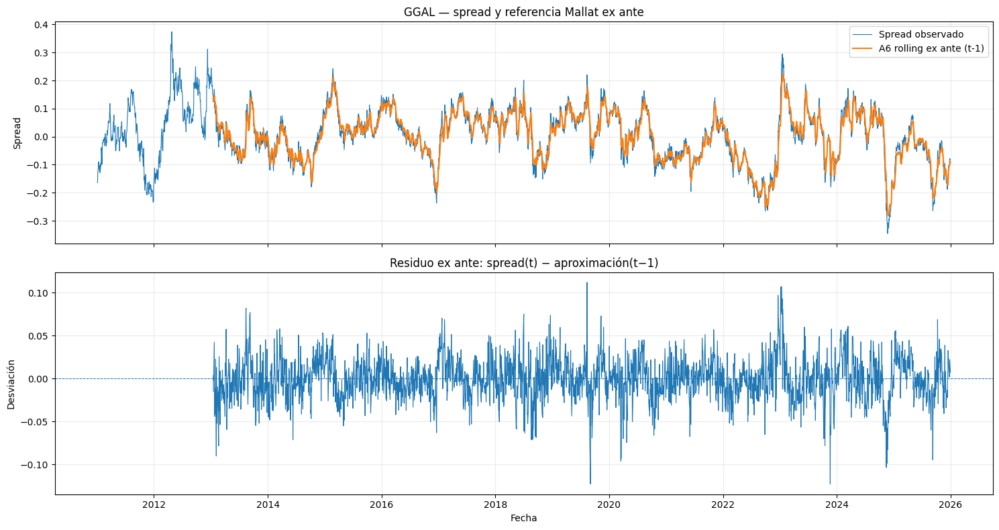

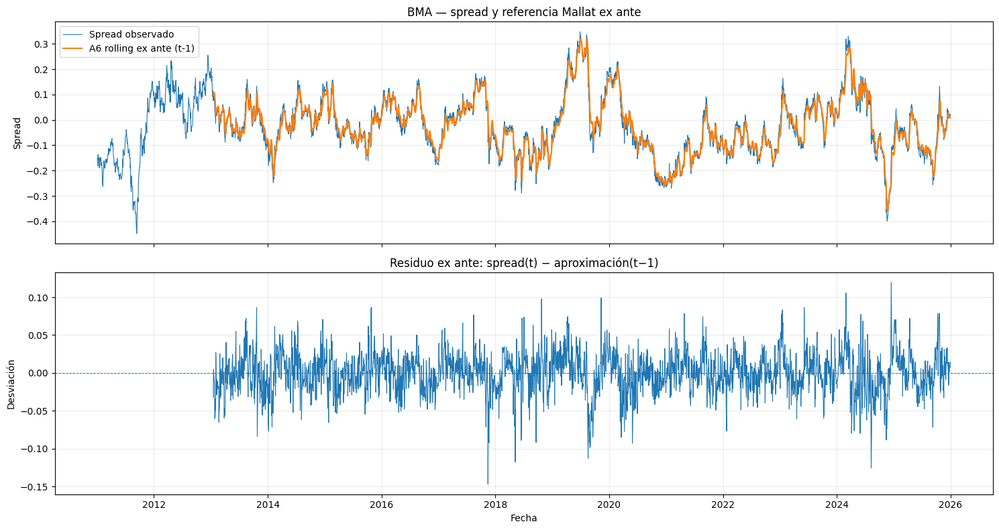

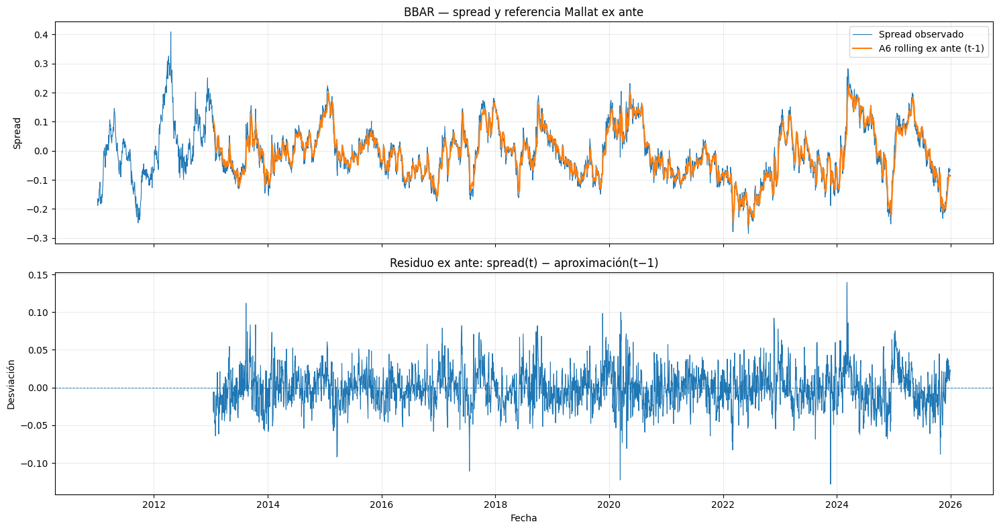

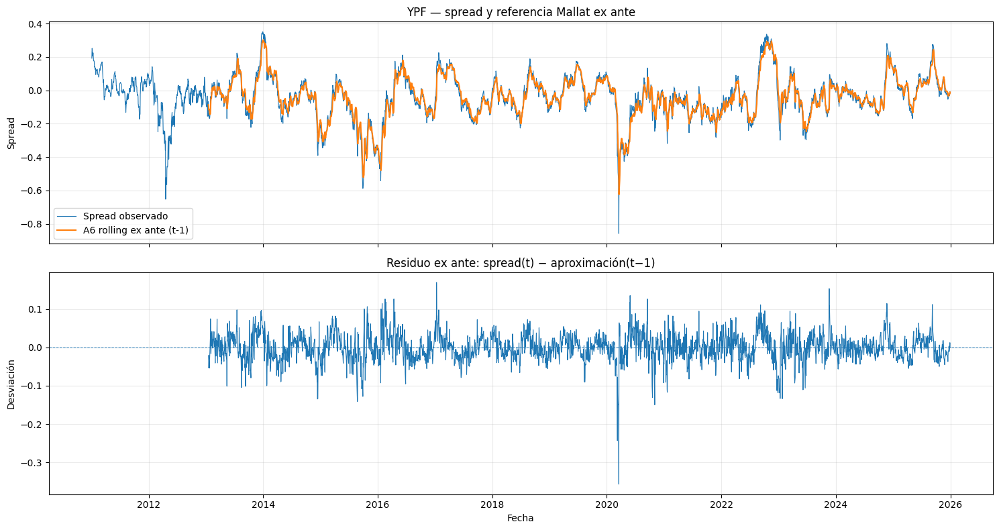

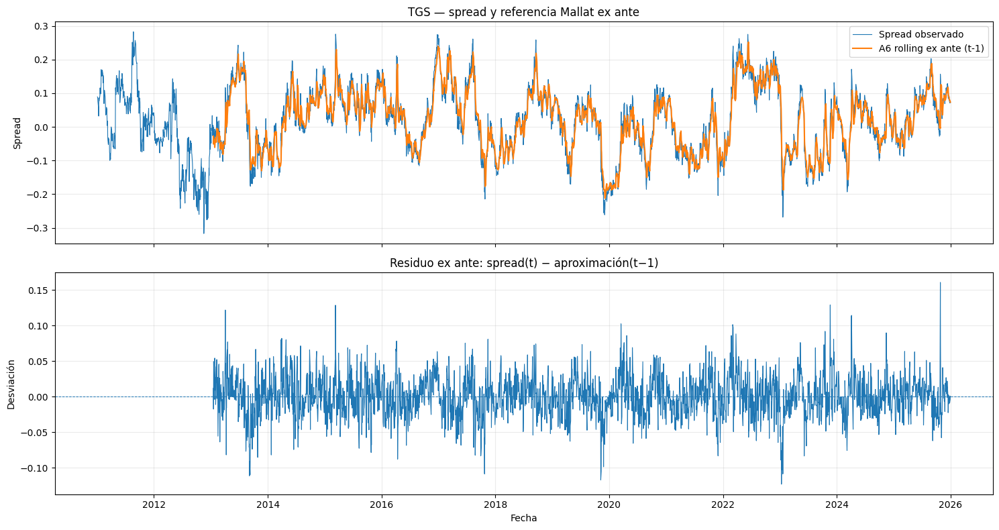

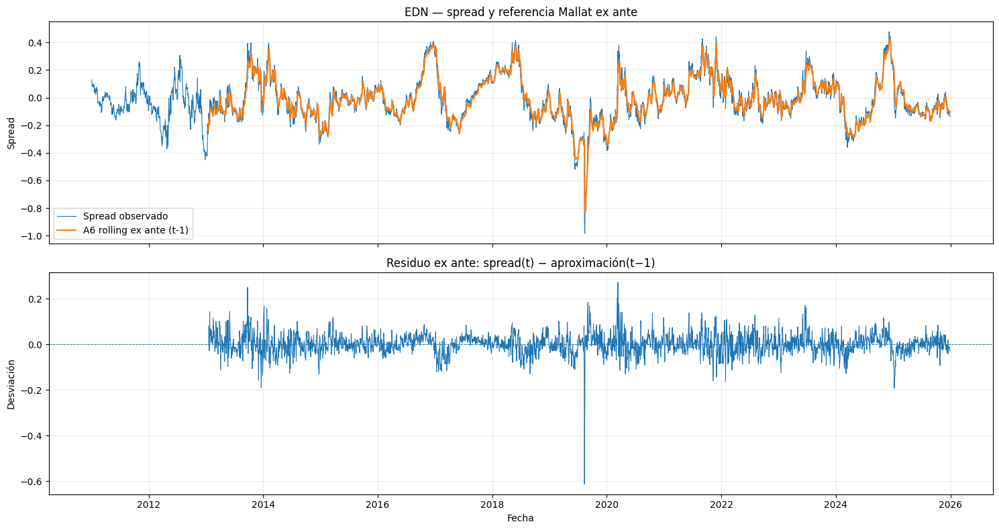

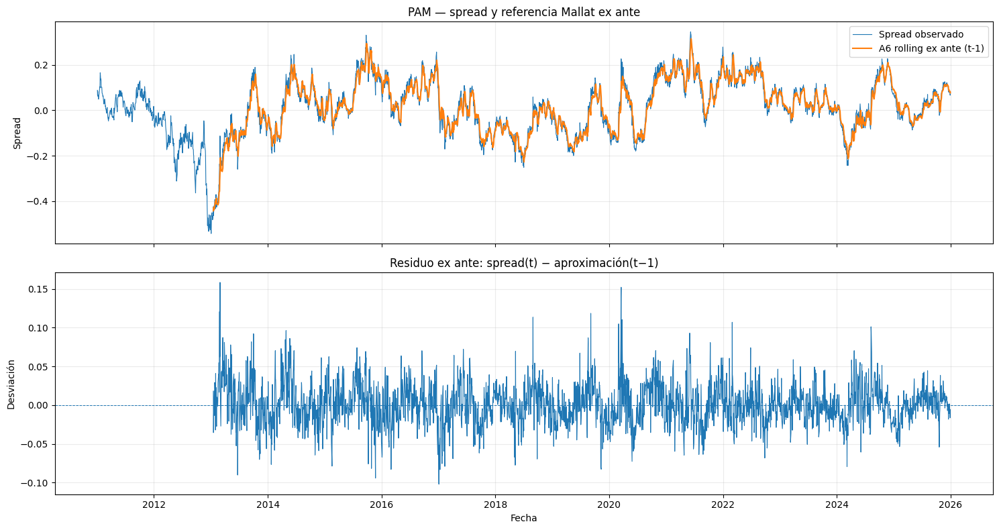

In [42]:
for ticker in spreads_df.columns:
    graficar_mallat_rolling(
        spread=spreads_df[ticker],
        aproximacion=aproximaciones_rolling[ticker],
        residuo=residuos_rolling[ticker],
        ticker=ticker,
        nivel=NIVEL_ROLLING
    )

## Prueba de ausencia de look-ahead

La prueba se realiza sobre `aproximaciones_rolling_raw`, porque compara estimaciones correspondientes a la misma fecha. Se recalcula el método sobre una muestra truncada y se verifica que agregar observaciones posteriores no modifique el pasado.

In [43]:
def verificar_sin_lookahead(
    spreads: pd.DataFrame,
    aproximaciones_completas: pd.DataFrame,
    ventana: int,
    wavelet: str,
    nivel: int,
    modo: str,
    proporcion_corte: float = 0.75
) -> pd.DataFrame:
    """
    Recalcula el método usando una versión truncada
    de los datos y verifica que el pasado no cambie.
    """
    posicion_corte = int(
        len(spreads) * proporcion_corte
    )

    spreads_truncados = spreads.iloc[
        :posicion_corte
    ].copy()

    aproximaciones_truncadas = (
        mallat_rolling_dataframe(
            spreads=spreads_truncados,
            ventana=ventana,
            wavelet=wavelet,
            nivel=nivel,
            modo=modo,
            conservar_aproximacion=True,
            detalles_conservados=()
        )
    )

    filas = []

    for ticker in spreads.columns:
        comparacion = pd.concat(
            [
                aproximaciones_completas[
                    ticker
                ].iloc[:posicion_corte].rename(
                    "completo"
                ),
                aproximaciones_truncadas[
                    ticker
                ].rename("truncado")
            ],
            axis=1
        ).dropna()

        diferencia = (
            comparacion["completo"]
            - comparacion["truncado"]
        ).abs()

        filas.append(
            {
                "ticker": ticker,
                "observaciones_comparadas": len(
                    diferencia
                ),
                "diferencia_maxima": (
                    diferencia.max()
                ),
                "diferencia_media": (
                    diferencia.mean()
                )
            }
        )

    return pd.DataFrame(filas).set_index(
        "ticker"
    )

In [44]:
prueba_lookahead = verificar_sin_lookahead(
    spreads=spreads_df,
    aproximaciones_completas=(
        aproximaciones_rolling_raw
    ),
    ventana=VENTANA_ROLLING,
    wavelet=WAVELET_ROLLING,
    nivel=NIVEL_ROLLING,
    modo=MODO_BORDE_ROLLING,
    proporcion_corte=0.75
)

display(prueba_lookahead)

Procesando GGAL...
Procesando BMA...
Procesando BBAR...
Procesando YPF...
Procesando TGS...
Procesando EDN...
Procesando PAM...


,observaciones_comparadas,diferencia_maxima,diferencia_media
ticker,,,
GGAL,2317,0.0,0.0
BMA,2317,0.0,0.0
BBAR,2317,0.0,0.0
YPF,2317,0.0,0.0
TGS,2317,0.0,0.0
EDN,2317,0.0,0.0
PAM,2317,0.0,0.0


La igualdad entre la estimación sobre la muestra completa y la estimación sobre la muestra truncada confirma que el algoritmo rolling no utiliza observaciones futuras reales. Esto no elimina la sensibilidad del último punto al método de extensión de borde.

## Mallat completo versus Mallat rolling raw

Esta comparación usa la versión `raw` para alinear ambas aproximaciones en la misma fecha. No se usa la referencia desplazada porque eso compararía `t` con `t-1`.

La aproximación completa no constituye una verdad disponible en tiempo real: utiliza información a ambos lados de cada fecha. La comparación cuantifica cuánto se revisa la estimación cuando se incorpora el futuro.

In [45]:
def comparar_completo_y_rolling(
    ticker: str,
    reconstruccion_completa: pd.DataFrame,
    aproximacion_rolling: pd.Series,
    nivel: int
) -> None:
    comparacion = pd.concat(
        [
            reconstruccion_completa[
                f"A{nivel}"
            ].rename("completa"),
            aproximacion_rolling.rename("rolling")
        ],
        axis=1
    ).dropna()

    plt.figure(figsize=(15, 5))

    plt.plot(
        comparacion.index,
        comparacion["completa"],
        label="Aproximación sobre muestra completa",
        linewidth=1.2
    )

    plt.plot(
        comparacion.index,
        comparacion["rolling"],
        label="Aproximación rolling",
        linewidth=1
    )

    plt.title(
        f"{ticker} — Mallat completo vs. rolling"
    )

    plt.xlabel("Fecha")
    plt.ylabel("Aproximación")
    plt.legend()
    plt.grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

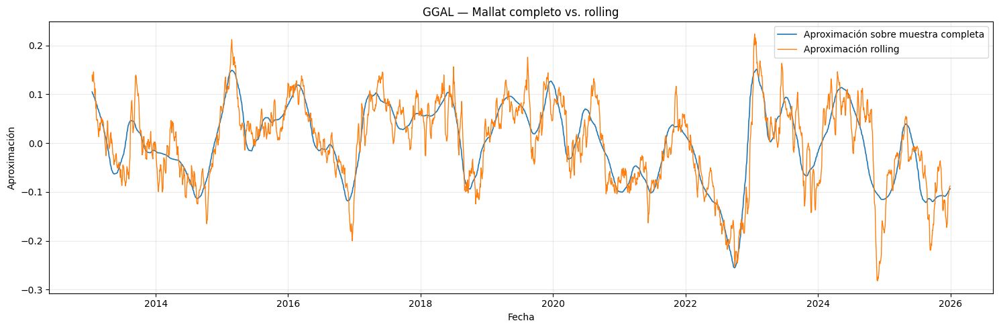

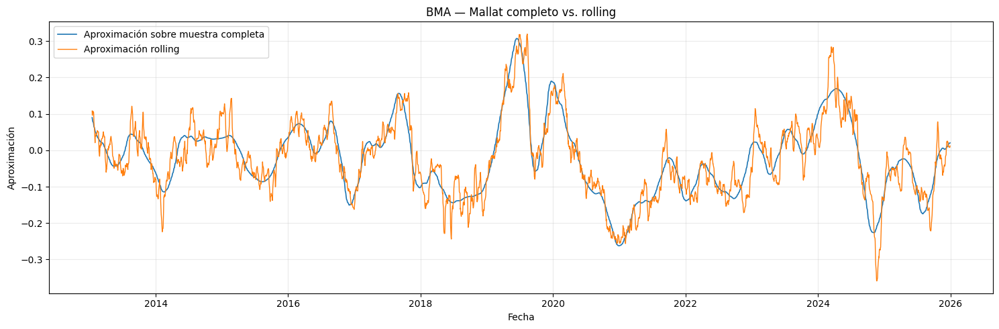

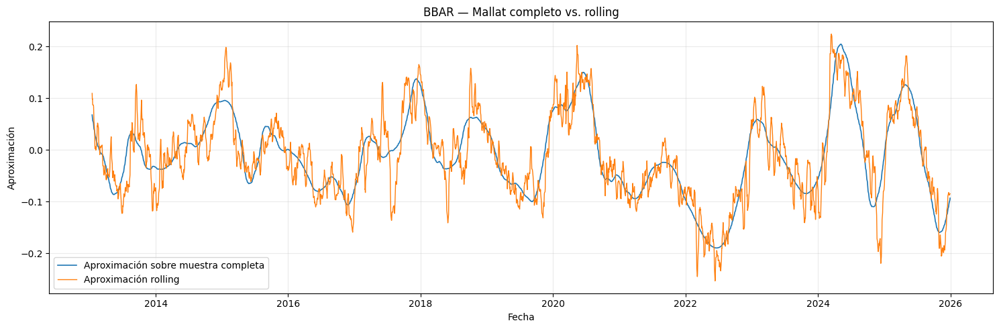

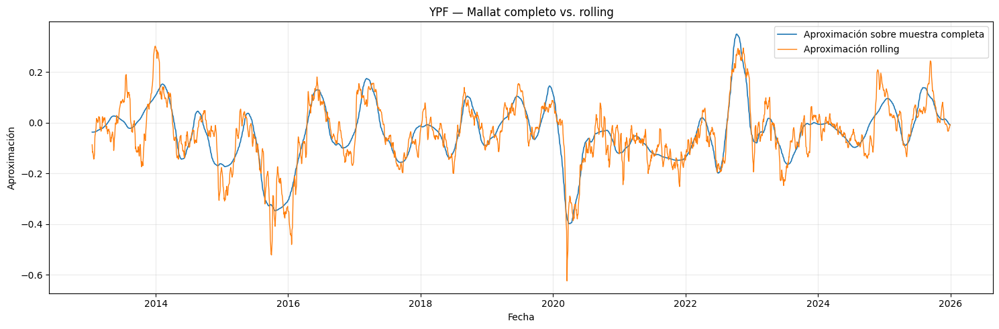

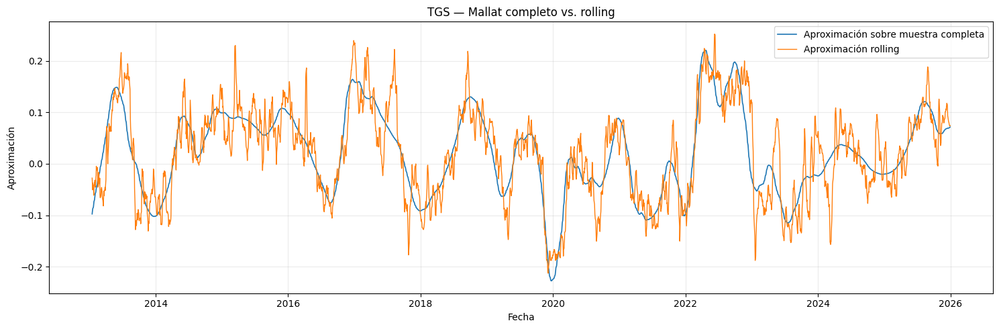

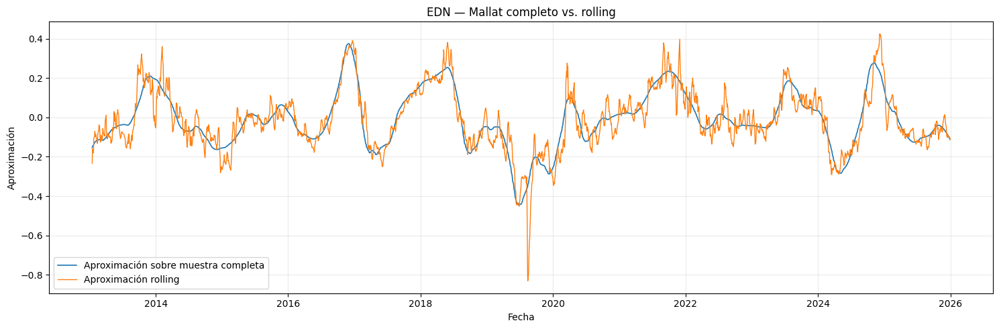

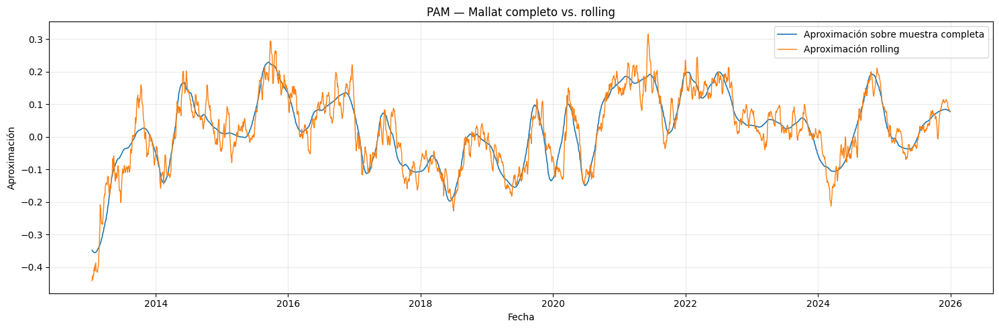

In [46]:
for ticker in spreads_df.columns:
    comparar_completo_y_rolling(
        ticker=ticker,
        reconstruccion_completa=(
            reconstrucciones_mallat[ticker]
        ),
        aproximacion_rolling=(
            aproximaciones_rolling_raw[ticker]
        ),
        nivel=NIVEL_ROLLING
    )

### Medimos en cuanto difieren

In [47]:
def diagnosticar_revision_rolling(
    reconstrucciones_completas: dict,
    aproximaciones_rolling: pd.DataFrame,
    nivel: int
) -> pd.DataFrame:
    """
    Compara la estimación disponible en tiempo real
    con la reconstrucción obtenida usando toda la muestra.
    """
    filas = []

    for ticker in aproximaciones_rolling.columns:
        comparacion = pd.concat(
            [
                reconstrucciones_completas[ticker][
                    f"A{nivel}"
                ].rename("completa"),
                aproximaciones_rolling[
                    ticker
                ].rename("rolling")
            ],
            axis=1
        ).dropna()

        diferencia = (
            comparacion["completa"]
            - comparacion["rolling"]
        )

        filas.append(
            {
                "ticker": ticker,
                "correlacion": (
                    comparacion["completa"]
                    .corr(comparacion["rolling"])
                ),
                "rmse": np.sqrt(
                    np.mean(diferencia ** 2)
                ),
                "diferencia_absoluta_media": (
                    diferencia.abs().mean()
                ),
                "diferencia_absoluta_maxima": (
                    diferencia.abs().max()
                )
            }
        )

    return pd.DataFrame(filas).set_index(
        "ticker"
    )

In [48]:
diagnostico_revision = (
    diagnosticar_revision_rolling(
        reconstrucciones_completas=(
            reconstrucciones_mallat
        ),
        aproximaciones_rolling=(
            aproximaciones_rolling_raw
        ),
        nivel=NIVEL_ROLLING
    )
)

display(diagnostico_revision)

,correlacion,rmse,diferencia_absoluta_media,diferencia_absoluta_maxima
ticker,,,,
GGAL,0.873755,0.041416,0.031697,0.177400
BMA,0.913609,0.043141,0.033840,0.167902
BBAR,0.886486,0.039260,0.030151,0.159327
YPF,0.876591,0.059174,0.044703,0.248891
TGS,0.859862,0.046060,0.035609,0.172467
EDN,0.900801,0.066344,0.048506,0.485258
PAM,0.933365,0.040333,0.031540,0.148272


## Referencias alternativas por escala

Usar solo `A6` deja en el residuo los movimientos asociados a `D6` hasta `D1`. También podemos construir referencias más reactivas agregando detalles gruesos. Estas variantes no se seleccionan visualmente: Persona 4 deberá comparar su capacidad para detectar eventos y su comportamiento fuera de muestra.

In [49]:
EJECUTAR_REFERENCIAS_POR_ESCALA = False

aproximaciones_rolling_A6_D6_raw = None
aproximaciones_rolling_A6_D6 = None
residuos_rolling_A6_D6 = None

if EJECUTAR_REFERENCIAS_POR_ESCALA:
    aproximaciones_rolling_A6_D6_raw = (
        mallat_rolling_dataframe(
            spreads=spreads_df,
            ventana=VENTANA_ROLLING,
            wavelet=WAVELET_ROLLING,
            nivel=NIVEL_ROLLING,
            modo=MODO_BORDE_ROLLING,
            conservar_aproximacion=True,
            detalles_conservados=(6,)
        )
    )

    aproximaciones_rolling_A6_D6 = (
        aproximaciones_rolling_A6_D6_raw.shift(1)
    )

    residuos_rolling_A6_D6 = (
        spreads_df - aproximaciones_rolling_A6_D6
    )

### Referencia A6 + D6 + D5

In [50]:
aproximaciones_rolling_A6_D6_D5_raw = None
aproximaciones_rolling_A6_D6_D5 = None
residuos_rolling_A6_D6_D5 = None

if EJECUTAR_REFERENCIAS_POR_ESCALA:
    aproximaciones_rolling_A6_D6_D5_raw = (
        mallat_rolling_dataframe(
            spreads=spreads_df,
            ventana=VENTANA_ROLLING,
            wavelet=WAVELET_ROLLING,
            nivel=NIVEL_ROLLING,
            modo=MODO_BORDE_ROLLING,
            conservar_aproximacion=True,
            detalles_conservados=(5, 6)
        )
    )

    aproximaciones_rolling_A6_D6_D5 = (
        aproximaciones_rolling_A6_D6_D5_raw.shift(1)
    )

    residuos_rolling_A6_D6_D5 = (
        spreads_df - aproximaciones_rolling_A6_D6_D5
    )

## Momento de uso de la señal

El residuo de la fecha `t` utiliza:

- el spread observado al cierre de `t`;
- una referencia estimada con información disponible hasta `t-1`.

La señal queda disponible al cierre de `t`. En una simulación financiera, una posición basada en esa señal solo puede aplicarse desde `t+1`. Persona 4 debe desplazar la posición, no volver a desplazar el residuo.

La descomposición rolling se recalcula usando únicamente las últimas 512 observaciones disponibles. La reconstrucción contemporánea se conserva como `raw` para las pruebas técnicas. Para construir el residuo, esa aproximación se desplaza una rueda, de modo que el spread actual se compare contra una referencia ex ante. La prueba con una muestra truncada confirma que agregar observaciones futuras no modifica las estimaciones rolling ya calculadas. Sin embargo, el último punto reconstruido sigue siendo sensible al método de extensión utilizado por la transformada.

La configuración `db4`, nivel 6, ventana 512 y borde `symmetric` se utiliza como configuración principal. La selección definitiva debe realizarse mediante validación temporal, comparando variantes y evaluando la convergencia real de los eventos. No debe elegirse una configuración solo porque produzca una curva visualmente más suave.

# 4. Análisis de sensibilidad del borde

El desplazamiento ex ante evita que el dato actual participe en su propia referencia, pero no elimina la sensibilidad de la DWT en el extremo derecho. Para estudiar esa limitación se comparan pocas variantes claras:

- Mallat `db4`, `A6`, borde `symmetric`.
- Mallat `db4`, `A6`, borde `smooth`.
- Mallat `db2`, `A6`, borde `smooth`.
- EMA causal de 128 ruedas como baseline.

En esta versión integrada el bloque queda activado para que Persona 4 pueda aplicar el mismo detector de eventos sobre todos los residuos. La ejecución puede demorar porque recalcula Mallat rolling varias veces. Para una corrida rápida de depuración, puede cambiarse temporalmente `EJECUTAR_SENSIBILIDAD_BORDE` a `False`; la evaluación principal seguirá funcionando con la variante `db4-A6-symmetric` y los baselines causales.

In [51]:
EJECUTAR_SENSIBILIDAD_BORDE = True

aproximaciones_variantes = {
    "mallat_db4_A6_symmetric": aproximaciones_rolling
}

if EJECUTAR_SENSIBILIDAD_BORDE:
    aproximaciones_variantes[
        "mallat_db4_A6_smooth"
    ] = mallat_rolling_dataframe(
        spreads=spreads_df,
        ventana=VENTANA_ROLLING,
        wavelet="db4",
        nivel=6,
        modo="smooth",
        conservar_aproximacion=True,
        detalles_conservados=()
    ).shift(1)

    aproximaciones_variantes[
        "mallat_db2_A6_smooth"
    ] = mallat_rolling_dataframe(
        spreads=spreads_df,
        ventana=VENTANA_ROLLING,
        wavelet="db2",
        nivel=6,
        modo="smooth",
        conservar_aproximacion=True,
        detalles_conservados=()
    ).shift(1)

    aproximaciones_variantes[
        "ema_128"
    ] = (
        spreads_df
        .ewm(
            span=128,
            adjust=False,
            min_periods=128
        )
        .mean()
        .shift(1)
    )

residuos_variantes = {
    nombre: spreads_df - aproximacion
    for nombre, aproximacion
    in aproximaciones_variantes.items()
}

print(
    "Variantes disponibles:",
    list(residuos_variantes)
)

Procesando GGAL...
Procesando BMA...
Procesando BBAR...
Procesando YPF...
Procesando TGS...
Procesando EDN...
Procesando PAM...
Procesando GGAL...
Procesando BMA...
Procesando BBAR...
Procesando YPF...
Procesando TGS...
Procesando EDN...
Procesando PAM...
Variantes disponibles: ['mallat_db4_A6_symmetric', 'mallat_db4_A6_smooth', 'mallat_db2_A6_smooth', 'ema_128']


In [52]:
def resumir_variante_referencia(
    spreads: pd.DataFrame,
    aproximaciones: dict[str, pd.DataFrame],
    residuos: dict[str, pd.DataFrame]
) -> pd.DataFrame:
    """Diagnóstico descriptivo; no reemplaza la evaluación de Persona 4."""
    filas = []

    for nombre, aproximacion in aproximaciones.items():
        residuo = residuos[nombre]

        for ticker in spreads.columns:
            datos = pd.concat(
                [
                    spreads[ticker].rename("spread"),
                    aproximacion[ticker].rename("aproximacion"),
                    residuo[ticker].rename("residuo")
                ],
                axis=1
            ).dropna()

            rugosidad_spread = datos["spread"].diff().std()
            rugosidad_aproximacion = (
                datos["aproximacion"].diff().std()
            )

            filas.append(
                {
                    "variante": nombre,
                    "ticker": ticker,
                    "observaciones": len(datos),
                    "correlacion_spread_aproximacion": (
                        datos["spread"].corr(
                            datos["aproximacion"]
                        )
                    ),
                    "proporcion_varianza_residual": (
                        datos["residuo"].var()
                        / datos["spread"].var()
                    ),
                    "ratio_rugosidad": (
                        rugosidad_aproximacion
                        / rugosidad_spread
                        if rugosidad_spread > 0
                        else np.nan
                    )
                }
            )

    return pd.DataFrame(filas)


resumen_variantes = resumir_variante_referencia(
    spreads=spreads_df,
    aproximaciones=aproximaciones_variantes,
    residuos=residuos_variantes
)

display(resumen_variantes)

,variante,ticker,observaciones,correlacion_spread_aproximacion,proporcion_varianza_residual,ratio_rugosidad
0,mallat_db4_A6_symmetric,GGAL,3259,0.964257,0.071256,0.486328
1,mallat_db4_A6_symmetric,BMA,3259,0.971666,0.056476,0.503812
2,mallat_db4_A6_symmetric,BBAR,3259,0.960885,0.077078,0.483838
3,mallat_db4_A6_symmetric,YPF,3259,0.963871,0.072836,0.518653
4,mallat_db4_A6_symmetric,TGS,3259,0.955141,0.088443,0.484768
5,mallat_db4_A6_symmetric,EDN,3259,0.961117,0.076568,0.483773
6,mallat_db4_A6_symmetric,PAM,3259,0.973057,0.053211,0.479418
7,mallat_db4_A6_smooth,GGAL,3259,0.833791,0.415151,3.859203
8,mallat_db4_A6_smooth,BMA,3259,0.869545,0.312069,3.816825
9,mallat_db4_A6_smooth,BBAR,3259,0.819065,0.489217,3.887432


# 5. Resumen de la salida principal

La tabla resume la referencia ex ante y el residuo final que se entregan a Persona 4.

In [53]:
def resumir_resultados_mallat(
    spreads: pd.DataFrame,
    aproximaciones: pd.DataFrame,
    residuos: pd.DataFrame
) -> pd.DataFrame:
    filas = []

    for ticker in spreads.columns:
        datos = pd.concat(
            [
                spreads[ticker].rename("spread"),
                aproximaciones[ticker].rename("aproximacion"),
                residuos[ticker].rename("residuo")
            ],
            axis=1
        ).dropna()

        varianza_spread = datos["spread"].var()
        varianza_residuo = datos["residuo"].var()

        filas.append(
            {
                "ticker": ticker,
                "observaciones_totales": spreads[ticker].notna().sum(),
                "observaciones_rolling": len(datos),
                "media_spread": datos["spread"].mean(),
                "desvio_spread": datos["spread"].std(),
                "desvio_aproximacion": datos["aproximacion"].std(),
                "desvio_residuo": datos["residuo"].std(),
                "correlacion_spread_aproximacion": (
                    datos["spread"].corr(
                        datos["aproximacion"]
                    )
                ),
                "proporcion_varianza_residual": (
                    varianza_residuo / varianza_spread
                    if varianza_spread > 0
                    else np.nan
                )
            }
        )

    return pd.DataFrame(filas).set_index("ticker")

In [54]:
resumen_mallat_rolling = resumir_resultados_mallat(
    spreads=spreads_df,
    aproximaciones=aproximaciones_rolling,
    residuos=residuos_rolling
)

display(
    resumen_mallat_rolling.style.format(
        {
            "media_spread": "{:.5f}",
            "desvio_spread": "{:.5f}",
            "desvio_aproximacion": "{:.5f}",
            "desvio_residuo": "{:.5f}",
            "correlacion_spread_aproximacion": "{:.3f}",
            "proporcion_varianza_residual": "{:.2%}"
        }
    )
)

,observaciones_totales,observaciones_rolling,media_spread,desvio_spread,desvio_aproximacion,desvio_residuo,correlacion_spread_aproximacion,proporcion_varianza_residual
ticker,,,,,,,,
GGAL,3771,3259,0.00028,0.09116,0.08496,0.02434,0.964,7.13%
BMA,3771,3259,-0.02407,0.11181,0.10588,0.02657,0.972,5.65%
BBAR,3771,3259,-0.01240,0.09004,0.08476,0.02500,0.961,7.71%
YPF,3771,3259,-0.04134,0.13294,0.12237,0.03588,0.964,7.28%
TGS,3771,3259,0.02087,0.09710,0.09011,0.02888,0.955,8.84%
EDN,3771,3259,-0.00998,0.16175,0.15259,0.04476,0.961,7.66%
PAM,3771,3259,0.02243,0.11603,0.11207,0.02676,0.973,5.32%


# 6. Función integral del pipeline

La función devuelve tanto la versión rolling raw para diagnóstico como la referencia ex ante y el residuo que se entregan a Persona 4.

In [55]:
def procesar_spreads_con_mallat(
    spreads: pd.DataFrame,
    wavelet: str = "db4",
    nivel_descriptivo: int = 6,
    nivel_rolling: int = 6,
    ventana_rolling: int = 512,
    modo: str = "symmetric",
    desplazamiento_referencia: int = 1
) -> dict:
    """
    Ejecuta el módulo completo de procesamiento de señales.

    `aproximaciones_rolling_raw` utiliza información hasta t.
    `aproximaciones_rolling` se desplaza la cantidad indicada
    y funciona como referencia ex ante.
    """
    validar_spreads(spreads)

    if desplazamiento_referencia < 1:
        raise ValueError(
            "desplazamiento_referencia debe ser al menos 1."
        )

    resultados_fft = {
        columna: calcular_espectro_fft(
            spreads[columna]
        )
        for columna in spreads.columns
    }

    resultados_mallat = descomponer_mallat(
        spreads=spreads,
        wavelet=wavelet,
        nivel=nivel_descriptivo,
        modo=modo
    )

    reconstrucciones = {
        ticker: reconstruir_todas_las_componentes(
            resultado
        )
        for ticker, resultado
        in resultados_mallat.items()
    }

    energias = {
        ticker: calcular_energia_mallat(
            resultado
        )
        for ticker, resultado
        in resultados_mallat.items()
    }

    aproximaciones_rolling_raw = (
        mallat_rolling_dataframe(
            spreads=spreads,
            ventana=ventana_rolling,
            wavelet=wavelet,
            nivel=nivel_rolling,
            modo=modo,
            conservar_aproximacion=True,
            detalles_conservados=()
        )
    )

    aproximaciones_rolling = (
        aproximaciones_rolling_raw.shift(
            desplazamiento_referencia
        )
    )

    residuos_rolling = (
        spreads - aproximaciones_rolling
    )

    resumen = resumir_resultados_mallat(
        spreads=spreads,
        aproximaciones=aproximaciones_rolling,
        residuos=residuos_rolling
    )

    configuracion = {
        "wavelet": wavelet,
        "nivel_descriptivo": nivel_descriptivo,
        "nivel_rolling": nivel_rolling,
        "ventana_rolling": ventana_rolling,
        "modo_borde": modo,
        "desplazamiento_referencia": (
            desplazamiento_referencia
        )
    }

    return {
        "configuracion": configuracion,
        "fft": resultados_fft,
        "mallat_completo": resultados_mallat,
        "reconstrucciones": reconstrucciones,
        "energias": energias,
        "aproximaciones_rolling_raw": (
            aproximaciones_rolling_raw
        ),
        "aproximaciones_rolling": (
            aproximaciones_rolling
        ),
        "residuos_rolling": residuos_rolling,
        "resumen_rolling": resumen
    }

In [56]:
EJECUTAR_PIPELINE_COMPLETO_NUEVAMENTE = False

if EJECUTAR_PIPELINE_COMPLETO_NUEVAMENTE:
    resultados_persona_3 = procesar_spreads_con_mallat(
        spreads=spreads_df,
        wavelet="db4",
        nivel_descriptivo=6,
        nivel_rolling=6,
        ventana_rolling=512,
        modo="symmetric",
        desplazamiento_referencia=1
    )
else:
    # Reutilizamos los objetos ya calculados para evitar
    # ejecutar nuevamente todo el notebook.
    resultados_persona_3 = {
        "configuracion": {
            "wavelet": WAVELET_ROLLING,
            "nivel_descriptivo": NIVEL_MALLAT,
            "nivel_rolling": NIVEL_ROLLING,
            "ventana_rolling": VENTANA_ROLLING,
            "modo_borde": MODO_BORDE_ROLLING,
            "desplazamiento_referencia": 1
        },
        "fft": resultados_fft,
        "mallat_completo": resultados_mallat,
        "reconstrucciones": reconstrucciones_mallat,
        "energias": energias_mallat,
        "aproximaciones_rolling_raw": (
            aproximaciones_rolling_raw
        ),
        "aproximaciones_rolling": (
            aproximaciones_rolling
        ),
        "residuos_rolling": residuos_rolling,
        "resumen_rolling": resumen_mallat_rolling
    }

residuos_para_persona_4 = (
    resultados_persona_3["residuos_rolling"]
)

aproximaciones_para_persona_4 = (
    resultados_persona_3["aproximaciones_rolling"]
)

print(
    "Salida para Persona 4:",
    residuos_para_persona_4.shape
)

Salida para Persona 4: (3771, 7)


# 7. Contrato de salida para Persona 4

Los objetos principales son:

- `aproximaciones_para_persona_4`: referencia lenta ex ante, desplazada una rueda.
- `residuos_para_persona_4`: spread actual menos referencia ex ante.

Ambos conservan el mismo índice y las mismas columnas que `spreads_df`. Las primeras observaciones son nulas hasta completar la ventana rolling y el desplazamiento.

Persona 4 debe calcular el z-score del residuo usando estadísticas pasadas y evaluar los eventos. Una posición hipotética basada en la señal del cierre de `t` solo puede aplicarse desde `t+1`.

In [57]:
assert aproximaciones_para_persona_4.index.equals(
    spreads_df.index
)
assert residuos_para_persona_4.index.equals(
    spreads_df.index
)
assert aproximaciones_para_persona_4.columns.equals(
    spreads_df.columns
)
assert residuos_para_persona_4.columns.equals(
    spreads_df.columns
)

print("Contrato de salida validado.")

Contrato de salida validado.


## Exportación opcional

Este bloque permite compartir las salidas sin ejecutar nuevamente el notebook.

In [58]:
EXPORTAR_RESULTADOS = False

if EXPORTAR_RESULTADOS:
    OUTPUT_DIR = Path("data/resultados_persona_3")
    OUTPUT_DIR.mkdir(
        parents=True,
        exist_ok=True
    )

    aproximaciones_para_persona_4.to_csv(
        OUTPUT_DIR / "aproximaciones_mallat_exante.csv"
    )

    residuos_para_persona_4.to_csv(
        OUTPUT_DIR / "residuos_mallat_exante.csv"
    )

    resultados_persona_3[
        "resumen_rolling"
    ].to_csv(
        OUTPUT_DIR / "resumen_mallat_exante.csv"
    )

    print(f"Archivos guardados en {OUTPUT_DIR.resolve()}")

# Conclusión metodológica

Mallat sobre la muestra completa permite describir la estructura multiescala de los spreads. La versión rolling evita utilizar observaciones futuras reales. Como el último punto reconstruido es sensible al borde, se conserva una versión raw para diagnóstico y se desplaza una rueda para construir una referencia ex ante. El residuo resultante es la entrada de Persona 4. La configuración definitiva debe seleccionarse mediante validación temporal y comparación con variantes de borde y baselines causales, no solamente por inspección visual.

# 8. Persona 4 — detección y evaluación de divergencias

Esta sección continúa directamente el pipeline de Personas 1, 2 y 3. **No se vuelven a descargar precios ni se construye una divergencia nueva**: se utilizan los spreads de Persona 2 y los residuos ex ante generados por Persona 3.

El objetivo ya no es solamente observar si el residuo parece extremo. Buscamos responder, de manera reproducible:

1. ¿Cuándo aparece una divergencia estadísticamente inusual?
2. ¿La divergencia vuelve hacia la zona normal?
3. ¿El spread realmente revierte o la referencia móvil simplemente lo alcanza?
4. ¿Los resultados son robustos al modo de borde y frente a baselines causales?
5. ¿La señal produce una reversión útil fuera de muestra?

La evaluación se separa en dos capas:

- **Análisis de eventos:** es la evidencia principal y no requiere convertir la señal en una cartera.
- **P&L proxy del spread:** resume la dirección de la reversión, pero no reemplaza un backtest financiero con ambas patas, costos y hedge ratios históricos.

## 8.1 Configuración de la evaluación

El z-score se calcula de manera ex ante: la media y el desvío utilizados en la fecha $t$ se estiman solamente con observaciones hasta $t-1$.

Definimos:

- entrada cuando $|z_t| \geq 2$;
- convergencia dinámica cuando $|z_t| \leq 0.5$ o la señal cruza el cero;
- horizonte máximo de seguimiento de 60 ruedas;
- resultados intermedios a 5, 10, 20 y 40 ruedas.

Estos parámetros son iniciales. Deben ajustarse con entrenamiento y validación; el período de test no debe utilizarse para elegirlos.

In [59]:
from scipy.signal import butter, sosfilt, sosfilt_zi

VENTANA_ZSCORE = 60
UMBRAL_ENTRADA = 2.0
UMBRAL_SALIDA = 0.5
HORIZONTE_MAXIMO = 60
HORIZONTES_EVALUACION = (5, 10, 20, 40)

SPAN_EMA = 128
PERIODO_CORTE_BUTTERWORTH = 128
ORDEN_BUTTERWORTH = 4

# Está expresado en unidades de log-spread por unidad de cambio de posición.
# Se deja en cero porque el spread no contiene por sí solo los costos de las
# dos patas. Puede modificarse para un análisis de sensibilidad.
COSTO_PROXY_POR_CAMBIO = 0.0

METODO_PRINCIPAL = "mallat_db4_A6_symmetric"

if not 0 < UMBRAL_SALIDA < UMBRAL_ENTRADA:
    raise ValueError(
        "Debe cumplirse 0 < UMBRAL_SALIDA < UMBRAL_ENTRADA."
    )

if VENTANA_ZSCORE < 2:
    raise ValueError("VENTANA_ZSCORE debe ser al menos 2.")

if HORIZONTE_MAXIMO < max(HORIZONTES_EVALUACION):
    raise ValueError(
        "HORIZONTE_MAXIMO debe cubrir todos los horizontes de evaluación."
    )

print(
    "Configuración de Persona 4:",
    {
        "ventana_zscore": VENTANA_ZSCORE,
        "umbral_entrada": UMBRAL_ENTRADA,
        "umbral_salida": UMBRAL_SALIDA,
        "horizonte_maximo": HORIZONTE_MAXIMO,
        "horizontes": HORIZONTES_EVALUACION
    }
)

Configuración de Persona 4: {'ventana_zscore': 60, 'umbral_entrada': 2.0, 'umbral_salida': 0.5, 'horizonte_maximo': 60, 'horizontes': (5, 10, 20, 40)}


## 8.2 Métodos comparados

Persona 3 puede producir varias referencias Mallat. Además agregamos tres controles:

- **EMA 128 ex ante:** referencia causal simple.
- **Butterworth causal:** filtro de baja frecuencia aplicado solamente hacia adelante con `sosfilt`. No usamos `filtfilt`, porque la pasada hacia atrás y el tratamiento del extremo dificultan una interpretación en tiempo real.
- **Spread sin filtrar:** baseline para saber si el procesamiento agrega valor.

Todos los métodos entregan un residuo con el mismo índice y las mismas columnas. Las referencias se desplazan una rueda antes de construir el residuo, salvo el baseline sin filtrar, cuya referencia es cero por definición.

In [60]:
def construir_referencia_ema_exante(
    spreads: pd.DataFrame,
    span: int = 128
) -> pd.DataFrame:
    """EMA causal conocida en t-1 y utilizada para evaluar t."""
    if span < 2:
        raise ValueError("span debe ser al menos 2.")

    return (
        spreads
        .ewm(
            span=span,
            adjust=False,
            min_periods=span
        )
        .mean()
        .shift(1)
    )


def construir_referencia_butterworth_exante(
    spreads: pd.DataFrame,
    periodo_corte: int = 128,
    orden: int = 4
) -> pd.DataFrame:
    """
    Filtro Butterworth causal de baja frecuencia.

    La frecuencia de corte es 1 / periodo_corte oscilaciones por rueda.
    Se usa sosfilt, que procesa la señal únicamente hacia adelante.
    """
    if periodo_corte <= 2:
        raise ValueError("periodo_corte debe ser mayor que 2.")

    frecuencia_corte = 1.0 / periodo_corte

    if not 0 < frecuencia_corte < 0.5:
        raise ValueError(
            "La frecuencia de corte debe estar entre 0 y Nyquist (0.5)."
        )

    sos = butter(
        N=orden,
        Wn=frecuencia_corte,
        btype="low",
        fs=1.0,
        output="sos"
    )

    referencia = pd.DataFrame(
        index=spreads.index,
        columns=spreads.columns,
        dtype=float
    )

    for ticker in spreads.columns:
        datos = np.ascontiguousarray(
            spreads[ticker].to_numpy(
                dtype=np.float64,
                copy=True
            )
        )

        # Inicialización en estado estacionario alrededor del primer valor
        # para reducir el transitorio artificial del comienzo.
        zi = sosfilt_zi(sos) * datos[0]
        filtrado, _ = sosfilt(
            sos,
            datos,
            zi=zi
        )

        referencia[ticker] = filtrado

    # La referencia usada en t debe haber sido conocida en t-1.
    return referencia.shift(1)


# Copiamos las variantes ya construidas por Persona 3.
referencias_metodos = {
    nombre: aproximacion.copy()
    for nombre, aproximacion
    in aproximaciones_variantes.items()
}

residuos_metodos = {
    nombre: residuo.copy()
    for nombre, residuo
    in residuos_variantes.items()
}

# Baseline EMA. Si Persona 3 ya lo generó, no se recalcula.
if "ema_128" not in referencias_metodos:
    referencias_metodos["ema_128"] = (
        construir_referencia_ema_exante(
            spreads=spreads_df,
            span=SPAN_EMA
        )
    )
    residuos_metodos["ema_128"] = (
        spreads_df - referencias_metodos["ema_128"]
    )

# Baseline Butterworth causal sobre el spread.
referencias_metodos["butterworth_causal_128"] = (
    construir_referencia_butterworth_exante(
        spreads=spreads_df,
        periodo_corte=PERIODO_CORTE_BUTTERWORTH,
        orden=ORDEN_BUTTERWORTH
    )
)
residuos_metodos["butterworth_causal_128"] = (
    spreads_df
    - referencias_metodos["butterworth_causal_128"]
)

# Baseline sin filtrado. Su referencia es cero.
referencias_metodos["spread_sin_filtrar"] = pd.DataFrame(
    0.0,
    index=spreads_df.index,
    columns=spreads_df.columns
)
residuos_metodos["spread_sin_filtrar"] = spreads_df.copy()

# Validación del contrato común.
for nombre, residuo in residuos_metodos.items():
    if not residuo.index.equals(spreads_df.index):
        raise ValueError(
            f"El método {nombre} no conserva el índice de spreads_df."
        )

    if not residuo.columns.equals(spreads_df.columns):
        raise ValueError(
            f"El método {nombre} no conserva las columnas de spreads_df."
        )

if METODO_PRINCIPAL not in residuos_metodos:
    candidatos_mallat = [
        nombre
        for nombre in residuos_metodos
        if nombre.startswith("mallat_")
    ]

    if not candidatos_mallat:
        raise ValueError(
            "No hay ninguna variante Mallat disponible."
        )

    METODO_PRINCIPAL = candidatos_mallat[0]

print("Métodos disponibles:")
for nombre in residuos_metodos:
    print("-", nombre)

Métodos disponibles:
- mallat_db4_A6_symmetric
- mallat_db4_A6_smooth
- mallat_db2_A6_smooth
- ema_128
- butterworth_causal_128
- spread_sin_filtrar


In [61]:
filas_input = []

for metodo, residuo_df in residuos_metodos.items():
    for ticker in residuo_df.columns:
        serie = residuo_df[ticker]
        filas_input.append(
            {
                "metodo": metodo,
                "ticker": ticker,
                "observaciones_validas": int(serie.notna().sum()),
                "primer_valor_valido": serie.first_valid_index(),
                "desvio_residuo": serie.std()
            }
        )

resumen_inputs_persona_4 = pd.DataFrame(filas_input)

display(
    resumen_inputs_persona_4.sort_values(
        ["metodo", "ticker"]
    )
)

,metodo,ticker,observaciones_validas,primer_valor_valido,desvio_residuo
30,butterworth_causal_128,BBAR,3770,2011-01-04,0.104660
29,butterworth_causal_128,BMA,3770,2011-01-04,0.115399
33,butterworth_causal_128,EDN,3770,2011-01-04,0.167166
28,butterworth_causal_128,GGAL,3770,2011-01-04,0.110143
34,butterworth_causal_128,PAM,3770,2011-01-04,0.112975
32,butterworth_causal_128,TGS,3770,2011-01-04,0.108061
31,butterworth_causal_128,YPF,3770,2011-01-04,0.162203
23,ema_128,BBAR,3643,2011-07-07,0.075122
22,ema_128,BMA,3643,2011-07-07,0.086417
26,ema_128,EDN,3643,2011-07-07,0.126654


## 8.3 Z-score ex ante

Para cada residuo $e_t$ calculamos:

\[
z_t = \frac{e_t - \mu_{t-1}}{\sigma_{t-1}}
\]

La media y el desvío se desplazan una rueda. Así, el valor extremo observado en $t$ no modifica las estadísticas con las que se lo clasifica.

El z-score permite comparar acciones y métodos con escalas distintas. Un residuo de `0.03` puede ser enorme para un ticker y habitual para otro; el z-score expresa esa distancia en unidades de desvío histórico reciente.

In [62]:
def calcular_zscore_exante_serie(
    serie: pd.Series,
    ventana: int = 60
) -> pd.Series:
    """Z-score cuya media y desvío utilizan datos hasta t-1."""
    media_pasada = (
        serie
        .rolling(
            window=ventana,
            min_periods=ventana
        )
        .mean()
        .shift(1)
    )

    desvio_pasado = (
        serie
        .rolling(
            window=ventana,
            min_periods=ventana
        )
        .std(ddof=1)
        .shift(1)
    )

    desvio_pasado = desvio_pasado.where(
        desvio_pasado > 1e-12
    )

    zscore = (
        serie - media_pasada
    ) / desvio_pasado

    zscore.name = serie.name
    return zscore


def calcular_zscores_metodos(
    residuos: dict[str, pd.DataFrame],
    ventana: int
) -> dict[str, pd.DataFrame]:
    resultado = {}

    for metodo, residuo_df in residuos.items():
        resultado[metodo] = residuo_df.apply(
            calcular_zscore_exante_serie,
            ventana=ventana
        )

    return resultado


zscores_metodos = calcular_zscores_metodos(
    residuos=residuos_metodos,
    ventana=VENTANA_ZSCORE
)

resumen_zscores = []

for metodo, zscore_df in zscores_metodos.items():
    for ticker in zscore_df.columns:
        serie = zscore_df[ticker]
        resumen_zscores.append(
            {
                "metodo": metodo,
                "ticker": ticker,
                "observaciones_zscore": int(serie.notna().sum()),
                "eventos_brutos_abs_z_mayor_entrada": int(
                    (serie.abs() >= UMBRAL_ENTRADA).sum()
                ),
                "media_zscore": serie.mean(),
                "desvio_zscore": serie.std()
            }
        )

resumen_zscores = pd.DataFrame(resumen_zscores)
display(resumen_zscores)

,metodo,ticker,observaciones_zscore,eventos_brutos_abs_z_mayor_entrada,media_zscore,desvio_zscore
0,mallat_db4_A6_symmetric,GGAL,3199,240,-0.002062,1.134486
1,mallat_db4_A6_symmetric,BMA,3199,260,0.014647,1.149406
2,mallat_db4_A6_symmetric,BBAR,3199,221,0.002489,1.109937
3,mallat_db4_A6_symmetric,YPF,3199,266,-0.031968,1.182639
4,mallat_db4_A6_symmetric,TGS,3199,216,0.008035,1.115333
5,mallat_db4_A6_symmetric,EDN,3199,248,0.012939,1.139294
6,mallat_db4_A6_symmetric,PAM,3199,226,0.007880,1.123048
7,mallat_db4_A6_smooth,GGAL,3199,193,0.003329,1.057339
8,mallat_db4_A6_smooth,BMA,3199,202,0.008184,1.063898
9,mallat_db4_A6_smooth,BBAR,3199,180,-0.002569,1.051819


## 8.4 Inspección visual de la señal principal

El panel superior muestra el residuo ex ante. El panel inferior muestra el z-score y los umbrales de entrada y salida.

Los puntos que superan $\pm 2$ son candidatos a eventos, pero no se cuentan todos los días extremos como eventos independientes. La sección siguiente utiliza una máquina de estados para evitar duplicar una misma divergencia.

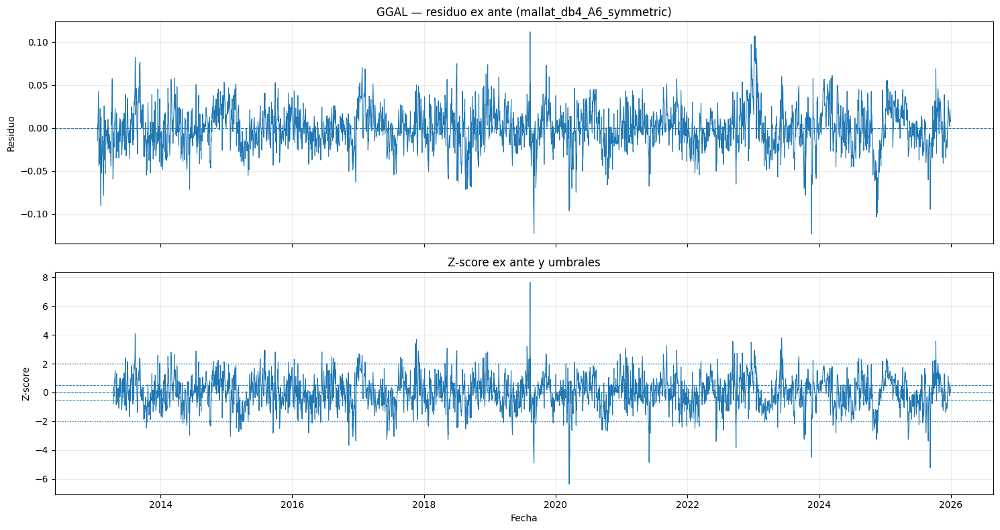

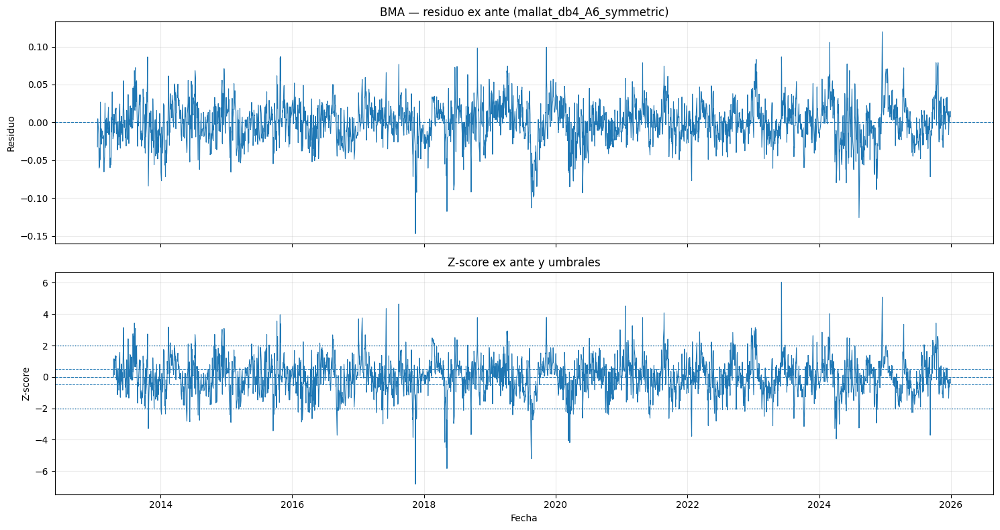

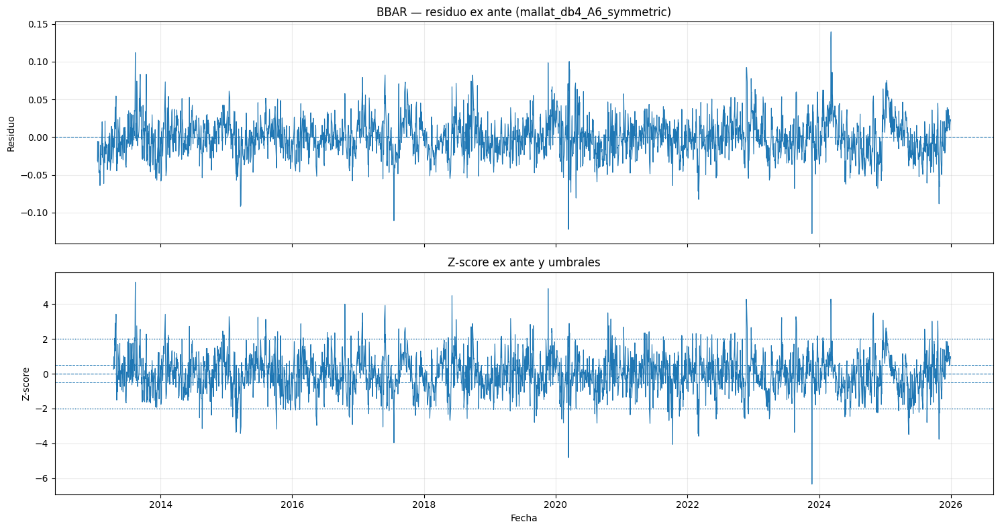

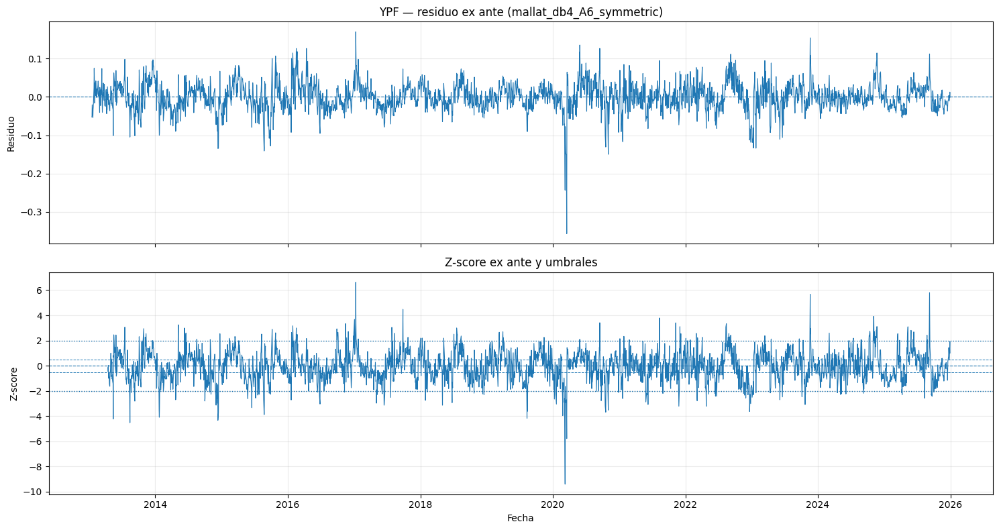

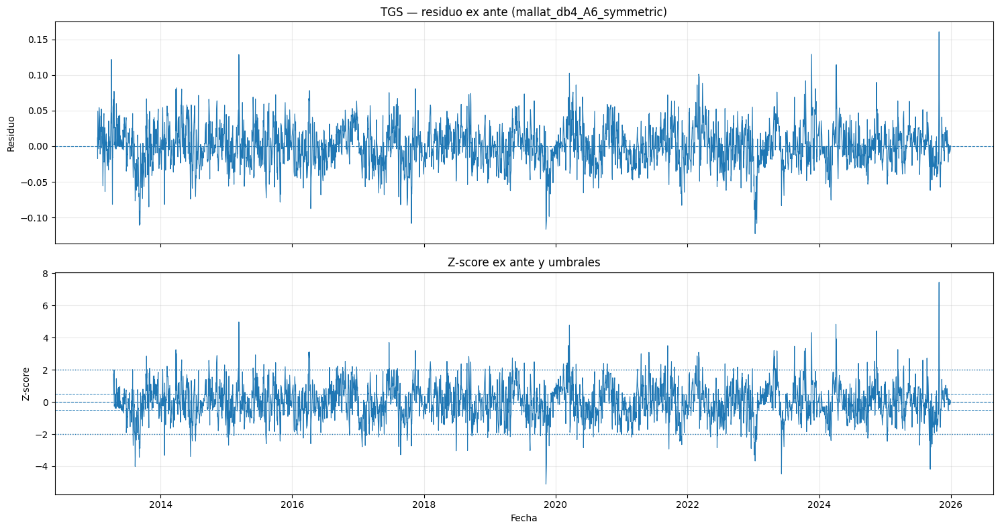

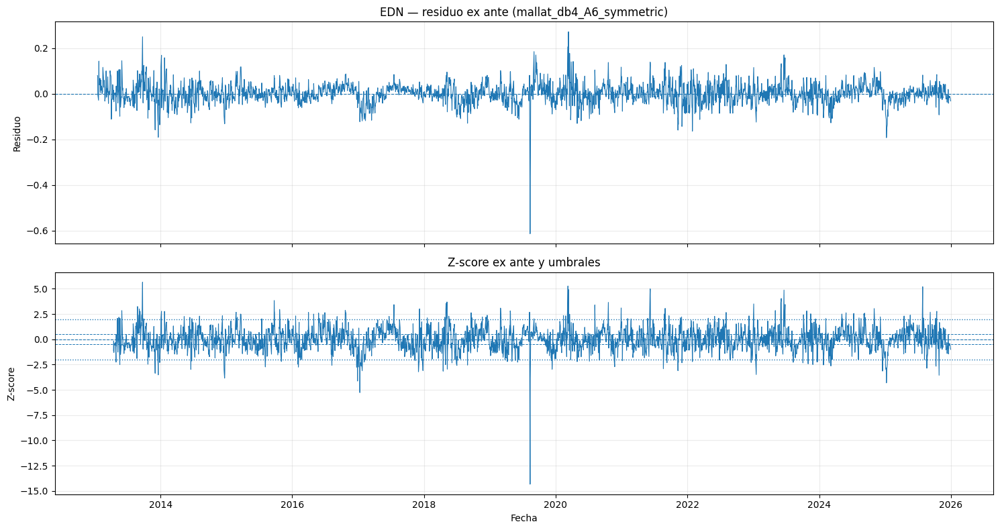

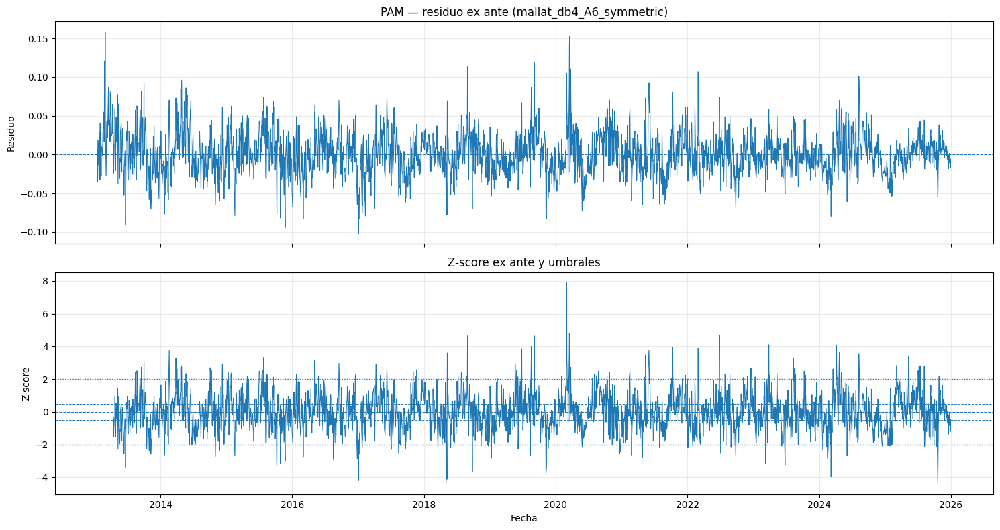

In [63]:
def graficar_residuo_y_zscore(
    residuo: pd.Series,
    zscore: pd.Series,
    ticker: str,
    metodo: str,
    umbral_entrada: float,
    umbral_salida: float
) -> None:
    fig, axes = plt.subplots(
        nrows=2,
        ncols=1,
        figsize=(15, 8),
        sharex=True
    )

    axes[0].plot(
        residuo.index,
        residuo,
        linewidth=0.8
    )
    axes[0].axhline(0, linestyle="--", linewidth=0.8)
    axes[0].set_title(
        f"{ticker} — residuo ex ante ({metodo})"
    )
    axes[0].set_ylabel("Residuo")
    axes[0].grid(alpha=0.25)

    axes[1].plot(
        zscore.index,
        zscore,
        linewidth=0.8
    )
    axes[1].axhline(0, linestyle="--", linewidth=0.8)
    axes[1].axhline(
        umbral_entrada,
        linestyle=":",
        linewidth=1
    )
    axes[1].axhline(
        -umbral_entrada,
        linestyle=":",
        linewidth=1
    )
    axes[1].axhline(
        umbral_salida,
        linestyle="--",
        linewidth=0.7
    )
    axes[1].axhline(
        -umbral_salida,
        linestyle="--",
        linewidth=0.7
    )
    axes[1].set_title(
        "Z-score ex ante y umbrales"
    )
    axes[1].set_ylabel("Z-score")
    axes[1].set_xlabel("Fecha")
    axes[1].grid(alpha=0.25)

    plt.tight_layout()
    plt.show()


for ticker in spreads_df.columns:
    graficar_residuo_y_zscore(
        residuo=residuos_metodos[
            METODO_PRINCIPAL
        ][ticker],
        zscore=zscores_metodos[
            METODO_PRINCIPAL
        ][ticker],
        ticker=ticker,
        metodo=METODO_PRINCIPAL,
        umbral_entrada=UMBRAL_ENTRADA,
        umbral_salida=UMBRAL_SALIDA
    )

## 8.5 Detección de eventos sin solapamiento

Un evento comienza cuando el z-score cruza el umbral de entrada. Mientras ese evento permanece activo no se abre otro evento sobre el mismo ticker y método.

Se registran dos conceptos de convergencia:

### Convergencia dinámica

El z-score vuelve a la zona $|z| \leq 0.5$ o cruza el cero. Esta medida responde cuándo el filtro vuelve a considerar normal la observación.

### Reducción contra referencia fija

Congelamos la referencia disponible al iniciar el evento. Consideramos que la distancia se redujo cuando queda por debajo del 50% de su valor inicial o cruza esa referencia. Esta medida evita confundir una reversión real con una referencia móvil que simplemente alcanzó al spread.

También medimos el movimiento del spread en la dirección esperada:

\[
R_h = -\operatorname{sign}(z_{t_0})\left(S_{t_0+h}-S_{t_0}\right)
\]

$R_h>0$ indica que el spread se movió en dirección de reversión.

In [64]:
def detectar_eventos_serie(
    zscore: pd.Series,
    residuo: pd.Series,
    spread: pd.Series,
    referencia: pd.Series,
    metodo: str,
    ticker: str,
    umbral_entrada: float = 2.0,
    umbral_salida: float = 0.5,
    horizonte_maximo: int = 60,
    horizontes: tuple[int, ...] = (5, 10, 20, 40),
    fraccion_referencia_fija: float = 0.5
) -> pd.DataFrame:
    """Detecta episodios extremos y mide su evolución posterior."""
    datos = pd.concat(
        [
            zscore.rename("zscore"),
            residuo.rename("residuo"),
            spread.rename("spread"),
            referencia.rename("referencia")
        ],
        axis=1
    ).sort_index()

    registros = []
    n = len(datos)
    i = 1

    while i < n:
        z_actual = datos["zscore"].iloc[i]
        z_anterior = datos["zscore"].iloc[i - 1]

        if not np.isfinite(z_actual):
            i += 1
            continue

        cruza_entrada = (
            abs(z_actual) >= umbral_entrada
            and (
                not np.isfinite(z_anterior)
                or abs(z_anterior) < umbral_entrada
                or np.sign(z_anterior) != np.sign(z_actual)
            )
        )

        if not cruza_entrada:
            i += 1
            continue

        signo_inicial = 1 if z_actual > 0 else -1
        limite = min(
            i + horizonte_maximo,
            n - 1
        )

        spread_inicial = datos["spread"].iloc[i]
        residuo_inicial = datos["residuo"].iloc[i]
        referencia_inicial = datos["referencia"].iloc[i]

        if not np.isfinite(referencia_inicial):
            referencia_inicial = (
                spread_inicial - residuo_inicial
            )

        distancia_fija_inicial = (
            spread_inicial - referencia_inicial
        )

        posicion_convergencia_dinamica = None
        posicion_reduccion_fija = None

        for j in range(i + 1, limite + 1):
            z_futuro = datos["zscore"].iloc[j]

            if (
                posicion_convergencia_dinamica is None
                and np.isfinite(z_futuro)
                and (
                    abs(z_futuro) <= umbral_salida
                    or signo_inicial * z_futuro <= 0
                )
            ):
                posicion_convergencia_dinamica = j

            spread_futuro = datos["spread"].iloc[j]
            distancia_fija = (
                spread_futuro - referencia_inicial
            )

            if (
                posicion_reduccion_fija is None
                and np.isfinite(distancia_fija)
                and np.isfinite(distancia_fija_inicial)
                and abs(distancia_fija_inicial) > 1e-12
                and (
                    abs(distancia_fija)
                    <= fraccion_referencia_fija
                    * abs(distancia_fija_inicial)
                    or distancia_fija
                    * distancia_fija_inicial <= 0
                )
            ):
                posicion_reduccion_fija = j

        tramo_z = datos["zscore"].iloc[
            i:limite + 1
        ].dropna()

        if len(tramo_z) > 0:
            extension_adversa_z = max(
                0.0,
                float(
                    (
                        signo_inicial
                        * (tramo_z - z_actual)
                    ).max()
                )
            )
            max_abs_z = float(tramo_z.abs().max())
        else:
            extension_adversa_z = np.nan
            max_abs_z = np.nan

        registro = {
            "metodo": metodo,
            "ticker": ticker,
            "fecha_inicio": datos.index[i],
            "direccion_inicial": (
                "positiva"
                if signo_inicial > 0
                else "negativa"
            ),
            "signo_inicial": signo_inicial,
            "z_inicio": float(z_actual),
            "residuo_inicio": float(residuo_inicial),
            "spread_inicio": float(spread_inicial),
            "referencia_fija": float(referencia_inicial),
            "fecha_fin_seguimiento": datos.index[limite],
            "convergio_dinamica": (
                posicion_convergencia_dinamica
                is not None
            ),
            "fecha_convergencia_dinamica": (
                datos.index[posicion_convergencia_dinamica]
                if posicion_convergencia_dinamica
                is not None
                else pd.NaT
            ),
            "dias_convergencia_dinamica": (
                posicion_convergencia_dinamica - i
                if posicion_convergencia_dinamica
                is not None
                else np.nan
            ),
            "redujo_referencia_fija_50": (
                posicion_reduccion_fija is not None
            ),
            "fecha_reduccion_referencia_fija_50": (
                datos.index[posicion_reduccion_fija]
                if posicion_reduccion_fija
                is not None
                else pd.NaT
            ),
            "dias_reduccion_referencia_fija_50": (
                posicion_reduccion_fija - i
                if posicion_reduccion_fija
                is not None
                else np.nan
            ),
            "extension_adversa_z": extension_adversa_z,
            "max_abs_z": max_abs_z
        }

        for horizonte in horizontes:
            posicion_h = i + horizonte

            if posicion_h < n:
                spread_h = datos["spread"].iloc[posicion_h]
                residuo_h = datos["residuo"].iloc[posicion_h]
                distancia_fija_h = (
                    spread_h - referencia_inicial
                )

                registro[
                    f"reversion_spread_{horizonte}"
                ] = (
                    -signo_inicial
                    * (spread_h - spread_inicial)
                )

                registro[
                    f"reduccion_abs_residuo_{horizonte}"
                ] = (
                    1
                    - abs(residuo_h)
                    / abs(residuo_inicial)
                    if abs(residuo_inicial) > 1e-12
                    else np.nan
                )

                registro[
                    f"reduccion_distancia_fija_{horizonte}"
                ] = (
                    1
                    - abs(distancia_fija_h)
                    / abs(distancia_fija_inicial)
                    if abs(distancia_fija_inicial) > 1e-12
                    else np.nan
                )
            else:
                registro[
                    f"reversion_spread_{horizonte}"
                ] = np.nan
                registro[
                    f"reduccion_abs_residuo_{horizonte}"
                ] = np.nan
                registro[
                    f"reduccion_distancia_fija_{horizonte}"
                ] = np.nan

            registro[
                f"convergio_dinamica_{horizonte}"
            ] = (
                posicion_convergencia_dinamica
                is not None
                and posicion_convergencia_dinamica - i
                <= horizonte
            )

            registro[
                f"redujo_fija_50_{horizonte}"
            ] = (
                posicion_reduccion_fija is not None
                and posicion_reduccion_fija - i
                <= horizonte
            )

        registros.append(registro)

        # Si convergió, el episodio termina allí. Si no convergió,
        # bloqueamos nuevas entradas hasta completar el horizonte máximo.
        if posicion_convergencia_dinamica is not None:
            i = posicion_convergencia_dinamica + 1
        else:
            i = limite + 1

    return pd.DataFrame(registros)

In [65]:
eventos_lista = []

for metodo, zscore_df in zscores_metodos.items():
    for ticker in spreads_df.columns:
        eventos_ticker = detectar_eventos_serie(
            zscore=zscore_df[ticker],
            residuo=residuos_metodos[metodo][ticker],
            spread=spreads_df[ticker],
            referencia=referencias_metodos[metodo][ticker],
            metodo=metodo,
            ticker=ticker,
            umbral_entrada=UMBRAL_ENTRADA,
            umbral_salida=UMBRAL_SALIDA,
            horizonte_maximo=HORIZONTE_MAXIMO,
            horizontes=HORIZONTES_EVALUACION
        )

        if not eventos_ticker.empty:
            eventos_lista.append(eventos_ticker)

if eventos_lista:
    eventos_df = pd.concat(
        eventos_lista,
        ignore_index=True
    )
else:
    eventos_df = pd.DataFrame()

print(f"Eventos independientes detectados: {len(eventos_df):,}")
display(eventos_df.head())

Eventos independientes detectados: 4,248


,metodo,ticker,fecha_inicio,direccion_inicial,signo_inicial,z_inicio,residuo_inicio,spread_inicio,referencia_fija,fecha_fin_seguimiento,...,reversion_spread_20,reduccion_abs_residuo_20,reduccion_distancia_fija_20,convergio_dinamica_20,redujo_fija_50_20,reversion_spread_40,reduccion_abs_residuo_40,reduccion_distancia_fija_40,convergio_dinamica_40,redujo_fija_50_40
0,mallat_db4_A6_symmetric,GGAL,2013-06-21,positiva,1,2.412828,0.038865,-0.031444,-0.070309,2013-09-17,...,0.042256,0.747690,0.912766,True,True,-0.135052,-0.182334,-3.474850,True,True
1,mallat_db4_A6_symmetric,GGAL,2013-07-01,positiva,1,2.152236,0.034735,-0.051965,-0.086700,2013-09-25,...,0.004985,0.885452,0.143510,True,True,-0.085531,0.417484,-2.462382,True,True
2,mallat_db4_A6_symmetric,GGAL,2013-08-12,positiva,1,2.549415,0.044416,-0.000321,-0.044736,2013-11-05,...,-0.165532,-0.326610,-3.726859,True,False,-0.011383,0.686897,-0.256273,True,False
3,mallat_db4_A6_symmetric,GGAL,2013-09-06,positiva,1,2.373664,0.073297,0.127145,0.053848,2013-12-02,...,0.112240,0.546145,0.468697,True,True,0.151982,0.707020,-0.073521,True,True
4,mallat_db4_A6_symmetric,GGAL,2013-10-15,negativa,-1,-2.474543,-0.054869,-0.037258,0.017611,2014-01-10,...,-0.006659,0.764225,-0.121360,True,True,0.006800,0.711742,0.123924,True,True


## 8.6 Resumen de convergencia

La tasa de convergencia dinámica mide cuándo el z-score vuelve a la normalidad. La tasa de reducción contra referencia fija es más exigente: requiere que el spread se acerque a la referencia que existía al iniciar el evento.

La tasa de reversión a 20 ruedas indica qué proporción de eventos tuvo un movimiento del spread en la dirección esperada. Ninguna métrica debe interpretarse de manera aislada:

- una convergencia dinámica alta y una reducción fija baja puede indicar que la referencia persigue al spread;
- una reversión positiva con gran extensión adversa puede implicar riesgo elevado;
- pocos eventos producen estimaciones inestables.

In [66]:
def resumir_eventos(
    eventos: pd.DataFrame
) -> tuple[pd.DataFrame, pd.DataFrame]:
    if eventos.empty:
        return pd.DataFrame(), pd.DataFrame()

    resumen_ticker = (
        eventos
        .groupby(["metodo", "ticker"], as_index=False)
        .agg(
            eventos=("fecha_inicio", "size"),
            tasa_convergencia_dinamica=(
                "convergio_dinamica",
                "mean"
            ),
            mediana_dias_convergencia=(
                "dias_convergencia_dinamica",
                "median"
            ),
            tasa_reduccion_fija_50=(
                "redujo_referencia_fija_50",
                "mean"
            ),
            mediana_extension_adversa_z=(
                "extension_adversa_z",
                "median"
            ),
            reversion_media_20=(
                "reversion_spread_20",
                "mean"
            )
        )
    )

    tasa_reversion_20 = (
        eventos
        .assign(
            revirtio_20=(
                eventos["reversion_spread_20"] > 0
            )
        )
        .groupby(["metodo", "ticker"])[
            "revirtio_20"
        ]
        .mean()
        .rename("tasa_reversion_spread_20")
        .reset_index()
    )

    resumen_ticker = resumen_ticker.merge(
        tasa_reversion_20,
        on=["metodo", "ticker"],
        how="left"
    )

    resumen_metodo = (
        eventos
        .assign(
            revirtio_20=(
                eventos["reversion_spread_20"] > 0
            )
        )
        .groupby("metodo", as_index=False)
        .agg(
            eventos=("fecha_inicio", "size"),
            tasa_convergencia_dinamica=(
                "convergio_dinamica",
                "mean"
            ),
            mediana_dias_convergencia=(
                "dias_convergencia_dinamica",
                "median"
            ),
            tasa_reduccion_fija_50=(
                "redujo_referencia_fija_50",
                "mean"
            ),
            tasa_reversion_spread_20=(
                "revirtio_20",
                "mean"
            ),
            reversion_media_20=(
                "reversion_spread_20",
                "mean"
            ),
            mediana_extension_adversa_z=(
                "extension_adversa_z",
                "median"
            )
        )
        .sort_values(
            [
                "tasa_reduccion_fija_50",
                "tasa_reversion_spread_20"
            ],
            ascending=False
        )
    )

    return resumen_ticker, resumen_metodo


resumen_eventos_ticker, resumen_eventos_metodo = (
    resumir_eventos(eventos_df)
)

formato_porcentaje = {
    "tasa_convergencia_dinamica": "{:.1%}",
    "tasa_reduccion_fija_50": "{:.1%}",
    "tasa_reversion_spread_20": "{:.1%}"
}

if not resumen_eventos_metodo.empty:
    display(
        resumen_eventos_metodo.style.format(
            formato_porcentaje
        )
    )

    display(
        resumen_eventos_ticker.style.format(
            formato_porcentaje
        )
    )

,metodo,eventos,tasa_convergencia_dinamica,mediana_dias_convergencia,tasa_reduccion_fija_50,tasa_reversion_spread_20,reversion_media_20,mediana_extension_adversa_z
5,spread_sin_filtrar,560,97.5%,15.000000,90.0%,57.1%,0.017472,0.543133
0,butterworth_causal_128,506,94.3%,21.000000,85.8%,53.8%,0.008627,0.531710
1,ema_128,555,98.9%,14.000000,84.5%,55.9%,0.016092,0.494840
4,mallat_db4_A6_symmetric,993,100.0%,3.000000,84.4%,53.6%,0.005784,0.165119
2,mallat_db2_A6_smooth,527,99.4%,13.000000,81.2%,54.5%,0.005181,0.469275
3,mallat_db4_A6_smooth,1107,100.0%,2.000000,58.0%,48.2%,0.000834,0.042504


,metodo,ticker,eventos,tasa_convergencia_dinamica,mediana_dias_convergencia,tasa_reduccion_fija_50,mediana_extension_adversa_z,reversion_media_20,tasa_reversion_spread_20
0,butterworth_causal_128,BBAR,77,94.8%,19.000000,83.1%,0.585824,0.012778,59.7%
1,butterworth_causal_128,BMA,69,97.1%,30.000000,79.7%,0.527454,-0.005914,44.9%
2,butterworth_causal_128,EDN,74,93.2%,16.000000,85.1%,0.616087,0.017278,55.4%
3,butterworth_causal_128,GGAL,71,90.1%,22.000000,84.5%,0.479259,0.004520,56.3%
4,butterworth_causal_128,PAM,64,95.3%,29.000000,92.2%,0.586841,0.014935,54.7%
5,butterworth_causal_128,TGS,78,97.4%,18.000000,89.7%,0.473058,0.012631,55.1%
6,butterworth_causal_128,YPF,73,91.8%,21.000000,86.3%,0.518620,0.003585,49.3%
7,ema_128,BBAR,92,97.8%,11.000000,87.0%,0.524899,0.023908,63.0%
8,ema_128,BMA,67,100.0%,18.000000,80.6%,0.496055,-0.002911,47.8%
9,ema_128,EDN,82,97.6%,12.000000,81.7%,0.391401,0.042220,62.2%


## 8.7 Separación temporal: entrenamiento, validación y test

Para evitar seleccionar parámetros mirando toda la historia, dividimos cronológicamente la muestra:

- 60% inicial: entrenamiento;
- 20% siguiente: validación;
- 20% final: test.

Esta celda no optimiza parámetros automáticamente. Su función es mostrar si las tasas se mantienen en períodos distintos. Los umbrales y métodos deben elegirse utilizando entrenamiento y validación; el test se reserva para la evaluación final.

In [67]:
def asignar_periodos_eventos(
    eventos: pd.DataFrame,
    indice: pd.DatetimeIndex,
    proporcion_train: float = 0.60,
    proporcion_validacion: float = 0.20
) -> tuple[pd.DataFrame, dict]:
    if eventos.empty:
        return eventos.copy(), {}

    if not 0 < proporcion_train < 1:
        raise ValueError("proporcion_train debe estar entre 0 y 1.")

    if not 0 < proporcion_validacion < 1:
        raise ValueError(
            "proporcion_validacion debe estar entre 0 y 1."
        )

    if proporcion_train + proporcion_validacion >= 1:
        raise ValueError(
            "train + validación debe dejar un período de test."
        )

    posicion_train = int(
        len(indice) * proporcion_train
    )
    posicion_validacion = int(
        len(indice)
        * (proporcion_train + proporcion_validacion)
    )

    fecha_fin_train = indice[posicion_train]
    fecha_fin_validacion = indice[posicion_validacion]

    resultado = eventos.copy()

    resultado["periodo"] = np.select(
        [
            resultado["fecha_inicio"] <= fecha_fin_train,
            resultado["fecha_inicio"] <= fecha_fin_validacion
        ],
        ["train", "validacion"],
        default="test"
    )

    cortes = {
        "fin_train": fecha_fin_train,
        "fin_validacion": fecha_fin_validacion,
        "inicio_test": indice[
            min(posicion_validacion + 1, len(indice) - 1)
        ]
    }

    return resultado, cortes


eventos_df, cortes_temporales = asignar_periodos_eventos(
    eventos=eventos_df,
    indice=spreads_df.index
)

print("Cortes temporales:", cortes_temporales)

if not eventos_df.empty:
    resumen_por_periodo = (
        eventos_df
        .assign(
            revirtio_20=(
                eventos_df["reversion_spread_20"] > 0
            )
        )
        .groupby(
            ["metodo", "periodo"],
            as_index=False
        )
        .agg(
            eventos=("fecha_inicio", "size"),
            tasa_convergencia_dinamica=(
                "convergio_dinamica",
                "mean"
            ),
            tasa_reduccion_fija_50=(
                "redujo_referencia_fija_50",
                "mean"
            ),
            tasa_reversion_spread_20=(
                "revirtio_20",
                "mean"
            ),
            reversion_media_20=(
                "reversion_spread_20",
                "mean"
            )
        )
    )

    display(
        resumen_por_periodo.style.format(
            formato_porcentaje
        )
    )

Cortes temporales: {'fin_train': Timestamp('2019-12-30 00:00:00'), 'fin_validacion': Timestamp('2022-12-27 00:00:00'), 'inicio_test': Timestamp('2022-12-28 00:00:00')}


,metodo,periodo,eventos,tasa_convergencia_dinamica,tasa_reduccion_fija_50,tasa_reversion_spread_20,reversion_media_20
0,butterworth_causal_128,test,105,93.3%,84.8%,49.5%,0.000941
1,butterworth_causal_128,train,304,94.1%,85.2%,55.9%,0.014244
2,butterworth_causal_128,validacion,97,95.9%,88.7%,51.5%,-0.000815
3,ema_128,test,108,97.2%,82.4%,55.6%,0.003952
4,ema_128,train,330,99.1%,84.8%,56.7%,0.021612
5,ema_128,validacion,117,100.0%,85.5%,53.8%,0.011524
6,mallat_db2_A6_smooth,test,119,98.3%,76.5%,52.9%,-0.004942
7,mallat_db2_A6_smooth,train,277,100.0%,79.8%,53.8%,0.009179
8,mallat_db2_A6_smooth,validacion,131,99.2%,88.5%,57.3%,0.005770
9,mallat_db4_A6_smooth,test,258,100.0%,62.0%,54.3%,0.010855


## 8.8 P&L proxy de reversión del spread

Construimos una posición conceptual:

- $z_t \leq -2$: posición `+1`, esperando que el spread suba;
- $z_t \geq 2$: posición `-1`, esperando que el spread baje;
- salida al regresar a la zona de convergencia.

La posición generada al cierre de $t$ se aplica a partir de $t+1$ mediante `shift(1)`.

El resultado se calcula sobre la variación del spread:

\[
\text{P&L proxy}_t = \text{posición}_{t-1}\,\Delta S_t
\]

Esto **no es un backtest financiero completo**. Para traducirlo a rentabilidad real hacen falta los retornos de ambas patas, los hedge ratios de Persona 2, costos, liquidez, restricciones de short y tamaño de posición. El proxy sirve para comparar métodos bajo la misma regla direccional.

In [68]:
def construir_posicion_reversion(
    zscore: pd.Series,
    umbral_entrada: float,
    umbral_salida: float
) -> pd.Series:
    """Posición en el spread decidida al cierre de cada fecha."""
    posicion = pd.Series(
        0.0,
        index=zscore.index,
        name="posicion_señal"
    )

    estado = 0.0

    for i, z_actual in enumerate(zscore.to_numpy()):
        if not np.isfinite(z_actual):
            posicion.iloc[i] = estado
            continue

        if estado == 0:
            if z_actual <= -umbral_entrada:
                estado = 1.0
            elif z_actual >= umbral_entrada:
                estado = -1.0

        elif estado == 1.0:
            # La posición long spread termina al volver desde la cola
            # negativa hacia la zona central o al cruzar el cero.
            if z_actual >= -umbral_salida:
                estado = 0.0

        elif estado == -1.0:
            # La posición short spread termina al volver desde la cola
            # positiva hacia la zona central o al cruzar el cero.
            if z_actual <= umbral_salida:
                estado = 0.0

        posicion.iloc[i] = estado

    return posicion


def backtest_proxy_spread(
    spread: pd.Series,
    zscore: pd.Series,
    umbral_entrada: float,
    umbral_salida: float,
    costo_por_cambio: float = 0.0
) -> pd.DataFrame:
    posicion_señal = construir_posicion_reversion(
        zscore=zscore,
        umbral_entrada=umbral_entrada,
        umbral_salida=umbral_salida
    )

    # Una decisión del cierre de t se implementa desde t+1.
    posicion_efectiva = posicion_señal.shift(1).fillna(0.0)
    cambio_posicion = posicion_efectiva.diff().abs().fillna(0.0)
    cambio_spread = spread.diff()

    pnl_bruto = posicion_efectiva * cambio_spread
    costo = costo_por_cambio * cambio_posicion
    pnl_neto = pnl_bruto - costo

    riqueza_proxy = np.exp(
        pnl_neto.fillna(0.0).cumsum()
    )

    return pd.DataFrame(
        {
            "spread": spread,
            "zscore": zscore,
            "posicion_señal": posicion_señal,
            "posicion_efectiva": posicion_efectiva,
            "cambio_spread": cambio_spread,
            "cambio_posicion": cambio_posicion,
            "pnl_proxy_bruto": pnl_bruto,
            "costo_proxy": costo,
            "pnl_proxy_neto": pnl_neto,
            "riqueza_proxy": riqueza_proxy
        },
        index=spread.index
    )


def medir_backtest_proxy(
    resultado: pd.DataFrame,
    metodo: str,
    ticker: str
) -> dict:
    pnl = resultado["pnl_proxy_neto"].dropna()

    if pnl.empty:
        return {
            "metodo": metodo,
            "ticker": ticker,
            "observaciones": 0
        }

    riqueza = np.exp(pnl.cumsum())
    drawdown = riqueza / riqueza.cummax() - 1

    volatilidad = pnl.std(ddof=1)
    sharpe = (
        pnl.mean() / volatilidad * np.sqrt(252)
        if volatilidad > 1e-12
        else np.nan
    )

    posicion = resultado.loc[pnl.index, "posicion_efectiva"]
    entradas = (
        (posicion != 0)
        & (posicion.shift(1).fillna(0) == 0)
    ).sum()

    return {
        "metodo": metodo,
        "ticker": ticker,
        "observaciones": len(pnl),
        "pnl_proxy_total": pnl.sum(),
        "riqueza_proxy_final": riqueza.iloc[-1],
        "sharpe_proxy_anualizado": sharpe,
        "max_drawdown_proxy": drawdown.min(),
        "operaciones": int(entradas),
        "proporcion_tiempo_activo": (
            posicion.ne(0).mean()
        ),
        "turnover_total": resultado.loc[
            pnl.index,
            "cambio_posicion"
        ].sum()
    }

In [69]:
backtests_proxy = {}
metricas_proxy = []

for ticker in spreads_df.columns:
    # Para comparar métodos sobre exactamente las mismas fechas,
    # usamos la intersección de z-scores válidos.
    zscores_ticker = pd.concat(
        {
            metodo: zscore_df[ticker]
            for metodo, zscore_df
            in zscores_metodos.items()
        },
        axis=1
    ).dropna()

    indice_comun = zscores_ticker.index

    for metodo in zscores_metodos:
        resultado = backtest_proxy_spread(
            spread=spreads_df.loc[
                indice_comun,
                ticker
            ],
            zscore=zscores_metodos[metodo].loc[
                indice_comun,
                ticker
            ],
            umbral_entrada=UMBRAL_ENTRADA,
            umbral_salida=UMBRAL_SALIDA,
            costo_por_cambio=(
                COSTO_PROXY_POR_CAMBIO
            )
        )

        backtests_proxy[(metodo, ticker)] = resultado
        metricas_proxy.append(
            medir_backtest_proxy(
                resultado=resultado,
                metodo=metodo,
                ticker=ticker
            )
        )

metricas_proxy_df = pd.DataFrame(metricas_proxy)

resumen_proxy_metodo = (
    metricas_proxy_df
    .groupby("metodo", as_index=False)
    .agg(
        tickers=("ticker", "nunique"),
        riqueza_proxy_mediana=(
            "riqueza_proxy_final",
            "median"
        ),
        sharpe_proxy_mediano=(
            "sharpe_proxy_anualizado",
            "median"
        ),
        drawdown_proxy_mediano=(
            "max_drawdown_proxy",
            "median"
        ),
        operaciones_totales=(
            "operaciones",
            "sum"
        ),
        tiempo_activo_medio=(
            "proporcion_tiempo_activo",
            "mean"
        )
    )
    .sort_values(
        "sharpe_proxy_mediano",
        ascending=False
    )
)

display(
    resumen_proxy_metodo.style.format(
        {
            "riqueza_proxy_mediana": "{:.3f}",
            "sharpe_proxy_mediano": "{:.3f}",
            "drawdown_proxy_mediano": "{:.1%}",
            "tiempo_activo_medio": "{:.1%}"
        }
    )
)

display(
    metricas_proxy_df.sort_values(
        ["ticker", "sharpe_proxy_anualizado"],
        ascending=[True, False]
    ).style.format(
        {
            "riqueza_proxy_final": "{:.3f}",
            "sharpe_proxy_anualizado": "{:.3f}",
            "max_drawdown_proxy": "{:.1%}",
            "proporcion_tiempo_activo": "{:.1%}"
        }
    )
)

,metodo,tickers,riqueza_proxy_mediana,sharpe_proxy_mediano,drawdown_proxy_mediano,operaciones_totales,tiempo_activo_medio
5,spread_sin_filtrar,7,4.645,0.540,-38.7%,480,42.0%
4,mallat_db4_A6_symmetric,7,2.305,0.454,-45.1%,998,16.4%
1,ema_128,7,2.130,0.315,-47.5%,492,39.4%
2,mallat_db2_A6_smooth,7,1.835,0.224,-52.2%,527,37.4%
0,butterworth_causal_128,7,1.232,0.072,-58.2%,429,52.3%
3,mallat_db4_A6_smooth,7,1.065,0.040,-36.2%,1120,9.1%


,metodo,ticker,observaciones,pnl_proxy_total,riqueza_proxy_final,sharpe_proxy_anualizado,max_drawdown_proxy,operaciones,proporcion_tiempo_activo,turnover_total
17,spread_sin_filtrar,BBAR,3198,3.161852,23.614,1.227,-20.3%,81,40.0%,162.000000
14,mallat_db2_A6_smooth,BBAR,3198,2.342487,10.407,0.947,-23.8%,87,34.0%,173.000000
15,ema_128,BBAR,3198,2.062809,7.868,0.819,-30.5%,83,38.5%,165.000000
16,butterworth_causal_128,BBAR,3198,1.683141,5.382,0.626,-27.7%,67,48.1%,133.000000
12,mallat_db4_A6_symmetric,BBAR,3198,0.987666,2.685,0.545,-38.3%,141,14.1%,282.000000
13,mallat_db4_A6_smooth,BBAR,3198,-0.030716,0.970,-0.022,-47.8%,159,8.2%,318.000000
11,spread_sin_filtrar,BMA,3198,1.269753,3.560,0.479,-37.7%,62,43.6%,124.000000
7,mallat_db4_A6_smooth,BMA,3198,0.177938,1.195,0.135,-33.3%,169,9.3%,338.000000
10,butterworth_causal_128,BMA,3198,0.208278,1.232,0.072,-44.9%,59,55.0%,118.000000
9,ema_128,BMA,3198,-0.023689,0.977,-0.009,-56.2%,59,37.9%,118.000000


## 8.9 Comparación visual del P&L proxy

Las curvas siguientes se calculan sobre un rango común por ticker. Una curva superior indica que, bajo la misma regla de entrada y salida, las variaciones del spread fueron más favorables para ese método.

No debe compararse directamente esta “riqueza proxy” con Buy & Hold: no representa una inversión unidireccional en la acción, sino una aproximación a la pata relativa del spread.

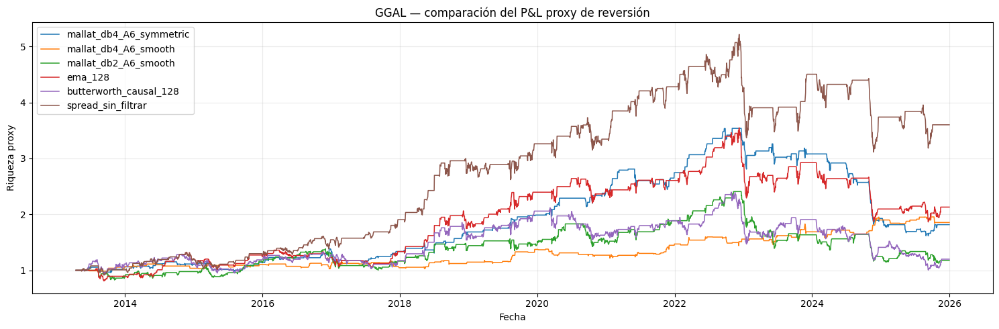

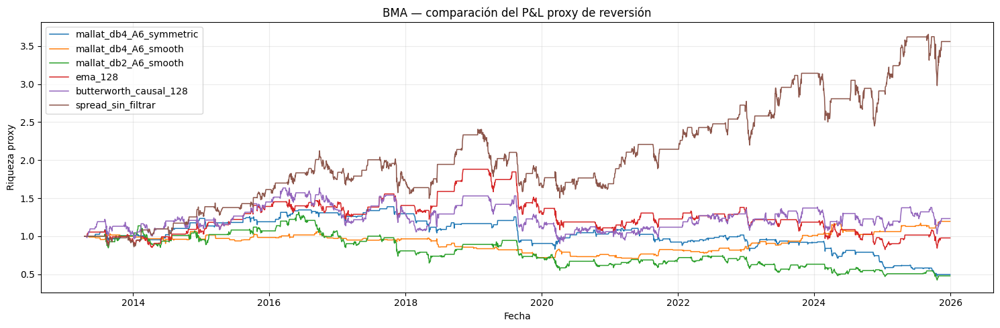

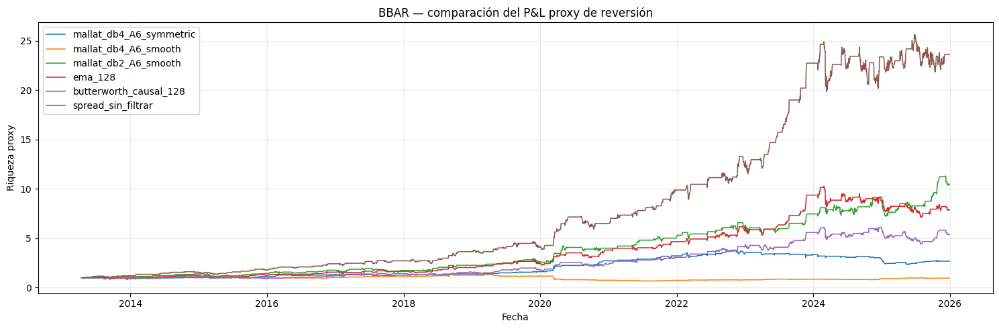

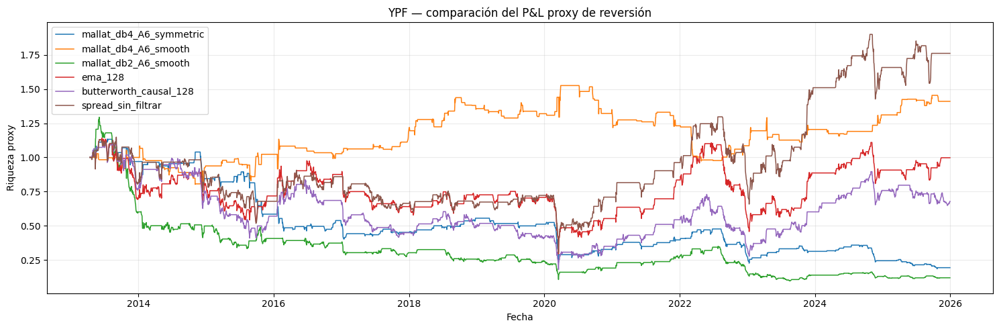

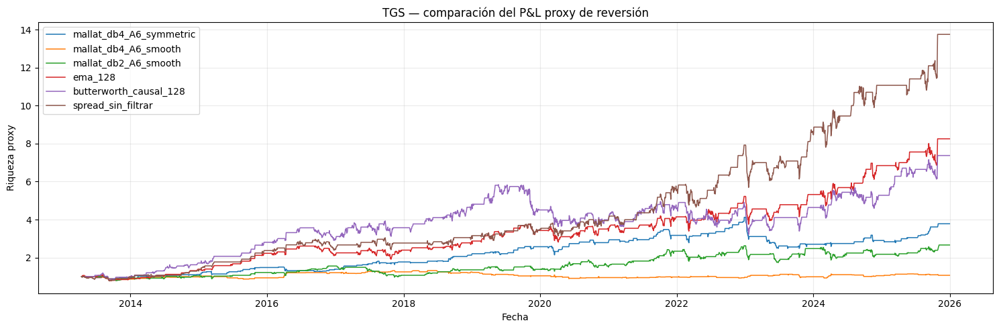

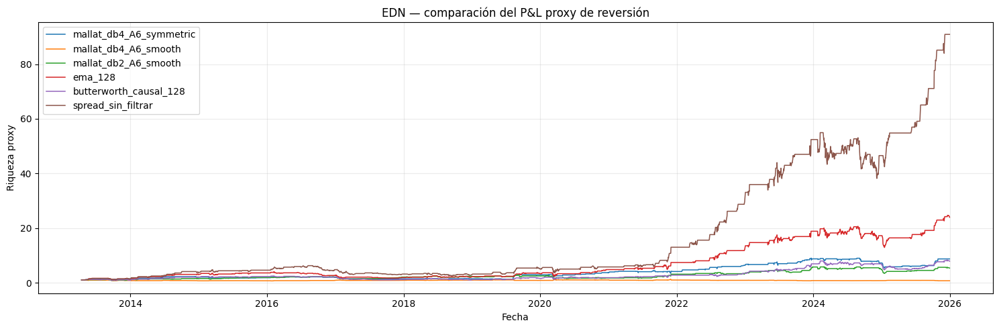

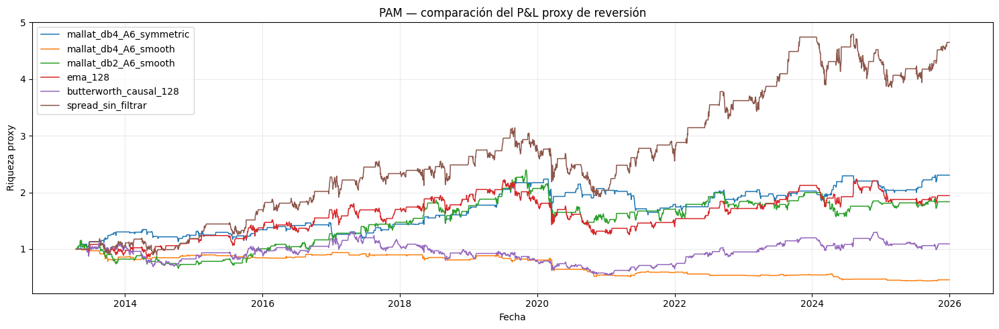

In [70]:
for ticker in spreads_df.columns:
    plt.figure(figsize=(15, 5))

    for metodo in zscores_metodos:
        resultado = backtests_proxy[(metodo, ticker)]

        plt.plot(
            resultado.index,
            resultado["riqueza_proxy"],
            label=metodo,
            linewidth=1.1
        )

    plt.title(
        f"{ticker} — comparación del P&L proxy de reversión"
    )
    plt.xlabel("Fecha")
    plt.ylabel("Riqueza proxy")
    plt.legend()
    plt.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()

## 8.10 Cómo interpretar la comparación final

Un método es más convincente cuando combina:

- cantidad suficiente de eventos;
- convergencia dinámica alta;
- reducción alta contra referencia fija;
- reversión real del spread en horizontes posteriores;
- extensión adversa controlada;
- resultados similares entre validación y test;
- desempeño comparable al cambiar el tratamiento del borde;
- mejora frente a EMA, Butterworth causal y spread sin filtrar.

No alcanza con que el residuo vuelva a cero. Si la convergencia dinámica es alta pero el spread no se acerca a la referencia inicial, la aparente reversión puede deberse a que la referencia móvil se adaptó al nuevo nivel.

Tampoco corresponde afirmar “pair trading rentable” a partir del P&L proxy. Para esa conclusión se necesita reconstruir las dos patas negociables con los índices *leave-one-out*, los hedge ratios históricos, precios ajustados, costos y restricciones operativas.

In [71]:
if not resumen_eventos_metodo.empty:
    columnas_clave = [
        "metodo",
        "eventos",
        "tasa_convergencia_dinamica",
        "tasa_reduccion_fija_50",
        "tasa_reversion_spread_20",
        "reversion_media_20",
        "mediana_extension_adversa_z"
    ]

    tabla_decision = resumen_eventos_metodo[
        columnas_clave
    ].merge(
        resumen_proxy_metodo[
            [
                "metodo",
                "sharpe_proxy_mediano",
                "drawdown_proxy_mediano",
                "operaciones_totales"
            ]
        ],
        on="metodo",
        how="left"
    )

    display(
        tabla_decision.style.format(
            {
                "tasa_convergencia_dinamica": "{:.1%}",
                "tasa_reduccion_fija_50": "{:.1%}",
                "tasa_reversion_spread_20": "{:.1%}",
                "sharpe_proxy_mediano": "{:.3f}",
                "drawdown_proxy_mediano": "{:.1%}"
            }
        )
    )

,metodo,eventos,tasa_convergencia_dinamica,tasa_reduccion_fija_50,tasa_reversion_spread_20,reversion_media_20,mediana_extension_adversa_z,sharpe_proxy_mediano,drawdown_proxy_mediano,operaciones_totales
0,spread_sin_filtrar,560,97.5%,90.0%,57.1%,0.017472,0.543133,0.540,-38.7%,480
1,butterworth_causal_128,506,94.3%,85.8%,53.8%,0.008627,0.531710,0.072,-58.2%,429
2,ema_128,555,98.9%,84.5%,55.9%,0.016092,0.494840,0.315,-47.5%,492
3,mallat_db4_A6_symmetric,993,100.0%,84.4%,53.6%,0.005784,0.165119,0.454,-45.1%,998
4,mallat_db2_A6_smooth,527,99.4%,81.2%,54.5%,0.005181,0.469275,0.224,-52.2%,527
5,mallat_db4_A6_smooth,1107,100.0%,58.0%,48.2%,0.000834,0.042504,0.040,-36.2%,1120


# Conclusión del pipeline Personas 1–4

El pipeline integrado queda organizado de la siguiente manera:

1. **Persona 1:** obtiene y valida precios ajustados.
2. **Persona 2:** construye índices *leave-one-out* y spreads relativos.
3. **Persona 3:** describe las escalas con FFT y Mallat, genera una referencia rolling ex ante y produce residuos.
4. **Persona 4:** normaliza los residuos, detecta eventos independientes, distingue convergencia dinámica de reversión real y compara Mallat con baselines causales.

La decisión sobre la configuración final no se toma por apariencia visual ni por una única riqueza terminal. Se toma utilizando entrenamiento y validación, y se confirma en test mediante estabilidad de eventos, reducción contra referencia fija, reversión del spread y sensibilidad al método de borde.

## 8.11 Exportación opcional de resultados de Persona 4

Los archivos exportados contienen eventos, resúmenes y métricas proxy. No contienen un backtest financiero de las dos patas.

In [72]:
EXPORTAR_RESULTADOS_PERSONA_4 = False

if EXPORTAR_RESULTADOS_PERSONA_4:
    OUTPUT_DIR_P4 = Path(
        "data/resultados_persona_4"
    )
    OUTPUT_DIR_P4.mkdir(
        parents=True,
        exist_ok=True
    )

    eventos_df.to_csv(
        OUTPUT_DIR_P4 / "eventos_divergencias.csv",
        index=False
    )

    resumen_eventos_ticker.to_csv(
        OUTPUT_DIR_P4 / "resumen_eventos_ticker.csv",
        index=False
    )

    resumen_eventos_metodo.to_csv(
        OUTPUT_DIR_P4 / "resumen_eventos_metodo.csv",
        index=False
    )

    metricas_proxy_df.to_csv(
        OUTPUT_DIR_P4 / "metricas_proxy_ticker.csv",
        index=False
    )

    resumen_proxy_metodo.to_csv(
        OUTPUT_DIR_P4 / "resumen_proxy_metodo.csv",
        index=False
    )

    print(
        "Resultados de Persona 4 guardados en:",
        OUTPUT_DIR_P4.resolve()
    )